# import files/libraries

In [2]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
from matplotlib import pyplot
import pandas as pd
import pandas_datareader as pdr
import io
import os
from scipy.stats import pearsonr
import itertools
import random
from random import sample 
import time
import pickle
import seaborn as sns
import dateutil.parser
from dateutil.parser import parse
from scipy.stats import f_oneway

import xgboost 
from xgboost import XGBClassifier

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import accuracy_score
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import KFold

#TF and Keras for neural net:
import tensorflow as tf
import keras
from keras.datasets import imdb
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras import layers
from keras.models import Sequential
from keras.layers import Dense
from keras.preprocessing import sequence
from tensorflow.keras.optimizers import SGD
from keras.layers import Dense, Dropout, LSTM
from keras.optimizers import Adam
from keras.models import model_from_json

# !pip install shap
# #!pip install git+https://github.com/slundberg/shap.git
# import shap

/usr/local/lib/python3.6/dist-packages/pandas_datareader/compat/__init__.py:7: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  from pandas.util.testing import assert_frame_equal


In [3]:
# upload the file into google colab
from google.colab import files
uploaded = files.upload()

Saving vxx.csv to vxx.csv


# Functions


In [4]:
def pct(df): # make the list differenced by pct, return the same lenght.
  lst = [0]
  for i in range(1,len(df)):
    lst.append(df[i]/df[i-1]-1)
  return lst

def stdev(df, days): # returns the stdev of past 'days' days including today.
  lst = (days-1)*[0]
  for i in range(days,len(df)+1):
    lst.append(np.std(df[i-days:i]))
  return lst

def HV(df, days): # returns the HV of past 'days' days including today.
  lst = (days-1)*[0]
  for i in range(days,len(df)+1):
    lst.append(round(100*np.std(df[i-days:i])*256**0.5,1))
  return lst
# https://www.danielstrading.com/education/technical-analysis-learning-center/historic-volatility
# https://www.fool.com/knowledge-center/how-to-calculate-annualized-volatility.aspx

def HV_modified(df, days): # returns the HV of past 'days' days including today + days are watered down.
  lst = (days-1)*[0]
  df = [x if x<0 else x/4 for x in df]
  for i in range(days,len(df)+1):
    lst.append(round(100*np.std(df[i-days:i])*21**0.5,1))
  return lst

def pct_fwd(df, days, value = 0): # returns the gain/loss of 'days' days forward refereneced to today.
  lst = []
  for i in range(len(df)-days):
    lst.append(df[i+days-1]/df[i] - 1)
  for j in range(days):
    lst.append(value)
  return lst

def ema(df, EMA_days):# returns the ema of past 'sma_days' days including today.
    sma = np.mean(df[0:EMA_days])
    EMA_list = [0] * (EMA_days - 1)
    EMA_list.append(sma)
    c = 2/(1+EMA_days)
    for i in range(EMA_days,len(df)):
        a = EMA_list[i-1]*(1-c)+ c*df[i]
        EMA_list.append(a)
    return(EMA_list)

def sma(df, sma_days):# returns the sma of past 'sma_days' days including today.
    sma_list = [0] * (sma_days - 1)
    for i in range(sma_days, len(df)+1):
        sma_list.append(np.mean(df[i-sma_days:i]))
    return(sma_list)

# returns two lists of resistance (max) and support (min) over past 'days' days including today
def sup_res(df, days): 
  maxs = [0]*(days - 1)
  mins = [0]*(days - 1)
  for i in range(days, len(df)+1): # len(df)+1 because range does not count the last int.
    mx = max(df[i-days:i])
    mn = min(df[i-days:i])
    maxs.append(mx)
    mins.append(mn)
  return maxs, mins #resistance and support

def slopes(df, days): #returns the slope of past 'days' days including today.
  slopelist = (days-1)*[0]
  for i in range(days,len(df)+1):
    slopelist.append(np.polyfit(np.asarray((range(0,days))),np.asarray(df[i-days:i]),1)[0])
  return slopelist

def pretty_print_conf_matrix(y_true, y_pred, classes,normalize=False,title='Confusion matrix',cmap=plt.cm.Blues):
    cm = confusion_matrix(y_true, y_pred)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=14)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    plt.ylabel('True label', fontsize=12)
    plt.xlabel('Predicted label', fontsize=12)
    if normalize:
        cm = np.round(cm.astype('float') / cm.sum(),2) 
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],horizontalalignment="center",color="white" if cm[i, j] > thresh else "black",
                 fontsize=12)
    plt.show()
        
#fix random effect
def fix_rnd_Keras():
    seed_value= 0
    os.environ['PYTHONHASHSEED']=str(seed_value)
    random.seed(seed_value)
    np.random.seed(seed_value)
    import tensorflow as tf
    tf.random.set_seed(seed_value)
    from keras import backend as K
    session_conf =  tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
    sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
    tf.compat.v1.keras.backend.set_session(sess)

# returns a 3D version of x (number of samples, time steps (window), features) and 2D version of y for LSTM.
# gap defines the overlap between samples, gap = 1: max overlap, gap = window: no overlap
def windower(x,y, window, gap): 
  i = 0
  data_X, data_Y = [], []
  x = np.asarray(x)
  while i in range(len(x) - window):
      data_X.append(x[i:(i + window), :])
      data_Y.append(y[i + window-1])
      i += gap
  return np.asarray(data_X), np.reshape(data_Y,(-1,1))

# return the split of test and train for LSTM: requires lenght to be divisible to batch_size for stateful LSTM
def test_train_split(x, y, batch_size, train_ratio):       
    train_length = int(len(x)*train_ratio)
    for i in range(train_length, train_length+batch_size):
        remainder = i%batch_size
        if remainder == 0:
            train_length = i
            break
    x_train = x[:train_length,:]
    y_train = y[:train_length]

    for i in range(len(x)-batch_size, len(x)):
        remainder = i%batch_size
        if remainder == 0:
            train_length_test = i
            break
    x_test = x[train_length:train_length_test,:]
    y_test = y[train_length:train_length_test]
    return x_train, y_train, x_test, y_test

# One hot encoding of categorical features. 
def OHE(df):
    x = np.asarray(df)
    encoded_x = None
    for i in range(0, x.shape[1]):
      label_encoder = LabelEncoder()
      feature = label_encoder.fit_transform(x[:,i])
      feature = feature.reshape(x.shape[0], 1)
      onehot_encoder = OneHotEncoder(sparse=False, categories='auto')
      feature = onehot_encoder.fit_transform(feature)
      if encoded_x is None:
          encoded_x = feature
      else:
              encoded_x = np.concatenate((encoded_x, feature), axis=1)
    return encoded_x

def sloper(vxx, ema_days, slope_days, l_thresh, h_thresh, mx_thresh, vvix_thresh): # returns labels based on the threshhold on the slope
  color = []
  vxx['vix_slop'] = slopes(ema(vxx.vix,ema_days),slope_days)
  vxx['mx'] = maxer(vxx.vix,10)
  vxx['vvix'] = HV(pct(vxx.vix), 10)
  for i in range(len(vxx)):
    if vxx.vix_slop[i] > h_thresh:
      color.append('red')
    elif vxx.vix_slop[i] < h_thresh and vxx.vix_slop[i] > l_thresh:
      color.append('orange')
    elif vxx.vix_slop[i] > -l_thresh and vxx.vix_slop[i] < l_thresh:
      color.append('green')
    elif vxx.vix_slop[i] < -l_thresh and vxx.vix_slop[i] > -h_thresh:
      color.append('blue')
    else:
      color.append('purple')
  for i in range(len(color)):
    if color[i] == 'green' and vxx['mx'][i] > mx_thresh:
        color[i] = 'purple'
    if color[i] == 'green' and vxx['vvix'][i] > vvix_thresh:
        color[i] = 'purple'
  return color

def vix_status(vxx, sma_thresh, mx_thresh, vvix_thresh): #returns status of vix e.g. climbing, falling, flat, etc.
  status = [np.nan]*len(vxx)
  color = [np.nan]*len(vxx)
  vxx['vvix'] = HV(pct(vxx.vix), 10)
  for i in range(len(vxx)):
    if vxx.vix_sma_20[i] < sma_thresh and vxx.vix_sma_20[i] > -sma_thresh:
      if vxx.mx_20[i] > mx_thresh and vxx['vvix'][i]<vvix_thresh:
        status[i] = 'calm_fall'
        color[i] = 'blue'
      elif vxx.mx_20[i] < mx_thresh and vxx['vvix'][i]<vvix_thresh:
        status[i] = 'calm'
        color[i] = 'green'
      else:
        status[i] = 'yellow'
        color[i] = 'yellow'
    elif vxx.vix_sma_20[i] < -sma_thresh:
      status[i] = 'sharp_fall'
      color[i] = 'purple'
    else:
      if vxx.mx_20[i] > mx_thresh:
        status[i] = 'fall of peak'
        color[i] = 'orange'
      else:
        status[i] = 'peaking'
        color[i] = 'red'
  return status, color

def maxer(df, days): #returns the difference between max in past 'days' periods and today, in %
  maxs = [np.nan]*(days-1)
  for i in range(days, len(df)+1): # len(df)+1 because range does not count the last int.
    mx = max(df[i-days:i])
    maxs.append(mx/df[i-1]-1)
  return maxs

def accum_pct(df, days): # returns sum of pct moves over past 'days' periods including today.
  pcts = [np.nan]*(days-1)
  for i in range(days,len(df)+1):
    pcts.append(sum(df[i-days:i]))
  return pcts

# VXX

### Load

In [54]:
vxx = pd.read_csv(io.BytesIO(uploaded['vxx.csv']))
vxx.columns = ['date', '1st', '2nd', 'n_1st', 'n_2nd', 'n_t', 'weighted', 'cont', 'vix', 'remove', 'vxx']
vxx.drop(['1st', '2nd', 'n_1st', 'n_2nd', 'n_t', 'remove'], axis = 1, inplace=True)
spy = pdr.get_data_yahoo('SPY', start= '2004-03-26', end = '2020-07-17')
vxx['spy'] = list(spy['Close'])
vxx['spy_pct'] = pct(list(spy['Close']))
vxx['fwd_1'] = pct_fwd(vxx.vxx, 2)
vxx['fwd_5'] = pct_fwd(vxx.vxx, 5)
vxx['fwd_10'] = pct_fwd(vxx.vxx, 10)
vxx['fwd_20'] = pct_fwd(vxx.vxx, 20)
vxx['fwd_40'] = pct_fwd(vxx.vxx, 40)
vxx['fwd_20_vix'] = pct_fwd(vxx.vix, 20)
vxx['pct'] = pct(vxx.vxx)
vxx['date'] = [dateutil.parser.parse(x) for x in vxx['date']]

# vxx['sma_20'] = sma(vxx.vix, 20)
# vxx['vix_sma_20'] = vxx.vix/vxx['sma_20']-1
# vxx['mx_20'] = maxer(vxx.vix,10)
# vxx['vix_slop'] = slopes(ema(vxx.vix,8),5)
vxx['hv_21'] = HV(vxx.spy_pct, 21)
vxx['hv_10'] = HV(vxx.spy_pct, 10)

# vxx['status'], color = vix_status(vxx, 0.15,0.2, 110)
vxx.cont = vxx.weighted/vxx.vix-1
vxx['fut_pct'] = pct(vxx.weighted)
vxx['fut_acc_20'] = accum_pct(vxx.fut_pct, 20)
vxx['vix_pct'] = pct(vxx.vix)
vxx['vix_acc_20'] = accum_pct(vxx.vix_pct, 20)
vxx = vxx[19:] 
vxx.reset_index(inplace=True, drop = True)
vxx.head(6)

,date,weighted,cont,vix,vxx,spy,spy_pct,fwd_1,fwd_5,fwd_10,fwd_20,fwd_40,fwd_20_vix,pct,hv_21,hv_10,fut_pct,fut_acc_20,vix_pct,vix_acc_20
0,2004-04-23,17.50,0.249108,14.01,377558.0,114.360001,0.000963,-0.011315,0.024545,0.010523,0.023633,-0.136888,0.332620,0.001196,0.0,14.4,0.004592,-0.142939,-0.041068,-0.182396
1,2004-04-26,17.39,0.177387,14.77,373286.0,114.199997,-0.001399,-0.017400,0.057165,0.055968,0.026256,-0.151029,0.251862,-0.011315,11.7,14.3,-0.006286,-0.149225,0.054247,-0.128149
2,2004-04-27,17.17,0.139350,15.07,366791.0,114.300003,0.000876,0.032062,0.044519,0.115791,0.021061,-0.183791,0.199735,-0.017400,11.7,12.3,-0.012651,-0.136285,0.020311,-0.059943
3,2004-04-28,17.81,0.093309,16.29,378551.0,112.820000,-0.012948,0.021857,-0.001574,0.047581,-0.074761,-0.196304,-0.020258,0.032062,11.8,14.0,0.037274,-0.090930,0.080956,0.034346
4,2004-04-29,18.30,0.102410,16.60,386825.0,111.830002,-0.008775,0.020164,-0.052796,0.008805,-0.089195,-0.204834,-0.037952,0.021857,12.1,14.5,0.027513,-0.070037,0.019030,0.025120
5,2004-04-30,18.76,0.091332,17.19,394625.0,110.959999,-0.007780,-0.029154,-0.033181,-0.010374,-0.119121,-0.214667,-0.111111,0.020164,12.3,14.0,0.025137,-0.037313,0.035542,0.066039


### Check accuracy of Data

,date,weighted,cont,vix,vxx,fwd_10,fwd_20,fwd_40,fwd_20_vix,pct,High_x,Low_x,Open_x,Close_x,Volume_x,Adj Close_x,Date,VIX Open,VIX High,VIX Low,VIX Close,High_y,Low_y,Open_y,Close_y,Volume_y,Adj Close_y
0,2018-01-25,12.60,0.088083,11.58,29.09,0.665521,0.548298,0.682365,0.616580,0.013589,284.269989,282.399994,284.160004,283.299988,84587300.0,270.068909,2018-01-25,11.27,12.01,11.20,11.58,27.66,27.66,27.66,27.66,0,27.66
1,2018-01-26,12.58,0.135379,11.08,28.98,0.863009,0.454451,0.779503,0.488267,-0.003781,286.630005,283.959991,284.250000,286.579987,107743100.0,273.195648,2018-01-26,11.40,11.60,11.08,11.08,27.66,27.66,27.66,27.66,0,27.66


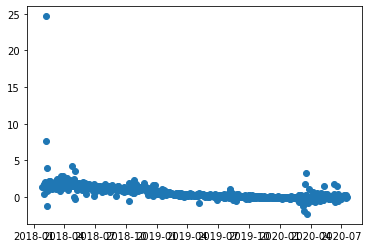

In [ ]:
VXX_ = pdr.get_data_yahoo('VXX', start= '2004-03-26', end = '2020-07-17')
vix = pd.read_csv('http://www.cboe.com/publish/scheduledtask/mktdata/datahouse/vixcurrent.csv')
vix.columns = ['Date' ,	'VIX Open' ,	'VIX High' ,	'VIX Low' ,	'VIX Close']
vix = vix.drop([0])
vix['Date'] = [dateutil.parser.parse(x) for x in vix['Date']]
vix ['VIX Close']= [float(x) for x in vix['VIX Close']]
df = pd.merge(vxx, spy, left_on='date', right_on='Date', how= 'inner')
df = pd.merge(df, vix, left_on='date', right_on='Date', how= 'inner')
df = pd.merge(df, VXX_, left_on='date', right_on='Date', how= 'inner')
plt.scatter(df.date, df.vxx - df['Close_y'])
df.head(2)

## EDA

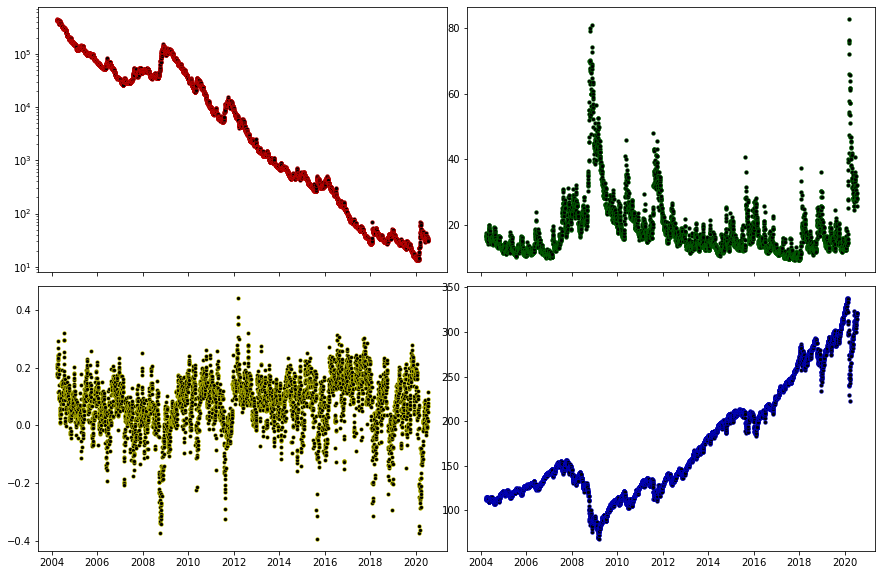

In [ ]:
fig, ax = plt.subplots(2, 2, sharex=True, sharey=False, figsize=(15,10))
fig.subplots_adjust(hspace= 0.051, wspace=0.0510)
plt.rcParams.update({'font.size': 16})
ax[0,0].scatter(vxx.date, vxx.vxx, marker = 'o', linewidth=0.4,edgecolor='red', color = 'black', s = 15)
ax[0,0].set_yscale('log')
ax[0,1].scatter(vxx.date, vxx.vix, marker = 'o', linewidth=0.4,edgecolor='green', color = 'black', s = 15)
ax[1,0].scatter(vxx.date, vxx.cont, marker = 'o', linewidth=0.4,edgecolor='yellow', color = 'black', s = 15)
ax[1,1].scatter(vxx.date, spy.Close, marker = 'o', linewidth=0.4,edgecolor='blue', color = 'black', s = 15);

### HV IV

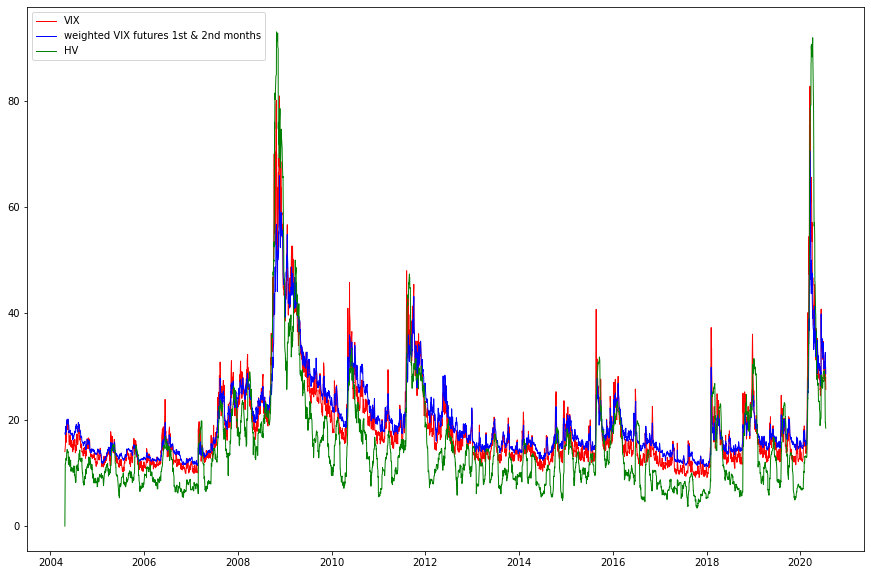

In [ ]:
plt.figure(figsize=(15,10))
plt.plot(vxx.date, vxx.vix, linewidth=0.99, color = 'red')
plt.plot(vxx.date, vxx.weighted, linewidth=0.99, color = 'blue')
plt.plot(vxx.date,vxx.hv_21, linewidth=0.99, color = 'green')
plt.legend(['VIX', 'weighted VIX futures 1st & 2nd months', 'HV']);

correlation between HV-VIX and VXX = -0.06
correlation between HV-VIX and VIX = 0.01


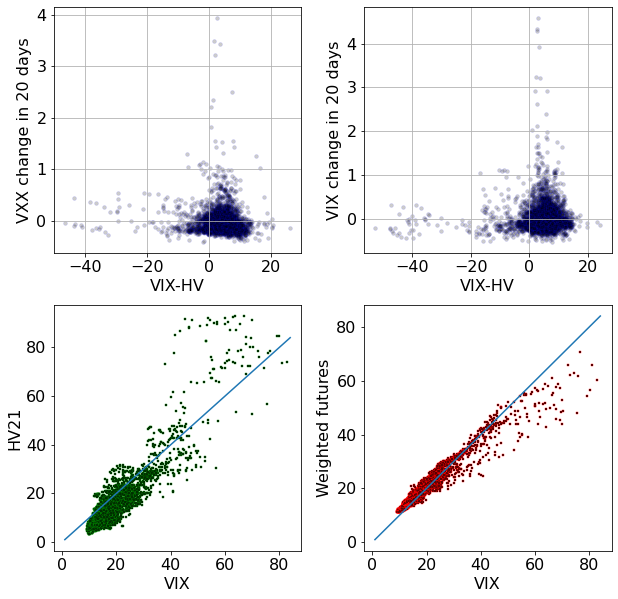

In [ ]:
fig, ax = plt.subplots(2, 2, sharex=False, sharey=False, figsize=(10,10))
fig.subplots_adjust(hspace= 0.21, wspace=0.2510)
plt.rcParams.update({'font.size': 16})
ax[0,0].scatter(vxx.vix-vxx.hv_21, vxx.fwd_20, marker = 'o', linewidth=0.4,edgecolor='blue', color = 'black', s = 15, alpha=0.2)
ax[0,0].set(xlabel='VIX-HV')
ax[0,0].set(ylabel='VXX change in 20 days')
ax[0,0].grid()
ax[0,1].scatter(vxx.weighted-vxx.hv_21, vxx.fwd_20_vix, marker = 'o', linewidth=0.4,edgecolor='blue', color = 'black', s = 15, alpha=0.2)
ax[0,1].set(xlabel='VIX-HV')
ax[0,1].set(ylabel='VIX change in 20 days')
ax[0,1].grid()
ax[1,0].scatter(vxx.vix, vxx.hv_21, marker = 's', linewidth=0.4,edgecolor='green', color = 'black', s = 5)
ax[1,0].plot(list(range(1,85)),list(range(1,85)))
ax[1,0].set(xlabel='VIX')
ax[1,0].set(ylabel='HV21')
ax[1,1].scatter(vxx.vix, vxx.weighted, marker = 's', linewidth=0.4,edgecolor='red', color = 'black', s = 5)
ax[1,1].plot(list(range(1,85)),list(range(1,85)))
ax[1,1].set(xlabel='VIX')
ax[1,1].set(ylabel='Weighted futures');
cor, _  = pearsonr(vxx.vix-vxx.hv_21, vxx.fwd_20)
print('correlation between HV-VIX and VXX = %.2f'% (cor))
cor, _  = pearsonr(vxx.vix-vxx.hv_21, vxx.fwd_20_vix)
print('correlation between HV-VIX and VIX = %.2f'% (cor))

### VIX-Futures elasitcity

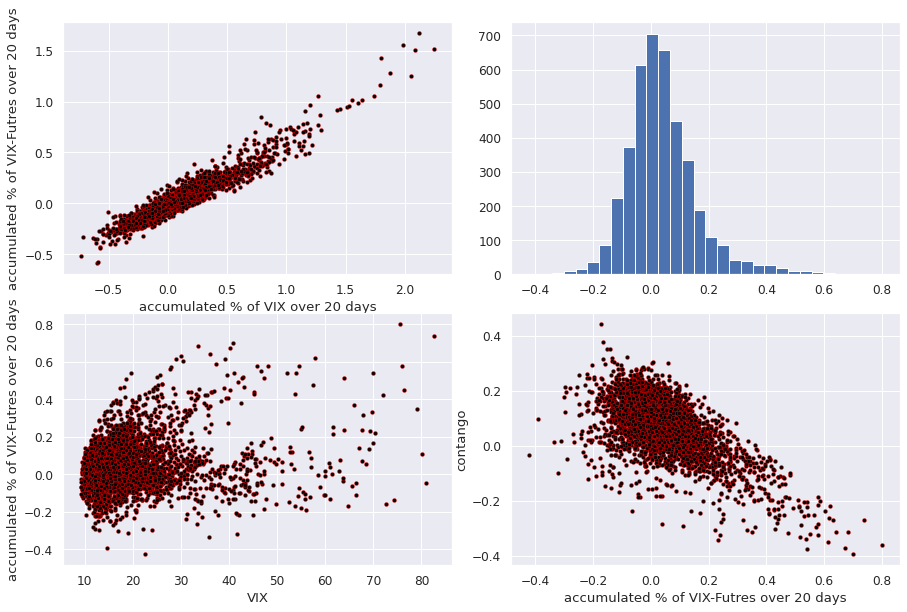

In [65]:
fig, ax = plt.subplots(2, 2, sharex=False, sharey=False, figsize=(15,10))
fig.subplots_adjust(hspace= 0.151, wspace=0.1510)
plt.rcParams.update({'font.size': 16})
ax[0,0].scatter(vxx.vix_acc_20, vxx.fut_acc_20, marker = 'o', linewidth=0.4,edgecolor='red', color = 'black', s = 15);


ax[0,0].set(ylabel='VXX change in 20 days')
ax[0,0].set(xlabel='accumulated % of VIX over 20 days')
ax[0,0].set(ylabel='accumulated % of VIX-Futres over 20 days')

ax[0,1].hist(vxx.vix_acc_20-vxx.fut_acc_20, 30);
ax[1,0].scatter(vxx.vix, vxx.vix_acc_20-vxx.fut_acc_20, marker = 'o', linewidth=0.4,edgecolor='red', color = 'black', s = 15)
ax[1,0].set(xlabel='VIX')
ax[1,0].set(ylabel='accumulated % of VIX-Futres over 20 days')
ax[1,1].scatter(vxx.vix_acc_20-vxx.fut_acc_20, vxx.cont, marker = 'o', linewidth=0.4,edgecolor='red', color = 'black', s = 15);
ax[1,1].set(xlabel='accumulated % of VIX-Futres over 20 days')
ax[1,1].set(ylabel='contango');

### Cont/20_fwd

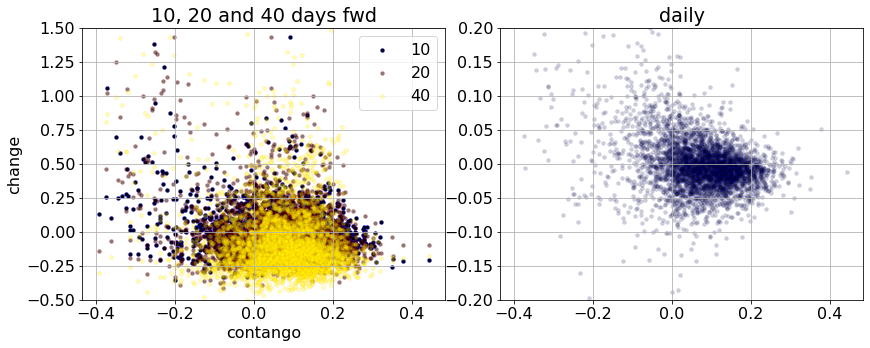

In [ ]:
fig, ax = plt.subplots(1, 2, sharex=True, sharey=False, figsize=(14,5))
fig.subplots_adjust(hspace= 0.051, wspace=0.1510)
plt.rcParams.update({'font.size': 16})
ax[0].scatter(vxx.cont, vxx.fwd_10, marker = 'o', linewidth=0.4,edgecolor='blue', color = 'black', s = 15, alpha = 0.99)
ax[0].scatter(vxx.cont, vxx.fwd_20, marker = 'o', linewidth=0.4,edgecolor='red', color = 'black', s = 15, alpha=0.5)
ax[0].scatter(vxx.cont, vxx.fwd_40, marker = 'o', linewidth=0.4,edgecolor='orange', color = 'yellow', s = 15, alpha=0.3)
ax[0].set_title('10, 20 and 40 days fwd')
ax[0].set(ylabel='change')
ax[0].set(xlabel='contango');
ax[0].grid()
ax[0].set_ylim([-0.5, 1.5])
ax[0].legend(['10', '20', '40'])
ax[1].scatter(vxx.cont, vxx.pct, marker = 'o', linewidth=0.4,edgecolor='blue', color = 'black', s = 15, alpha = 0.19)
ax[1].set_ylim([-0.2, 0.2])
ax[1].set_title('daily')
ax[1].grid();

this says, most data points are in contango, and most are positive return.
But it does not show correlation between return and contango. 

- daily return (mean, sum, median) and its correlation to contango/vix is not the same as return on backtesting a strategy because of volatility drag. +50% followed by -50% has mean of 0 and return of -25%.

- training a model that predict with 80% accuracy the direction of vxx in 20 days (let assume data is balanced) does not garantee good return of that 20% includes big drawdowns. 

- backtest vs ML
- ml with cont, sma/ema cont, and adding more features and see effect. 
- backtest on fragments of data, cont/HV-IV, SMA.
- read # of contracts, daily changes in vxx and futures, calculation and theory.

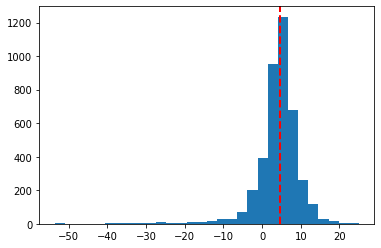

In [ ]:
plt.hist(vxx.vix-vxx.hv_10, 30)
plt.axvline((vxx.vix-vxx.hv_10).median(), color='red', linestyle='dashed', linewidth=2);

## Large Grid

In [ ]:
bins_cont = list(np.arange(-0.4,0.5,0.03))
cont_labels = list(np.arange(-0.39,0.5 ,0.03))
bins_vix = list(np.arange(9,85,3))
vix_labels = list(np.arange(10,84,3))
vxx['cont_bin'] = pd.cut(vxx['cont'], bins=bins_cont, labels=cont_labels)
vxx['vix_bin'] = pd.cut(vxx['vix'], bins=bins_vix, labels=vix_labels)
vxx.head(2)

,date,weighted,cont,vix,vxx,spy,spy_pct,fwd_1,fwd_5,fwd_10,fwd_20,fwd_40,fwd_20_vix,pct,cont_bin,vix_bin
0,2004-04-23,17.50,0.249108,14.01,377558.0,114.360001,0.000963,-0.011315,0.024545,0.010523,0.023633,-0.136888,0.332620,0.001196,0.24,13
1,2004-04-26,17.39,0.177387,14.77,373286.0,114.199997,-0.001399,-0.017400,0.057165,0.055968,0.026256,-0.151029,0.251862,-0.011315,0.18,13


In [72]:
bins_cont = [-0.4, -0.2, -0.1, 0, 0.05, 0.1, 0.5]
cont_labels = ['-0.4-0.2', '-0.2-0.1', '-0.1-0', '0-0.05', '0.05-0.1', '0.1-0.5']
bins_vix = [8,13,17,22,30, 45, 85]
vix_labels = ['8-13', '13-17', '17-22', '22-30', '30-45', '45-85']
slope_bins = [-5,-0.3,-0.2,0.2,0.3,5]
slope_labels = ['-0.3-', '-0.3-0.2','-0.2-0.2', '0.2-0.3', '0.3+']
vix_hv_bins = [-60,0,5,10,30]
vix_hv_labels = ['-0', '0-5', '5-10', '10+']
elastic_20_bins = [-0.5,-0.1,0,0.1,0.9]
elastic_20_labels = ['-0.1', '-0.1-0', '0-0.1', '0.1+']
vxx['cont_bin'] = pd.cut(vxx['cont'], bins=bins_cont, labels=cont_labels)
vxx['vix_bin'] = pd.cut(vxx['vix'], bins=bins_vix, labels=vix_labels)
vxx['vix_hv'] = vxx.vix-vxx.hv_10
vxx['hv_bin'] = pd.cut(vxx['vix_hv'], bins=vix_hv_bins, labels=vix_hv_labels)
vxx['elastic_20'] = vxx.vix_acc_20-vxx.fut_acc_20
vxx['elasctic_bins'] = pd.cut(vxx['elastic_20'], bins=elastic_20_bins, labels=elastic_20_labels)

#vxx['slope_bin'] = pd.cut(vxx['vix_slope'], bins=slope_bins, labels=slope_labels)
vxx.head(2)

,date,weighted,cont,vix,vxx,spy,spy_pct,fwd_1,fwd_5,fwd_10,fwd_20,fwd_40,fwd_20_vix,pct,hv_21,hv_10,fut_pct,fut_acc_20,vix_pct,vix_acc_20,cont_bin,vix_bin,vix_hv,hv_bin,elastic_20,elasctic_bins
0,2004-04-23,17.50,0.249108,14.01,377558.0,114.360001,0.000963,-0.011315,0.024545,0.010523,0.023633,-0.136888,0.332620,0.001196,0.0,14.4,0.004592,-0.142939,-0.041068,-0.182396,0.1-0.5,13-17,-0.39,-0,-0.039456,-0.1-0
1,2004-04-26,17.39,0.177387,14.77,373286.0,114.199997,-0.001399,-0.017400,0.057165,0.055968,0.026256,-0.151029,0.251862,-0.011315,11.7,14.3,-0.006286,-0.149225,0.054247,-0.128149,0.1-0.5,13-17,0.47,0-5,0.021076,0-0.1


### Elasticity VIX/futures

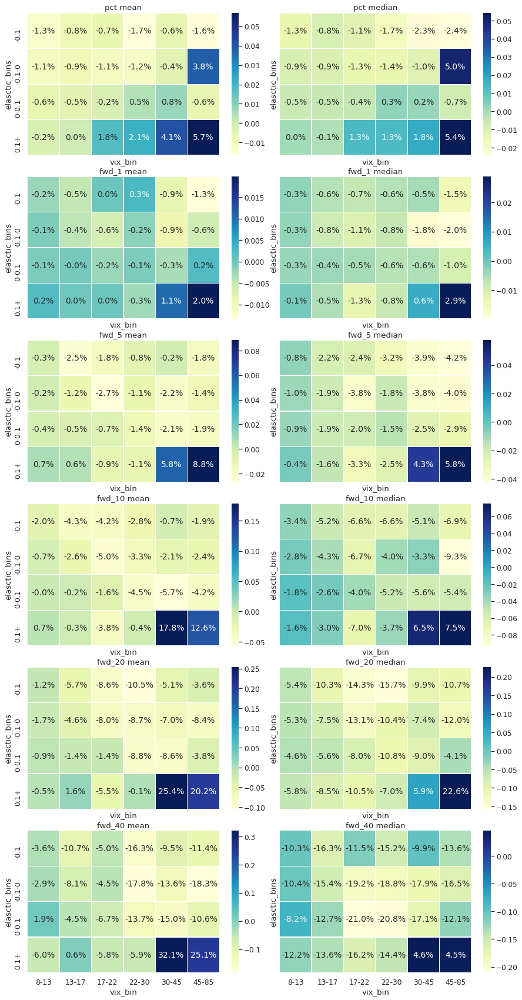

In [50]:
df = vxx.copy(deep=True)
fig, ax = plt.subplots(6, 2, sharex=True, sharey=True, figsize=(15,30))
fig.subplots_adjust(hspace= 0.151, wspace=0.0510)
plt.rcParams.update({'font.size': 16})
sns.set(font_scale=1.1)

pivot_sum = df.pivot_table(index = 'elasctic_bins', columns= 'vix_bin', values='pct', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[0,0])
ax[0,0].set_title('pct mean')
pivot_sum = df.pivot_table(index = 'elasctic_bins', columns= 'vix_bin', values='pct', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[0,1])
ax[0,1].set_title('pct median')

pivot_sum = df.pivot_table(index = 'elasctic_bins', columns= 'vix_bin', values='fwd_1', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[1,0])
ax[1,0].set_title('fwd_1 mean')
pivot_sum = df.pivot_table(index = 'elasctic_bins', columns= 'vix_bin', values='fwd_1', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[1,1])
ax[1,1].set_title('fwd_1 median')

pivot_sum = df.pivot_table(index = 'elasctic_bins', columns= 'vix_bin', values='fwd_5', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[2,0])
ax[2,0].set_title('fwd_5 mean')
pivot_sum = df.pivot_table(index = 'elasctic_bins', columns= 'vix_bin', values='fwd_5', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[2,1])
ax[2,1].set_title('fwd_5 median')

pivot_sum = df.pivot_table(index = 'elasctic_bins', columns= 'vix_bin', values='fwd_10', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[3,0])
ax[3,0].set_title('fwd_10 mean')
pivot_sum = df.pivot_table(index = 'elasctic_bins', columns= 'vix_bin', values='fwd_10', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[3,1])
ax[3,1].set_title('fwd_10 median')

pivot_sum = df.pivot_table(index = 'elasctic_bins', columns= 'vix_bin', values='fwd_20', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[4,0])
ax[4,0].set_title('fwd_20 mean')
pivot_sum = df.pivot_table(index = 'elasctic_bins', columns= 'vix_bin', values='fwd_20', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[4,1])
ax[4,1].set_title('fwd_20 median')

pivot_sum = df.pivot_table(index = 'elasctic_bins', columns= 'vix_bin', values='fwd_40', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[5,0])
ax[5,0].set_title('fwd_40 mean')
pivot_sum = df.pivot_table(index = 'elasctic_bins', columns= 'vix_bin', values='fwd_40', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[5,1])
ax[5,1].set_title('fwd_40 median');

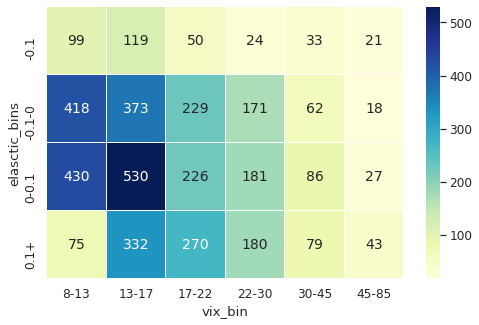

In [51]:
pivot_sum = df.pivot_table(index = 'elasctic_bins', columns= 'vix_bin', values='pct', aggfunc=np.count_nonzero)
fig, ax = plt.subplots(figsize=(8,5))
sns.set(font_scale=1.1)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='g', annot_kws={"fontsize":14}, ax = ax);

### sum vix-cont bins

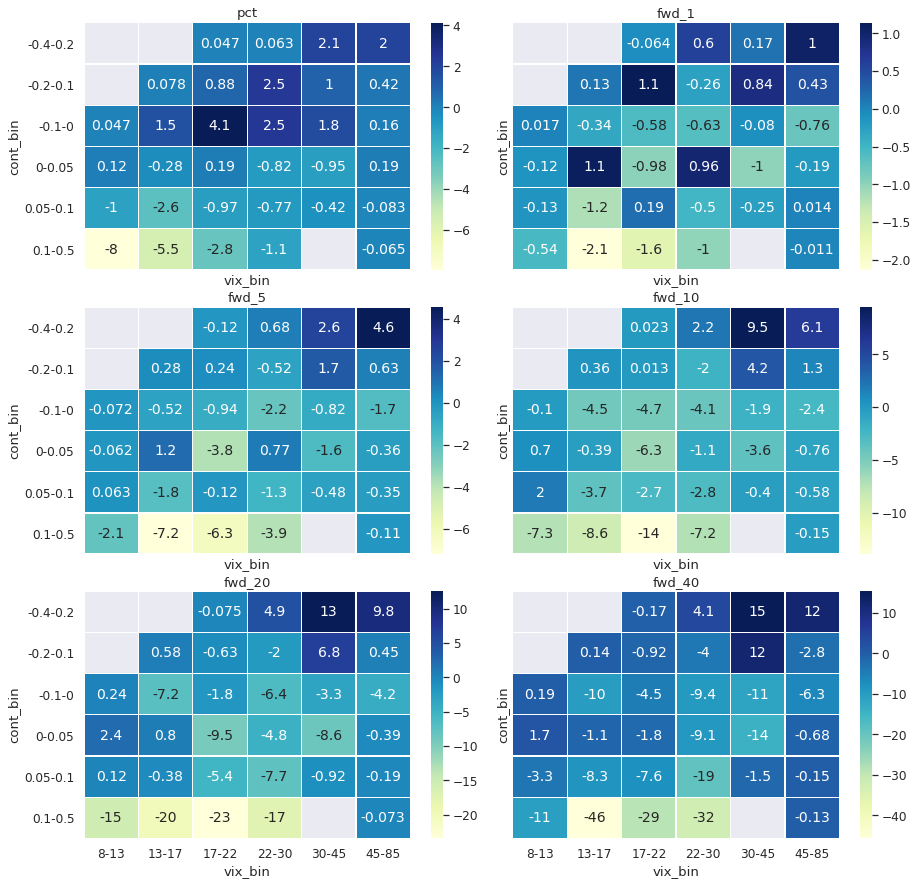

In [ ]:
df = vxx.copy(deep=True)
fig, ax = plt.subplots(3, 2, sharex=True, sharey=True, figsize=(15,15))
fig.subplots_adjust(hspace= 0.151, wspace=0.0510)
plt.rcParams.update({'font.size': 16})
sns.set(font_scale=1.1)
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='pct', aggfunc=np.sum)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, annot_kws={"fontsize":14}, ax = ax[0,0])
ax[0,0].set_title('pct')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_1', aggfunc=np.sum)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, annot_kws={"fontsize":14}, ax = ax[0,1])
ax[0,1].set_title('fwd_1')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_5', aggfunc=np.sum)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, annot_kws={"fontsize":14}, ax = ax[1,0])
ax[1,0].set_title('fwd_5')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_10', aggfunc=np.sum)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, annot_kws={"fontsize":14}, ax = ax[1,1])
ax[1,1].set_title('fwd_10')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_20', aggfunc=np.sum)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, annot_kws={"fontsize":14}, ax = ax[2,0])
ax[2,0].set_title('fwd_20')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_40', aggfunc=np.sum)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, annot_kws={"fontsize":14}, ax = ax[2,1])
ax[2,1].set_title('fwd_40');

comparing sums could be misleading as the number of days that are in each bin plays a role. A trade with 0.2% mean and 100 occurance performs worse than a trade with 0.1% with 1000 occurance, with the same standard deviation. 

### mean/median vix-cont bins

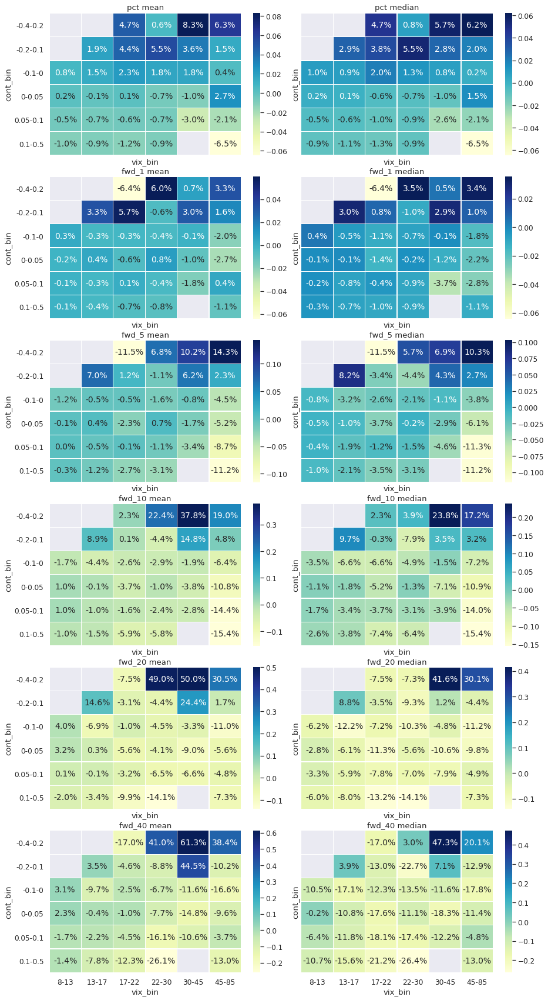

In [ ]:
df = vxx.copy(deep=True)
fig, ax = plt.subplots(6, 2, sharex=True, sharey=True, figsize=(15,30))
fig.subplots_adjust(hspace= 0.151, wspace=0.0510)
plt.rcParams.update({'font.size': 16})
sns.set(font_scale=1.1)

pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='pct', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[0,0])
ax[0,0].set_title('pct mean')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='pct', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[0,1])
ax[0,1].set_title('pct median')

pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_1', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[1,0])
ax[1,0].set_title('fwd_1 mean')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_1', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[1,1])
ax[1,1].set_title('fwd_1 median')

pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_5', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[2,0])
ax[2,0].set_title('fwd_5 mean')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_5', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[2,1])
ax[2,1].set_title('fwd_5 median')

pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_10', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[3,0])
ax[3,0].set_title('fwd_10 mean')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_10', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[3,1])
ax[3,1].set_title('fwd_10 median')

pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_20', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[4,0])
ax[4,0].set_title('fwd_20 mean')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_20', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[4,1])
ax[4,1].set_title('fwd_20 median')

pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_40', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[5,0])
ax[5,0].set_title('fwd_40 mean')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_40', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[5,1])
ax[5,1].set_title('fwd_40 median');

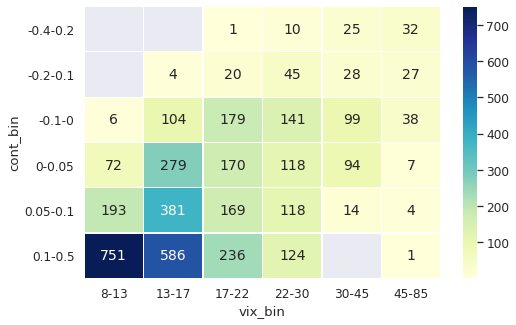

In [ ]:
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='pct', aggfunc=np.count_nonzero)
fig, ax = plt.subplots(figsize=(8,5))
sns.set(font_scale=1.1)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='g', annot_kws={"fontsize":14}, ax = ax);

- pct to fwd_1 squash out the trends to big extent.
- mean larger than median shows the outlier/skewness toward vix jumps.
- the lower the vix, the higher the skewness.
- in each vix bin, there is not much trend in return based on contango, but high vix and high contango is best perfromer and least skew, low vix and high contango most frequent with big skew, and high vix and high backwardation is worst short vol performer. 

### Vix status  and contango

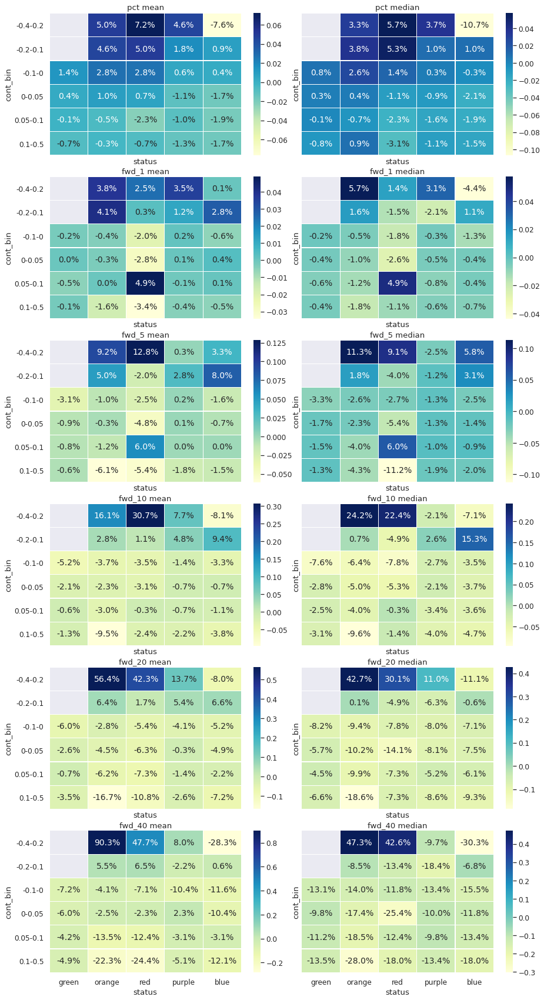

In [ ]:
df = vxx.copy(deep=True)
fig, ax = plt.subplots(6, 2, sharex=True, sharey=True, figsize=(15,30))
fig.subplots_adjust(hspace= 0.151, wspace=0.0510)
plt.rcParams.update({'font.size': 16})
sns.set(font_scale=1.1)

pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'status', values='pct', aggfunc=np.mean)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[0,0])
ax[0,0].set_title('pct mean')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'status', values='pct', aggfunc=np.median)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[0,1])
ax[0,1].set_title('pct median')

pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'status', values='fwd_1', aggfunc=np.mean)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[1,0])
ax[1,0].set_title('fwd_1 mean')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'status', values='fwd_1', aggfunc=np.median)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[1,1])
ax[1,1].set_title('fwd_1 median')

pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'status', values='fwd_5', aggfunc=np.mean)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[2,0])
ax[2,0].set_title('fwd_5 mean')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'status', values='fwd_5', aggfunc=np.median)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[2,1])
ax[2,1].set_title('fwd_5 median')

pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'status', values='fwd_10', aggfunc=np.mean)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[3,0])
ax[3,0].set_title('fwd_10 mean')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'status', values='fwd_10', aggfunc=np.median)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[3,1])
ax[3,1].set_title('fwd_10 median')

pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'status', values='fwd_20', aggfunc=np.mean)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[4,0])
ax[4,0].set_title('fwd_20 mean')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'status', values='fwd_20', aggfunc=np.median)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[4,1])
ax[4,1].set_title('fwd_20 median')

pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'status', values='fwd_40', aggfunc=np.mean)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[5,0])
ax[5,0].set_title('fwd_40 mean')
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'status', values='fwd_40', aggfunc=np.median)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[5,1])
ax[5,1].set_title('fwd_40 median');

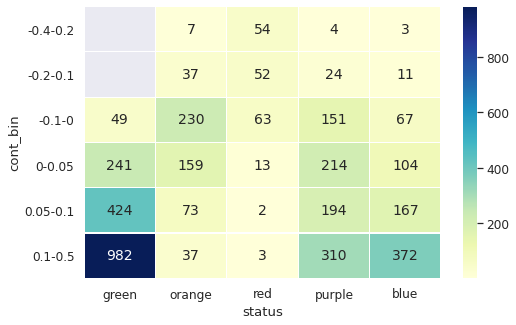

In [ ]:
df = vxx.copy(deep=True)
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'status', values='fwd_40', aggfunc=np.count_nonzero)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
fig, ax = plt.subplots(figsize=(8,5))
sns.set(font_scale=1.1)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, fmt='g', linewidths = 0.2, annot_kws={"fontsize":14}, ax = ax);

### Vix status  and vix

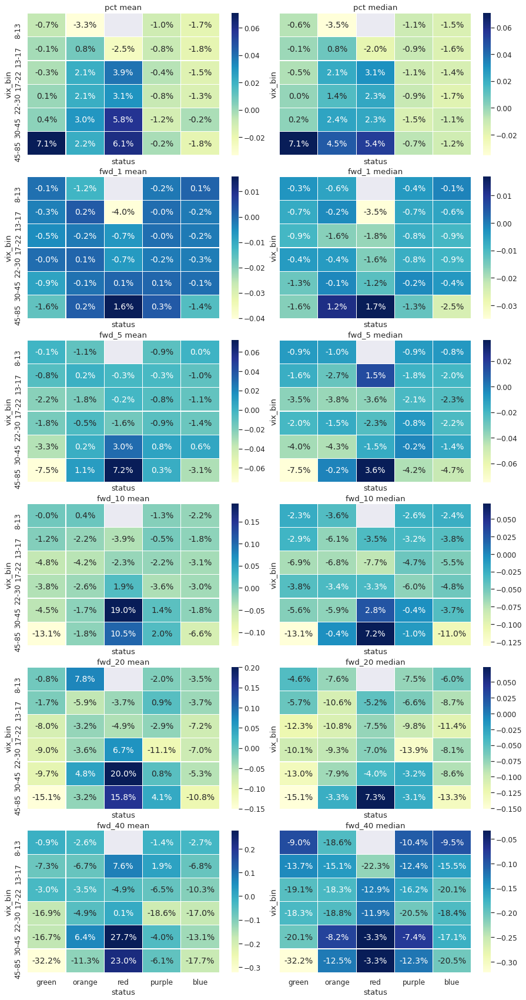

In [ ]:
df = vxx.copy(deep=True)
fig, ax = plt.subplots(6, 2, sharex=True, sharey=True, figsize=(15,30))
fig.subplots_adjust(hspace= 0.151, wspace=0.0510)
plt.rcParams.update({'font.size': 16})
sns.set(font_scale=1.1)

pivot_sum = df.pivot_table(index = 'vix_bin', columns= 'status', values='pct', aggfunc=np.mean)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[0,0])
ax[0,0].set_title('pct mean')
pivot_sum = df.pivot_table(index = 'vix_bin', columns= 'status', values='pct', aggfunc=np.median)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[0,1])
ax[0,1].set_title('pct median')

pivot_sum = df.pivot_table(index = 'vix_bin', columns= 'status', values='fwd_1', aggfunc=np.mean)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[1,0])
ax[1,0].set_title('fwd_1 mean')
pivot_sum = df.pivot_table(index = 'vix_bin', columns= 'status', values='fwd_1', aggfunc=np.median)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[1,1])
ax[1,1].set_title('fwd_1 median')

pivot_sum = df.pivot_table(index = 'vix_bin', columns= 'status', values='fwd_5', aggfunc=np.mean)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[2,0])
ax[2,0].set_title('fwd_5 mean')
pivot_sum = df.pivot_table(index = 'vix_bin', columns= 'status', values='fwd_5', aggfunc=np.median)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[2,1])
ax[2,1].set_title('fwd_5 median')

pivot_sum = df.pivot_table(index = 'vix_bin', columns= 'status', values='fwd_10', aggfunc=np.mean)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[3,0])
ax[3,0].set_title('fwd_10 mean')
pivot_sum = df.pivot_table(index = 'vix_bin', columns= 'status', values='fwd_10', aggfunc=np.median)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[3,1])
ax[3,1].set_title('fwd_10 median')

pivot_sum = df.pivot_table(index = 'vix_bin', columns= 'status', values='fwd_20', aggfunc=np.mean)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[4,0])
ax[4,0].set_title('fwd_20 mean')
pivot_sum = df.pivot_table(index = 'vix_bin', columns= 'status', values='fwd_20', aggfunc=np.median)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[4,1])
ax[4,1].set_title('fwd_20 median')

pivot_sum = df.pivot_table(index = 'vix_bin', columns= 'status', values='fwd_40', aggfunc=np.mean)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[5,0])
ax[5,0].set_title('fwd_40 mean')
pivot_sum = df.pivot_table(index = 'vix_bin', columns= 'status', values='fwd_40', aggfunc=np.median)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[5,1])
ax[5,1].set_title('fwd_40 median');

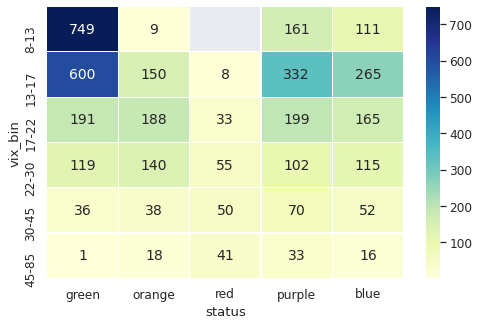

In [ ]:
df = vxx.copy(deep=True)
pivot_sum = df.pivot_table(index = 'vix_bin', columns= 'status', values='fwd_40', aggfunc=np.count_nonzero)
pivot_sum = pivot_sum [['green', 'orange', 'red', 'purple', 'blue']]
fig, ax = plt.subplots(figsize=(8,5))
sns.set(font_scale=1.1)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, fmt='g', linewidths = 0.2, annot_kws={"fontsize":14}, ax = ax);

- pct: in each status lower contango push the pct toward positive values (long vix works), but for purple and blue (vix falling) it takes more backwardation than green and orange to have median daily loss on vxx. 
- when orange or red, it is a clear stay away from short vol at backwardation of than -10% and more.
- Higher vix and status green or blue/purple reurns better on short vol. 
- I could not find trend in effect of contango on return in each status.

### HV-IV

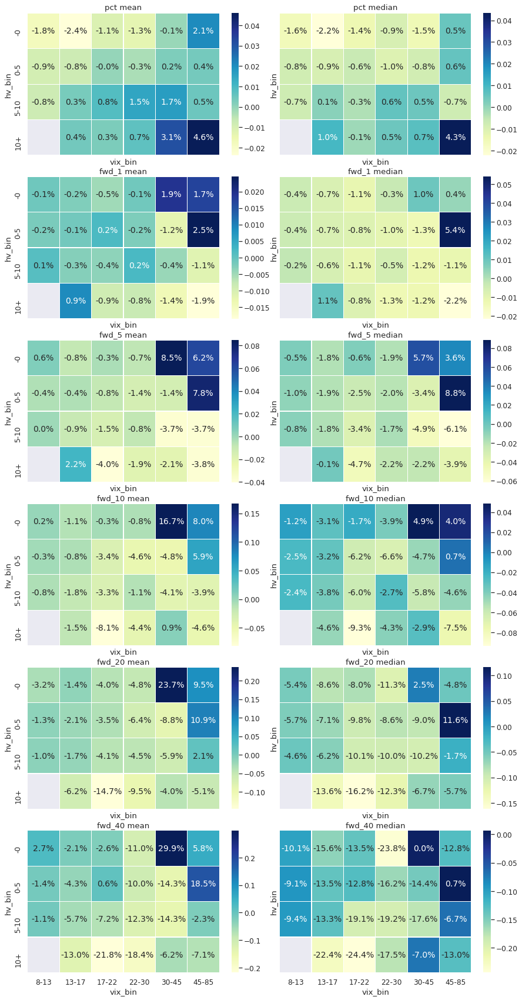

In [ ]:
df = vxx.copy(deep=True)
fig, ax = plt.subplots(6, 2, sharex=True, sharey=True, figsize=(15,30))
fig.subplots_adjust(hspace= 0.151, wspace=0.0510)
plt.rcParams.update({'font.size': 16})
sns.set(font_scale=1.1)

pivot_sum = df.pivot_table(index = 'hv_bin', columns= 'vix_bin', values='pct', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[0,0])
ax[0,0].set_title('pct mean')
pivot_sum = df.pivot_table(index = 'hv_bin', columns= 'vix_bin', values='pct', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[0,1])
ax[0,1].set_title('pct median')

pivot_sum = df.pivot_table(index = 'hv_bin', columns= 'vix_bin', values='fwd_1', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[1,0])
ax[1,0].set_title('fwd_1 mean')
pivot_sum = df.pivot_table(index = 'hv_bin', columns= 'vix_bin', values='fwd_1', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[1,1])
ax[1,1].set_title('fwd_1 median')

pivot_sum = df.pivot_table(index = 'hv_bin', columns= 'vix_bin', values='fwd_5', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[2,0])
ax[2,0].set_title('fwd_5 mean')
pivot_sum = df.pivot_table(index = 'hv_bin', columns= 'vix_bin', values='fwd_5', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[2,1])
ax[2,1].set_title('fwd_5 median')

pivot_sum = df.pivot_table(index = 'hv_bin', columns= 'vix_bin', values='fwd_10', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[3,0])
ax[3,0].set_title('fwd_10 mean')
pivot_sum = df.pivot_table(index = 'hv_bin', columns= 'vix_bin', values='fwd_10', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[3,1])
ax[3,1].set_title('fwd_10 median')

pivot_sum = df.pivot_table(index = 'hv_bin', columns= 'vix_bin', values='fwd_20', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[4,0])
ax[4,0].set_title('fwd_20 mean')
pivot_sum = df.pivot_table(index = 'hv_bin', columns= 'vix_bin', values='fwd_20', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[4,1])
ax[4,1].set_title('fwd_20 median')

pivot_sum = df.pivot_table(index = 'hv_bin', columns= 'vix_bin', values='fwd_40', aggfunc=np.mean)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[5,0])
ax[5,0].set_title('fwd_40 mean')
pivot_sum = df.pivot_table(index = 'hv_bin', columns= 'vix_bin', values='fwd_40', aggfunc=np.median)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='.1%', annot_kws={"fontsize":14}, ax = ax[5,1])
ax[5,1].set_title('fwd_40 median');

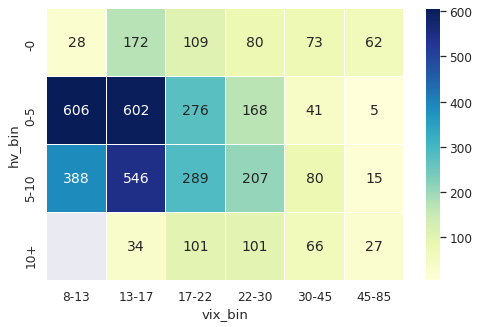

In [ ]:
pivot_sum = df.pivot_table(index = 'hv_bin', columns= 'vix_bin', values='pct', aggfunc=np.count_nonzero)
fig, ax = plt.subplots(figsize=(8,5))
sns.set(font_scale=1.1)
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, fmt='g', annot_kws={"fontsize":14}, ax = ax);

### Summary
- Role of vix range in return of vxx shows that not all the same contangos are created eqaul; depending on the vix range for the same contango, the return could be significantly different. For example high contango with high vix range is much more favorable over high contango and low vix range.
- vix futures mean predicting the change in market perception of 30 days moves in market reflected in option prices (vix value). For a fixed vix, direction of vix move is correlated with what futures market predicted, but in high vix era futures market get it wrong. 
- Elasiticy: shows some trend. You do not short vix futures when VIX-Futures is streched toward plus direction, it shows jumps in vxx with statistical significance. 
- HV-IV turned out useless.

## Statistical Significance

In [ ]:
def plot_hist(vxx,cont_bin, vix1, vix2, vix3, target, density):
  plt.figure(figsize=(15,5))
  cont_h_vix_l = vxx[(vxx['cont_bin']== cont_bin) & (vxx['vix_bin']==vix1)][target]
  cont_h_vix_m = vxx[(vxx['cont_bin']== cont_bin) & (vxx['vix_bin']==vix2)][target]
  cont_h_vix_h = vxx[(vxx['cont_bin']== cont_bin) & (vxx['vix_bin']==vix3)][target]
  F, p = f_oneway(cont_h_vix_l, cont_h_vix_m, cont_h_vix_h)
  print('p value is : ', p)
  plt.hist(cont_h_vix_l, 30,density = density, edgecolor='black', linewidth=1.2, color= 'green', alpha = 0.5)
  plt.axvline(cont_h_vix_l.median(), color='green', linestyle='dashed', linewidth=2)
  plt.hist(cont_h_vix_m, 30,density = density,edgecolor='black', linewidth=1.2, color= 'orange', alpha = 0.5)
  plt.axvline(cont_h_vix_m.median(), color='orange', linestyle='dashed', linewidth=2)
  plt.hist(cont_h_vix_h, 30,density = density,edgecolor='black', linewidth=1.2, color= 'red', alpha = 0.5)
  plt.axvline(cont_h_vix_h.median(), color='red', linestyle='dashed', linewidth=2)
  plt.legend([vix1, vix2, vix3]);

In [ ]:
def plot_hist_vix(vxx,vix, cont1, cont2, cont3, target, density):
  plt.figure(figsize=(15,5))
  cont_h_vix_l = vxx[(vxx['cont_bin']== cont1) & (vxx['vix_bin']==vix)][target]
  cont_h_vix_m = vxx[(vxx['cont_bin']== cont2) & (vxx['vix_bin']==vix)][target]
  cont_h_vix_h = vxx[(vxx['cont_bin']== cont3) & (vxx['vix_bin']==vix)][target]
  F, p = f_oneway(cont_h_vix_l, cont_h_vix_m, cont_h_vix_h)
  print('p value is : ', p)
  plt.hist(cont_h_vix_l, 30,density = density, edgecolor='black', linewidth=1.2, color= 'green', alpha = 0.5)
  plt.axvline(cont_h_vix_l.median(), color='green', linestyle='dashed', linewidth=2)
  plt.hist(cont_h_vix_m, 30,density = density,edgecolor='black', linewidth=1.2, color= 'orange', alpha = 0.5)
  plt.axvline(cont_h_vix_m.median(), color='orange', linestyle='dashed', linewidth=2)
  plt.hist(cont_h_vix_h, 30,density = density,edgecolor='black', linewidth=1.2, color= 'red', alpha = 0.5)
  plt.axvline(cont_h_vix_h.median(), color='red', linestyle='dashed', linewidth=2)

  plt.legend([cont1, cont2, cont3]);

p value is :  0.0006433838747157384


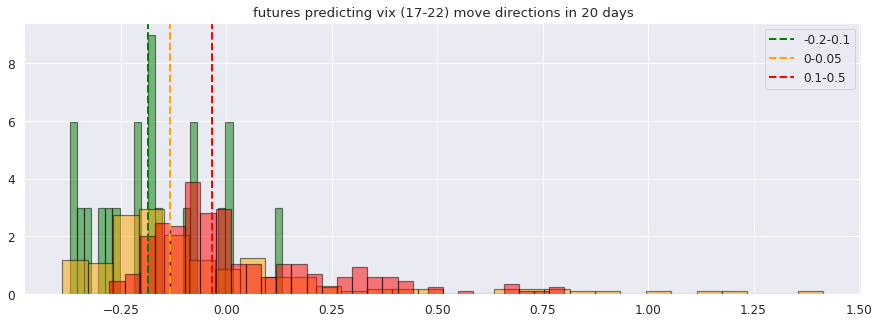

In [ ]:
plot_hist_vix(vxx, '17-22', '-0.2-0.1', '0-0.05',  '0.1-0.5', 'fwd_20_vix', True)
plt.title('futures predicting vix (17-22) move directions in 20 days');

p value is :  4.936613509402414e-07


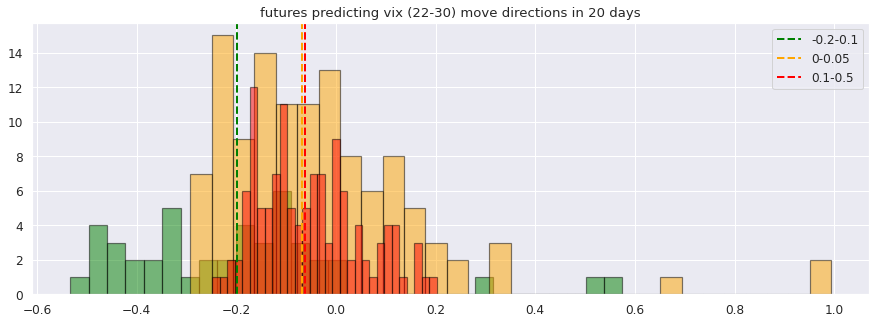

In [ ]:
plot_hist_vix(vxx, '22-30', '-0.2-0.1', '0-0.05',  '0.1-0.5', 'fwd_20_vix', False)
plt.title('futures predicting vix (22-30) move directions in 20 days');

p value is :  5.131514114233753e-05


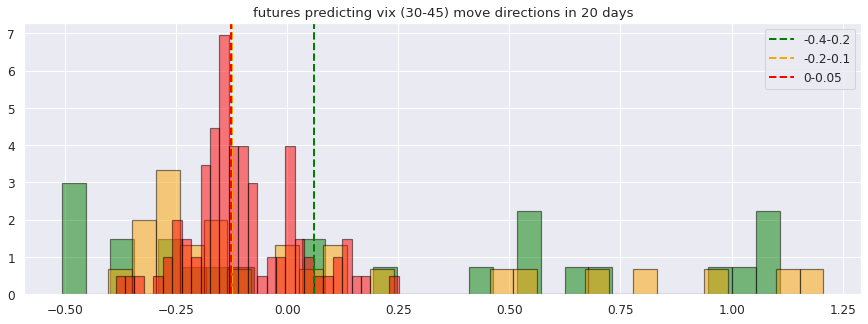

In [ ]:
plot_hist_vix(vxx, '30-45', '-0.4-0.2', '-0.2-0.1', '0-0.05', 'fwd_20_vix', True)
plt.title('futures predicting vix (30-45) move directions in 20 days');

future market can predict vix direction with good approximation but up to a threshold in vix. At low vix, when it predicts vix going down most of the time it is right. At high vix it is a fliping a coin, thus a great deal for people shorting vol through futures.

p value is :  8.387733935675075e-15


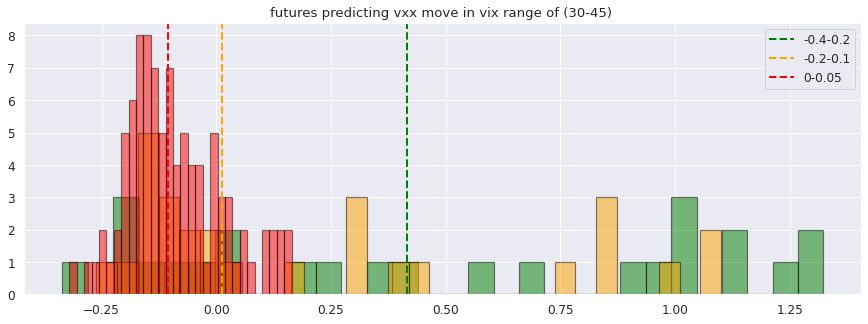

In [ ]:
plot_hist_vix(vxx, '30-45', '-0.4-0.2', '-0.2-0.1', '0-0.05', 'fwd_20', False)
plt.title('futures predicting vxx move in vix range of (30-45) ');

p value is :  1.613414128122552e-07


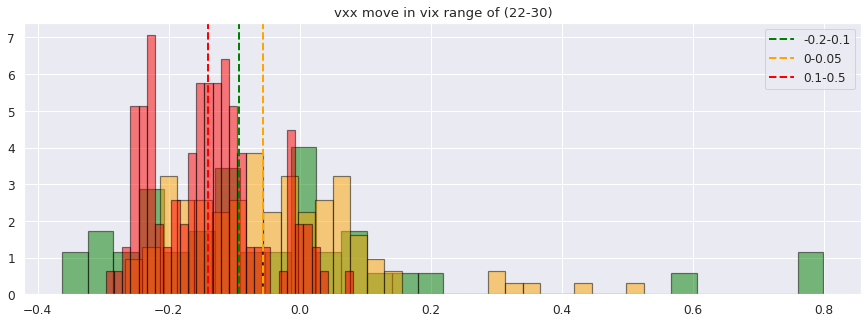

In [ ]:
plot_hist_vix(vxx, '22-30', '-0.2-0.1', '0-0.05',  '0.1-0.5', 'fwd_20', True)
plt.title('vxx move in vix range of (22-30)');

p value is :  0.017156305473836966


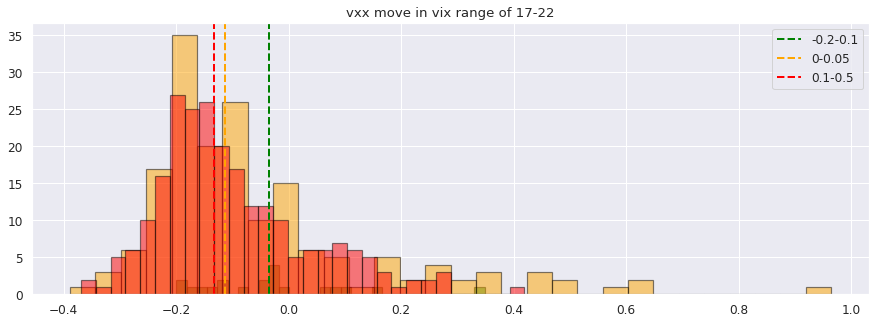

In [ ]:
plot_hist_vix(vxx, '17-22', '-0.2-0.1', '0-0.05',  '0.1-0.5', 'fwd_20', False)
plt.title('vxx move in vix range of 17-22');

p value is :  0.032897775868639526


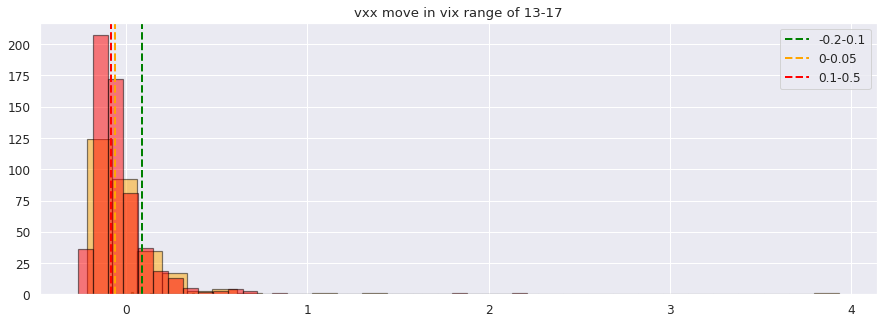

In [ ]:
plot_hist_vix(vxx, '13-17', '-0.2-0.1', '0-0.05', '0.1-0.5', 'fwd_20', False)
plt.title('vxx move in vix range of 13-17');

### Same contango, different vix

p value is :  0.37879799981849716


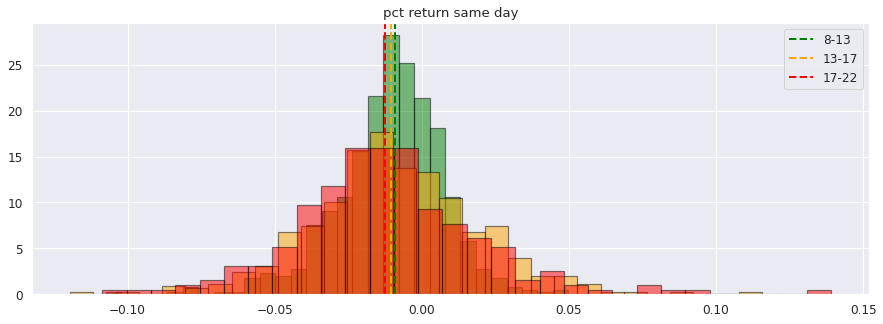

In [ ]:
plot_hist(vxx, '0.1-0.5', '8-13','13-17','17-22', 'pct', True)
plt.title('pct return same day');

p value is :  5.864064605712626e-11


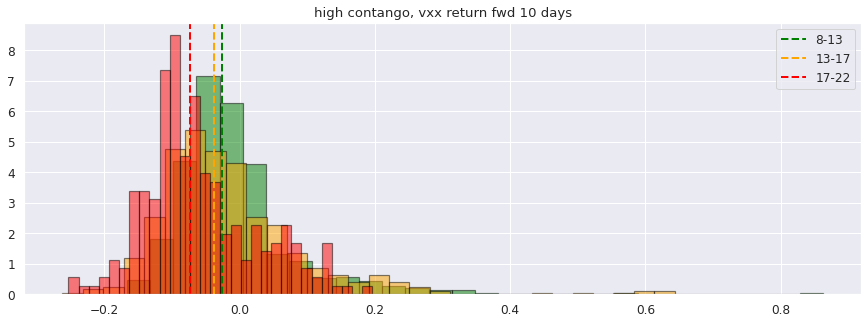

In [ ]:
plot_hist(vxx, '0.1-0.5', '8-13','13-17','17-22', 'fwd_10', True)
plt.title('high contango, vxx return fwd 10 days');

p value is :  6.297997244944714e-09


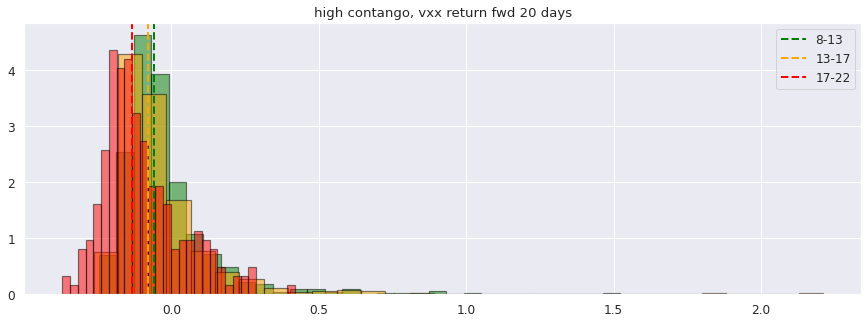

In [ ]:
plot_hist(vxx, '0.1-0.5', '8-13','13-17','17-22', 'fwd_20', True)
plt.title('high contango, vxx return fwd 20 days');

p value is :  8.886258389621419e-06


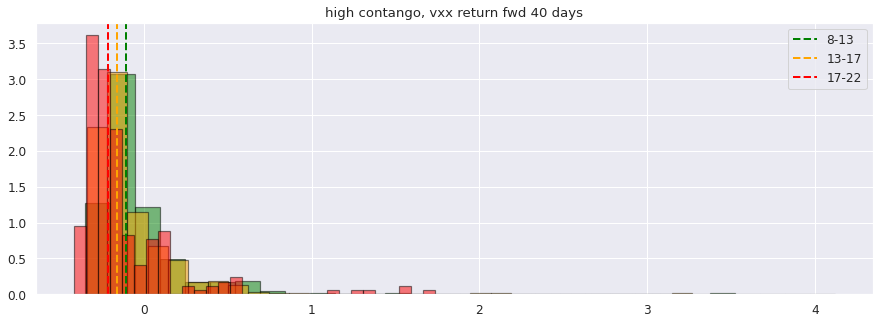

In [ ]:
plot_hist(vxx, '0.1-0.5', '8-13','13-17','17-22', 'fwd_40', True)
plt.title('high contango, vxx return fwd 40 days');

p value is :  0.10356668022220364


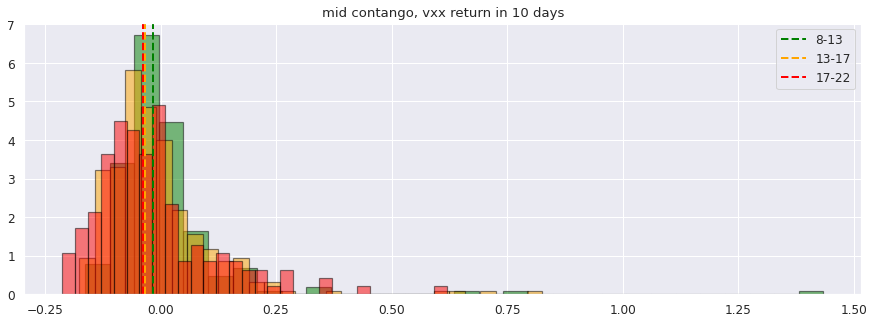

In [ ]:
plot_hist(vxx, '0.05-0.1', '8-13','13-17','17-22', 'fwd_10', True)
plt.title('mid contango, vxx return in 10 days');

p value is :  0.37532643465529103


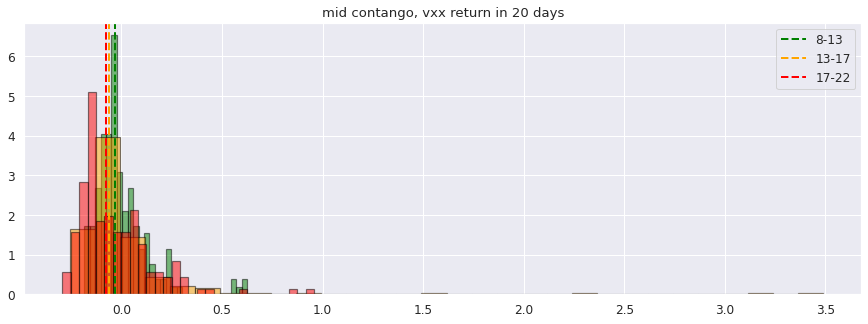

In [ ]:
plot_hist(vxx, '0.05-0.1', '8-13','13-17','17-22', 'fwd_20', True)
plt.title('mid contango, vxx return in 20 days');

p value is :  0.14615421934134035


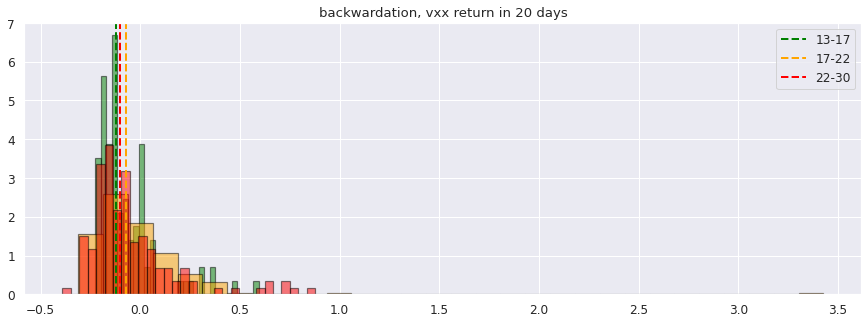

In [ ]:
plot_hist(vxx, '-0.1-0','13-17','17-22','22-30', 'fwd_20', True)
plt.title('low backwardation, vxx return in 20 days');

p value is :  0.00042552608319416566


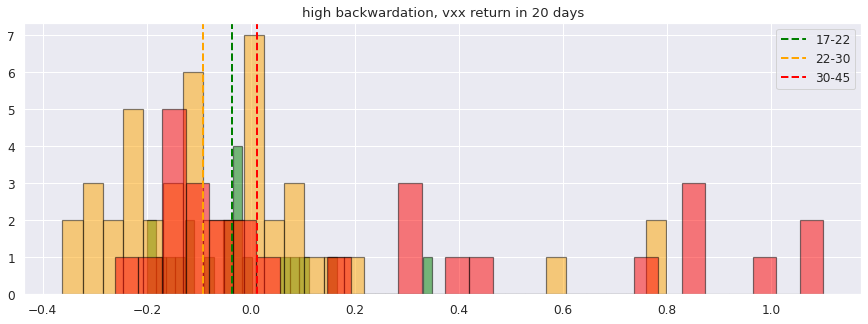

In [ ]:
plot_hist(vxx, '-0.2-0.1','17-22','22-30', '30-45', 'fwd_20', False)
plt.title('high backwardation, vxx return in 20 days');

### Vix status, Slope

In [ ]:
color = sloper(vxx, 8, 3, 0.25, 0.75, 0.2, 100)
vxx['status'] = color
np.unique(color, return_counts=True)

(array(['blue', 'green', 'orange', 'purple', 'red'], dtype='<U6'),
 array([ 742, 1705,  547,  903,  190]))

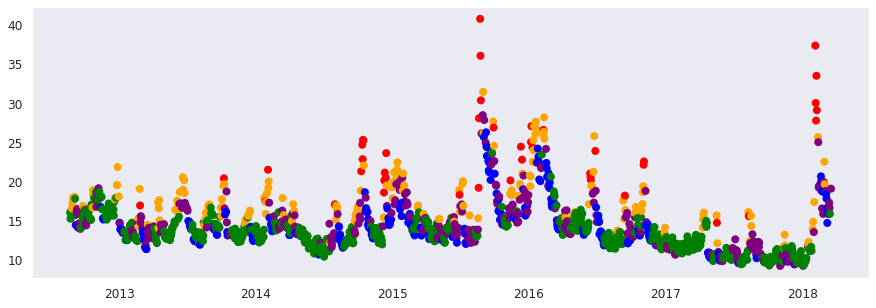

In [ ]:
plt.figure(figsize=(15,5))
start, end = 2100,3500
plt.scatter(vxx.date[start:end], vxx.vix[start:end], marker='o' , linewidth=1.99, c = color[start:end])
plt.grid();

p value is :  8.327875784699742e-12


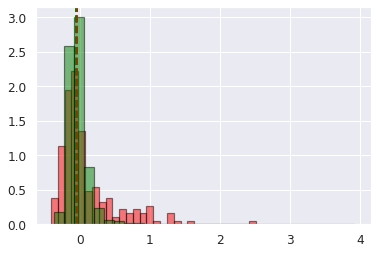

In [ ]:
vxx['status'] = color
a = vxx[(vxx['status']=='red')&(vxx['vix']>8)&(vxx['vix']<135)]['fwd_20']
b = vxx[(vxx['status']== 'green')&(vxx['vix']>8)&(vxx['vix']<135)]['fwd_20']
plt.hist(a,30, density = True, edgecolor='black', linewidth=1.2, color= 'red', alpha = 0.5)
plt.axvline(a.median(), color='red', linestyle='dashed', linewidth=2)
plt.hist(b,30, density = True, edgecolor='black', linewidth=1.2, color= 'green', alpha = 0.5)
plt.axvline(b.median(), color='green', linestyle='dashed', linewidth=2);
F, p = f_oneway(a,b)
print('p value is : ', p)

In [ ]:
def plot_hist_status(vxx,cont, stat1, stat2,stat3, target, density):
  plt.figure(figsize=(15,5))
  cont_h_vix_l = vxx[(vxx['cont_bin']== cont) & (vxx['status']==stat1)][target]
  cont_h_vix_m = vxx[(vxx['cont_bin']== cont) & (vxx['status']==stat2)][target]
  cont_h_vix_h = vxx[(vxx['cont_bin']== cont) & (vxx['status']==stat3)][target]
  F, p = f_oneway(cont_h_vix_l, cont_h_vix_h)
  print('p value is : ', p)
  plt.hist(cont_h_vix_l, 30,density = density, edgecolor='black', linewidth=1.2, color= 'green', alpha = 0.5)
  plt.axvline(cont_h_vix_l.median(), color='green', linestyle='dashed', linewidth=2)
  plt.hist(cont_h_vix_m, 30,density = density,edgecolor='black', linewidth=1.2, color= 'orange', alpha = 0.5)
  plt.axvline(cont_h_vix_m.median(), color='orange', linestyle='dashed', linewidth=2)
  plt.hist(cont_h_vix_h, 30,density = density,edgecolor='black', linewidth=1.2, color= 'red', alpha = 0.5)
  plt.axvline(cont_h_vix_h.median(), color='red', linestyle='dashed', linewidth=2)

  plt.legend([stat1, stat2,stat3]);

It took me too much time to write a function that returns status of vix, like rising, calm or falling, which more or less doing it job.
But this status did not show any statistical significanct on predicting if vix rising higher or vxx drops. 

I am still having hard time accepting this but it means whether it seems vix is falling or rising or calm has no predictable effect on futures of vix and vix futures. 

p value is :  0.6284534337940384


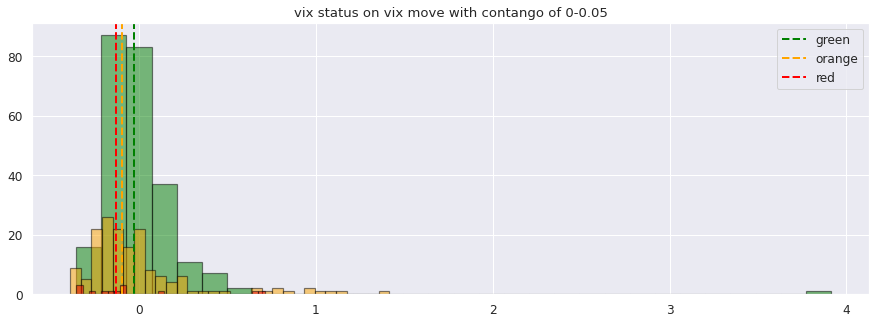

In [ ]:
plot_hist_status(vxx, '0-0.05', 'green', 'orange', 'red', 'fwd_20_vix', False)
plt.title('vix status on vix move with contango of 0-0.05');

p value is :  0.6373538537174985


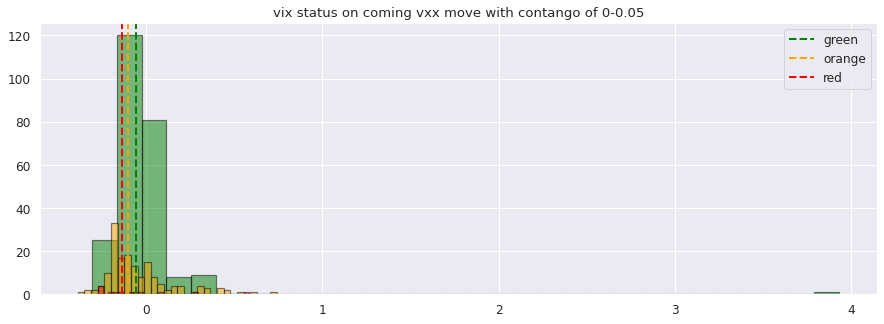

In [ ]:
plot_hist_status(vxx, '0-0.05', 'green', 'orange', 'red', 'fwd_20', False)
plt.title('vix status on coming vxx move with contango of 0-0.05');

p value is :  0.884337864066807


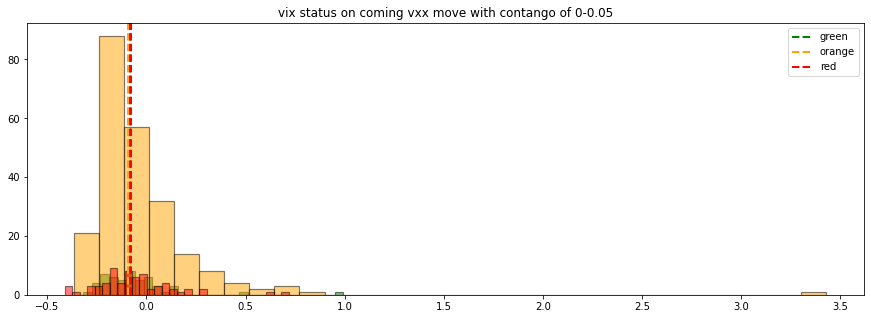

In [ ]:
plot_hist_status(vxx, '-0.1-0', 'green', 'orange', 'red', 'fwd_20', False)
plt.title('vix status on coming vxx move with contango of 0-0.05');

p value is :  0.32322780209569213


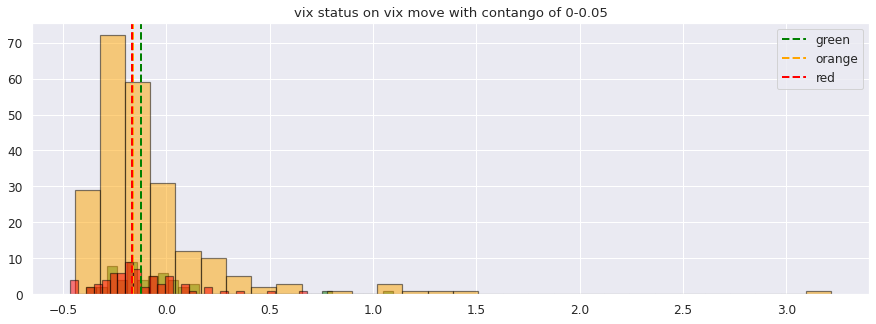

In [ ]:
plot_hist_status(vxx, '-0.1-0', 'green', 'orange', 'red', 'fwd_20_vix', False)
plt.title('vix status on vix move with contango of 0-0.05');

p value is :  0.7250958492667414


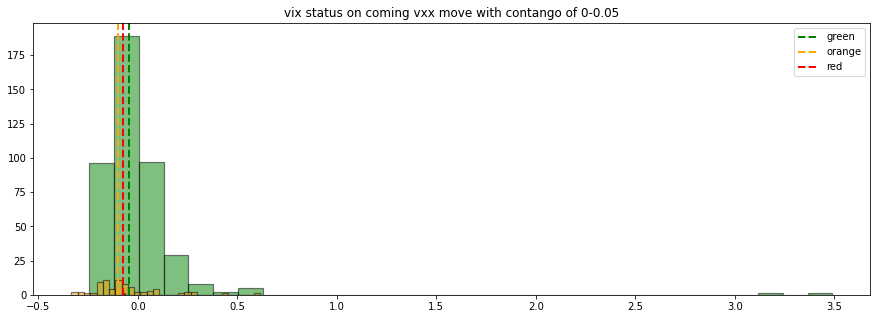

In [ ]:
plot_hist_status(vxx, '0.05-0.1', 'green', 'orange', 'red', 'fwd_20', False)
plt.title('vix status on coming vxx move with contango of 0-0.05');

In [ ]:
def plot_hist_slope(vxx,cont, slope1, slope3, target, density):
  plt.figure(figsize=(15,5))
  cont_h_vix_l = vxx[(vxx['cont_bin']== cont) & (vxx['slope_bin']==slope1)][target]
  # cont_h_vix_m = vxx[(vxx['cont_bin']== cont) & (vxx['slope_bin']==slope2)][target]
  cont_h_vix_h = vxx[(vxx['cont_bin']== cont) & (vxx['slope_bin']==slope3)][target]
  F, p = f_oneway(cont_h_vix_l, cont_h_vix_h)
  print('p value is : ', p)
  plt.hist(cont_h_vix_l, 30,density = density, edgecolor='black', linewidth=1.2, color= 'green', alpha = 0.5)
  plt.axvline(cont_h_vix_l.median(), color='green', linestyle='dashed', linewidth=2)
  # plt.hist(cont_h_vix_m, 30,density = density,edgecolor='black', linewidth=1.2, color= 'orange', alpha = 0.5)
  # plt.axvline(cont_h_vix_m.median(), color='orange', linestyle='dashed', linewidth=2)
  plt.hist(cont_h_vix_h, 30,density = density,edgecolor='black', linewidth=1.2, color= 'red', alpha = 0.5)
  plt.axvline(cont_h_vix_h.median(), color='red', linestyle='dashed', linewidth=2)

  plt.legend([slope1, slope3]);

p value is :  0.5256231497031404


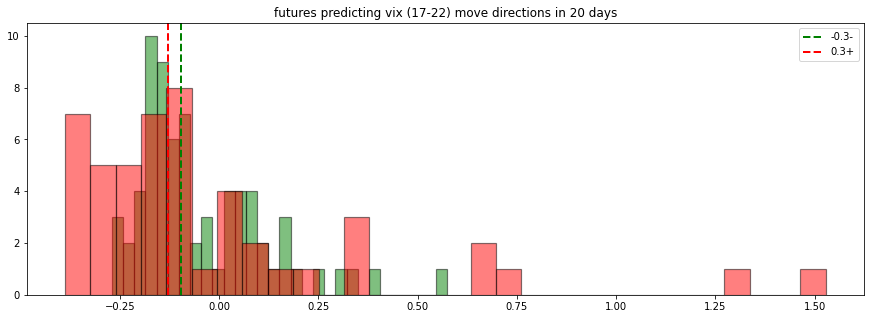

In [ ]:
plot_hist_slope(vxx, '0-0.05',   '-0.3-','0.3+', 'fwd_20_vix', False)
plt.title('futures predicting vix (17-22) move directions in 20 days');

p value is :  0.5213637212608166


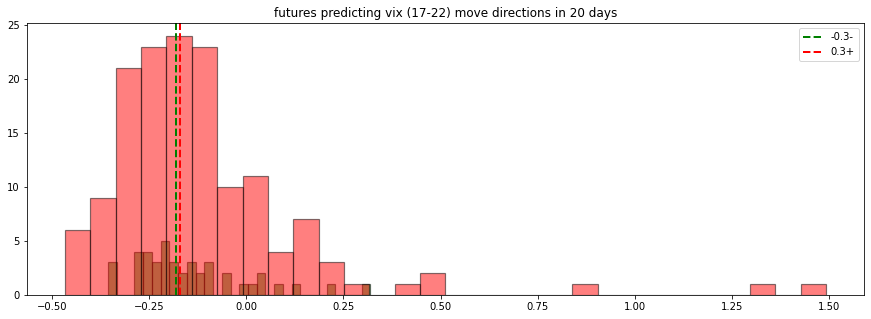

In [ ]:
plot_hist_slope(vxx, '-0.1-0',   '-0.3-','0.3+', 'fwd_20_vix', False)
plt.title('futures predicting vix (17-22) move directions in 20 days');

p value is :  0.1707920824749547


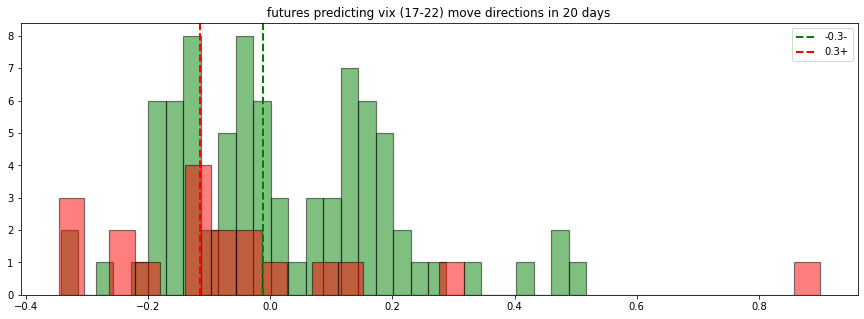

In [ ]:
plot_hist_slope(vxx, '0.05-0.1',   '-0.3-','0.3+', 'fwd_20_vix', False)
plt.title('futures predicting vix (17-22) move directions in 20 days');

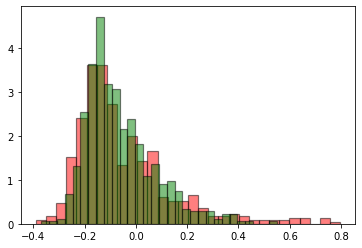

In [ ]:
plt.hist(vxx[(vxx['vix_slope']>0.1)&(vxx['vix']>15)&(vxx['vix']<25)]['fwd_20'],30, density = True, edgecolor='black', linewidth=1.2, color= 'red', alpha = 0.5)
plt.hist(vxx[(vxx['vix_slope']<-0.1)&(vxx['vix']>15)&(vxx['vix']<25)]['fwd_20'],30, density = True, edgecolor='black', linewidth=1.2, color= 'green', alpha = 0.5);

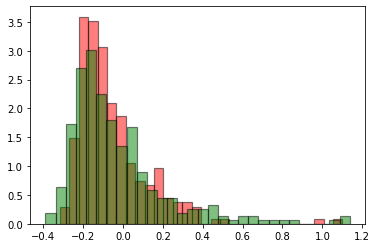

In [ ]:
vxx['status'] = color
plt.hist(vxx[(vxx['status']=='purple')&(vxx['vix']>18)&(vxx['vix']<35)]['fwd_20'],30, density = True, edgecolor='black', linewidth=1.2, color= 'red', alpha = 0.5)
plt.hist(vxx[(vxx['status']== 'orange')&(vxx['vix']>18)&(vxx['vix']<35)]['fwd_20'],30, density = True, edgecolor='black', linewidth=1.2, color= 'green', alpha = 0.5);

### Elasticity

In [67]:
def plot_hist_elast(vxx,vix, elast_1, elast_2, elast_3, target, density):
  plt.figure(figsize=(15,5))
  cont_h_vix_l = vxx[(vxx['elasctic_bins']== elast_1) & (vxx['vix_bin']==vix)][target]
  cont_h_vix_m = vxx[(vxx['elasctic_bins']== elast_2) & (vxx['vix_bin']==vix)][target]
  cont_h_vix_h = vxx[(vxx['elasctic_bins']== elast_3) & (vxx['vix_bin']==vix)][target]
  F, p = f_oneway(cont_h_vix_l, cont_h_vix_m, cont_h_vix_h)
  print('p value is : ', p)
  plt.hist(cont_h_vix_l, 30,density = density, edgecolor='black', linewidth=1.2, color= 'green', alpha = 0.5)
  plt.axvline(cont_h_vix_l.median(), color='green', linestyle='dashed', linewidth=2)
  plt.hist(cont_h_vix_m, 30,density = density,edgecolor='black', linewidth=1.2, color= 'orange', alpha = 0.5)
  plt.axvline(cont_h_vix_m.median(), color='orange', linestyle='dashed', linewidth=2)
  plt.hist(cont_h_vix_h, 30,density = density,edgecolor='black', linewidth=1.2, color= 'red', alpha = 0.5)
  plt.axvline(cont_h_vix_h.median(), color='red', linestyle='dashed', linewidth=2)

  plt.legend([elast_1, elast_2, elast_3]);

p value is :  0.0022473391316064338


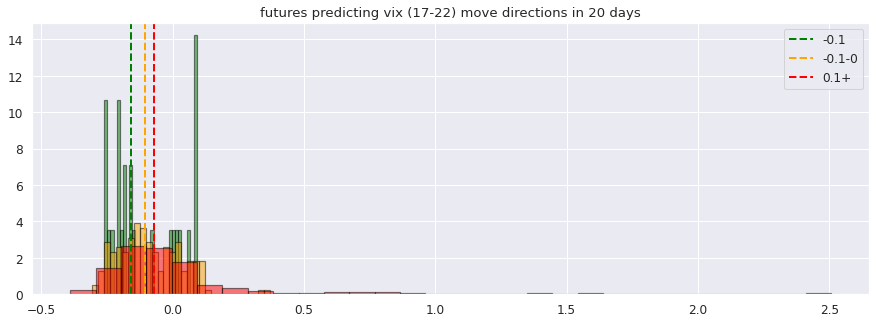

In [82]:
plot_hist_elast(vxx, '22-30', '-0.1', '-0.1-0', '0.1+', 'fwd_20', True)
plt.title('futures predicting vix (17-22) move directions in 20 days');

p value is :  0.059325427232425065


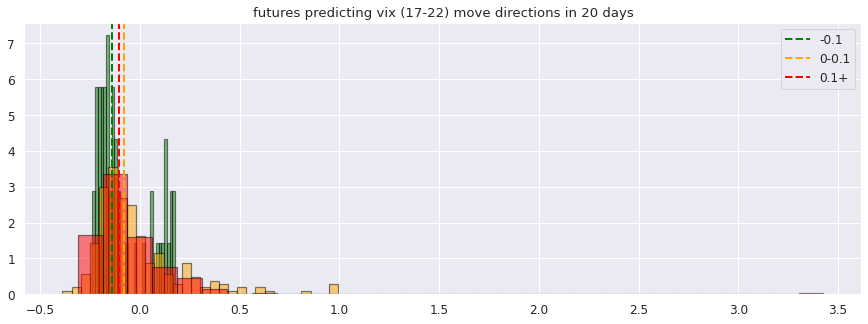

In [81]:
plot_hist_elast(vxx, '17-22', '-0.1', '0-0.1', '0.1+', 'fwd_20', True)
plt.title('futures predicting vix (17-22) move directions in 20 days');

p value is :  0.04924935400098811


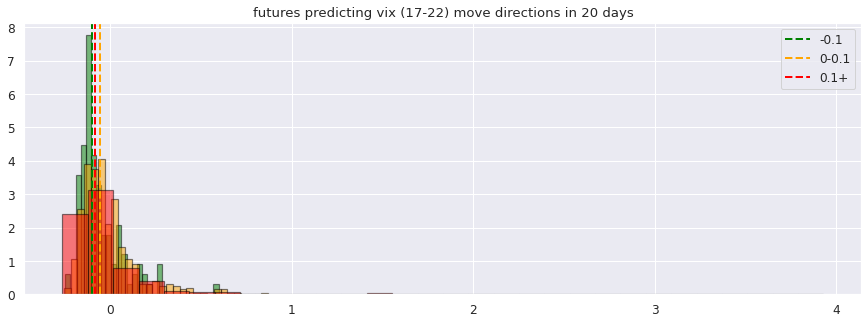

In [80]:
plot_hist_elast(vxx, '13-17', '-0.1', '0-0.1', '0.1+', 'fwd_20', True)
plt.title('futures predicting vix (17-22) move directions in 20 days');

p value is :  0.22917692022818478


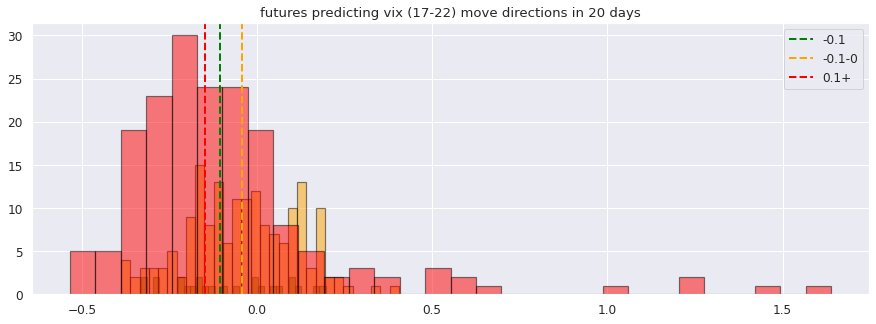

In [76]:
plot_hist_elast(vxx, '22-30', '-0.1', '-0.1-0', '0.1+', 'fwd_20_vix', False)
plt.title('futures predicting vix (17-22) move directions in 20 days');

## Fine Grid

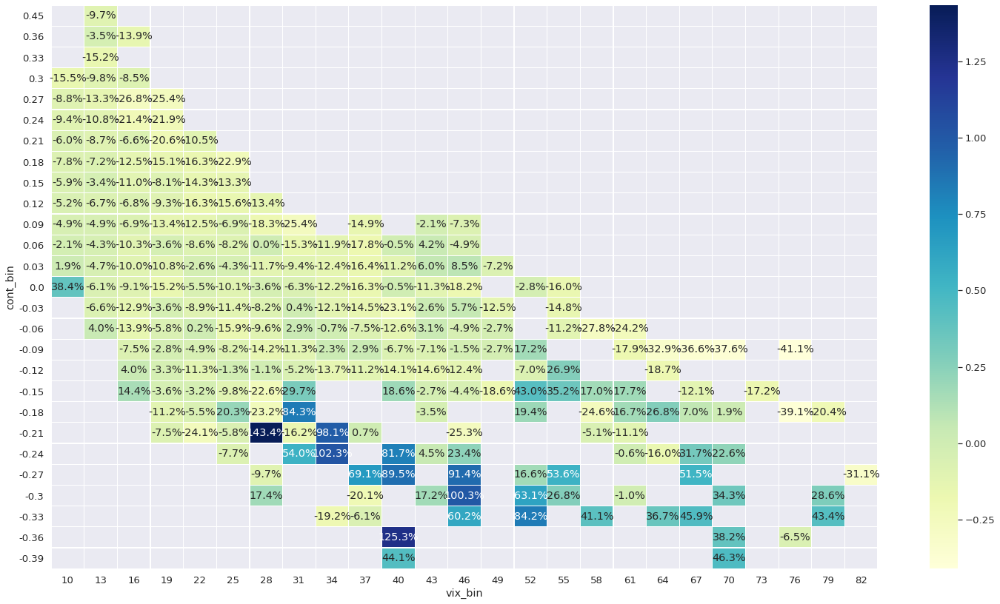

In [ ]:
df = vxx.copy(deep=True)
df['cont_bin'] = [str(round(x, 2)) for x in df['cont_bin']]
df['vix_bin'] = [str(x) for x in df['vix_bin']]
pivot = pd.DataFrame(df.groupby('cont_bin').pct.sum().reset_index())
pivot_vix = pd.DataFrame(df.groupby('vix_bin').pct.sum().reset_index())
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_20', aggfunc=np.median).reset_index()
pivot_sum['cont_bin'] = [float(x) for x in pivot_sum['cont_bin']]
pivot_sum = pivot_sum.sort_values('cont_bin', ascending=False).reset_index(drop=True)
pivot_sum.index = pivot_sum['cont_bin']
pivot_sum = pivot_sum.drop('cont_bin', axis = 1)
pivot_sum = round(pivot_sum,3)
sns.set(font_scale=1.2)
fig, ax = plt.subplots(figsize=(25,14))
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True,fmt='.1%', linewidths = 0.2, ax = ax);

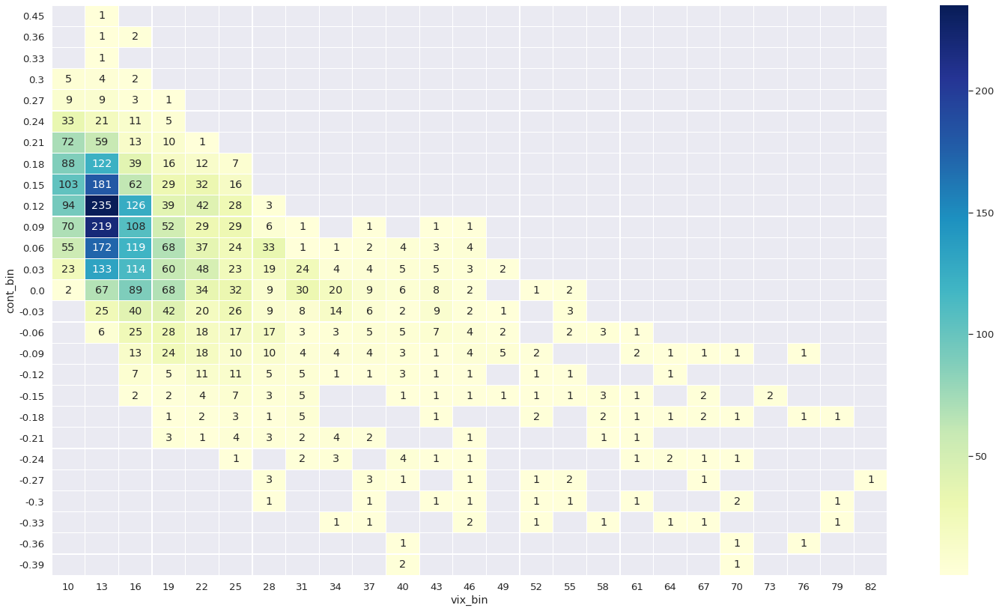

In [ ]:
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='pct', aggfunc=np.count_nonzero).reset_index()
pivot_sum['cont_bin'] = [float(x) for x in pivot_sum['cont_bin']]
pivot_sum = pivot_sum.sort_values('cont_bin', ascending=False).reset_index(drop=True)
pivot_sum.index = pivot_sum['cont_bin']
pivot_sum = pivot_sum.drop('cont_bin', axis = 1)
fig, ax = plt.subplots(figsize=(25,14))
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True,fmt='g', linewidths = 0.2, ax = ax);

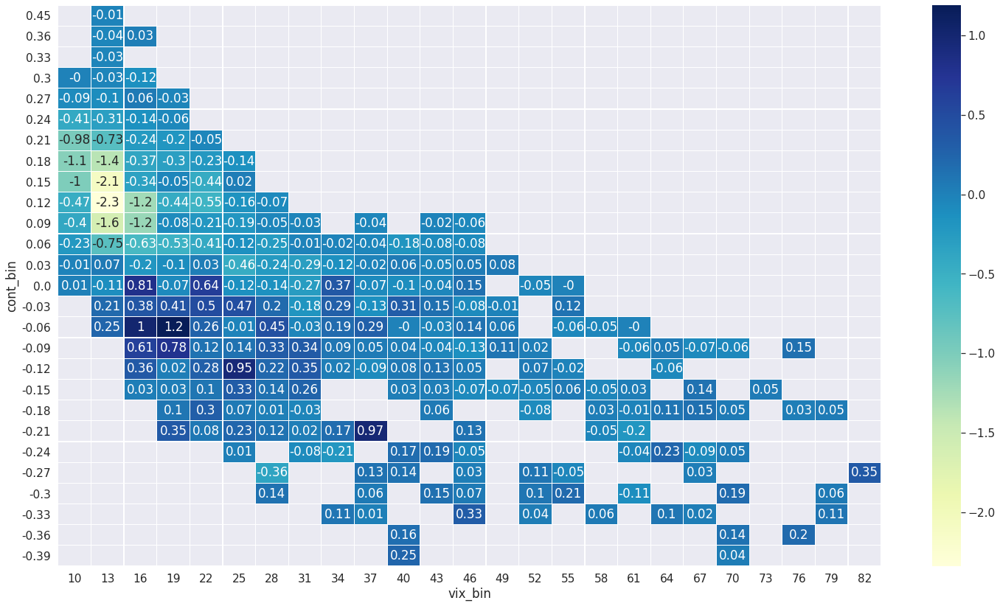

In [ ]:
df = vxx.copy(deep=True)
df['cont_bin'] = [str(round(x, 2)) for x in df['cont_bin']]
df['vix_bin'] = [str(x) for x in df['vix_bin']]
pivot = pd.DataFrame(df.groupby('cont_bin').pct.sum().reset_index())
pivot_vix = pd.DataFrame(df.groupby('vix_bin').pct.sum().reset_index())
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='pct', aggfunc=np.sum).reset_index()
pivot_sum['cont_bin'] = [float(x) for x in pivot_sum['cont_bin']]
pivot_sum = pivot_sum.sort_values('cont_bin', ascending=False).reset_index(drop=True)
pivot_sum.index = pivot_sum['cont_bin']
pivot_sum = pivot_sum.drop('cont_bin', axis = 1)
pivot_sum = round(pivot_sum,2)
sns.set(font_scale=1.4)
fig, ax = plt.subplots(figsize=(25,14))
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, ax = ax);

comparing sums could be misleading as the number of days that are in each bin plays a role. A trade with 0.2% mean and 100 occurance performs worse than a trade with 0.1% with 1000 occurance, with the same standard deviation.

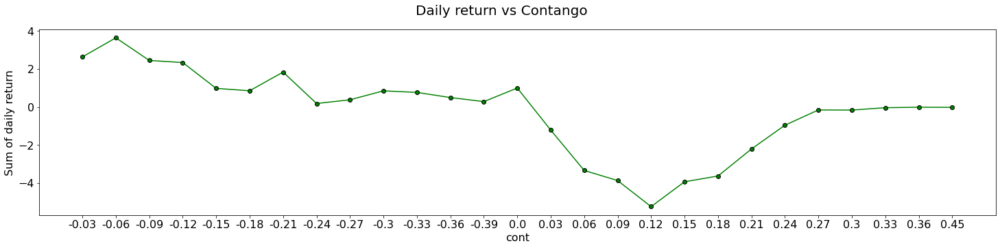

In [ ]:
plt.figure(figsize=(25,5))
plt.xlabel('cont')
plt.ylabel('Sum of daily return')
plt.suptitle('Daily return vs Contango', fontsize=20)
plt.plot(pivot.cont_bin, pivot.pct, marker  = 'o', color = 'green', mec='black');

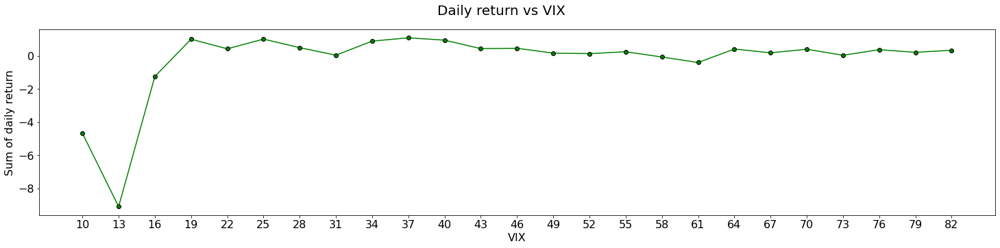

In [ ]:
plt.figure(figsize=(25,5))
plt.xlabel('VIX')
plt.ylabel('Sum of daily return')
plt.suptitle('Daily return vs VIX', fontsize=20)
plt.plot(pivot_vix.vix_bin, pivot_vix.pct, marker  = 'o', color = 'green', mec='black');

#### Mean daily return vs vix/*cont*

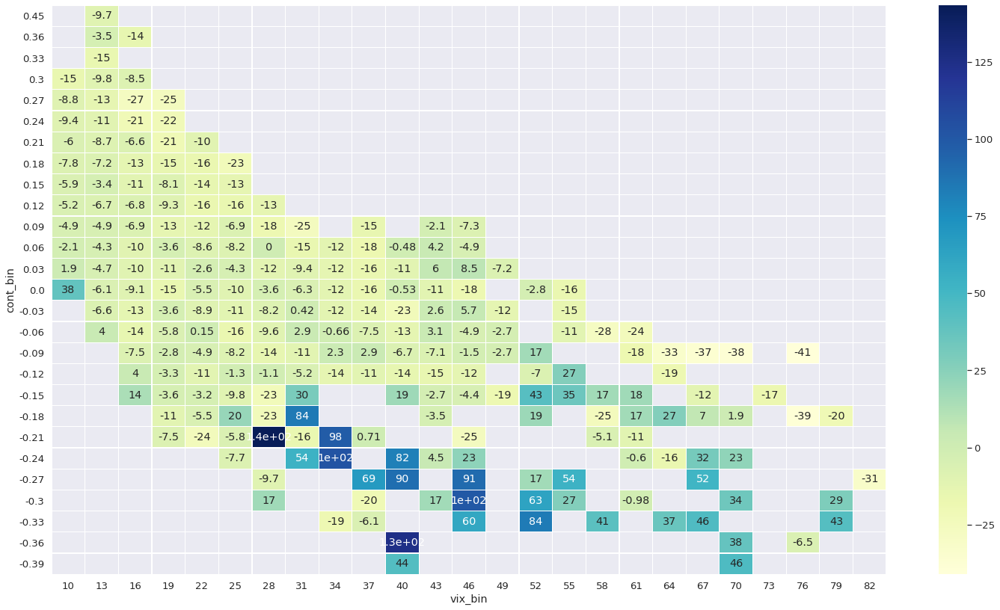

In [ ]:
pivot_sum = df.pivot_table(index = 'cont_bin', columns= 'vix_bin', values='fwd_20', aggfunc=np.median).reset_index()
pivot_sum['cont_bin'] = [float(x) for x in pivot_sum['cont_bin']]
pivot_sum = pivot_sum.sort_values('cont_bin', ascending=False).reset_index(drop=True)
pivot_sum.index = pivot_sum['cont_bin']
pivot_sum = pivot_sum.drop('cont_bin', axis = 1)
pivot_sum = pivot_sum*100
pivot_sum = round(pivot_sum,2)
fig, ax = plt.subplots(figsize=(25,14))
sns.heatmap(pivot_sum, cmap='YlGnBu', annot=True, linewidths = 0.2, ax = ax);

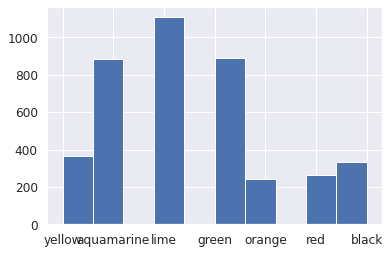

In [ ]:
target = vxx['fwd_20']
labels = []
label = []
thresh = 0.05
for i in range(len(target)):
  if target[i] > 4*thresh:
    labels.append('black')
    label.append(0)
  elif target[i] > 2*thresh and target[i]< 4*thresh:
    labels.append('red')
    label.append(1)
  elif target[i] > thresh and target[i]< 2*thresh:
    labels.append('orange')
    label.append(1)
  elif target[i] > 0 and target[i]< thresh:
    labels.append('yellow')
    label.append(1)
  elif target[i] > -1.5*thresh and target[i]< 0:
    labels.append('aquamarine')
    label.append(1)
  elif target[i] > -3*thresh and target[i]< -1.5*thresh:
    labels.append('lime')
    label.append(1)
  else:
    labels.append('green')
    label.append(2)
plt.hist(labels);

### VXX change in 20 days vs vix/*cont* today

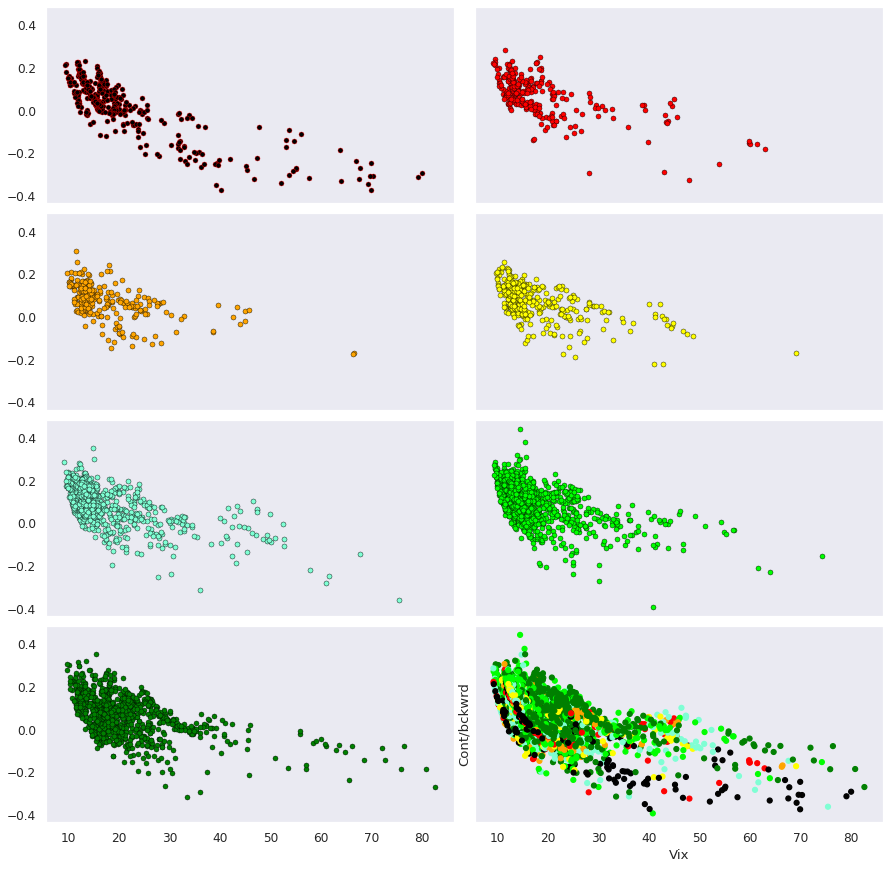

In [ ]:
vxx['target'] = labels
fig, ax = plt.subplots(4, 2, sharex=True, sharey=True, figsize=(15,15))# returns a tuple, the 1st is figure object
fig.subplots_adjust(hspace= 0.051, wspace=0.0510)
plt.rcParams.update({'font.size': 16})
df = vxx[vxx['target'] == 'black']
ax[0,0].scatter(df.vix, df.cont, marker = 'o', linewidth=0.4,edgecolor='red', color = 'black', s = 25)
ax[0,0].grid()
df = vxx[vxx['target'] == 'red']
ax[0,1].scatter(df.vix, df.cont, marker = 'o', linewidth=0.4,edgecolor='black', color = 'red', s = 25)
ax[0,1].grid()
df = vxx[vxx['target'] == 'orange']
ax[1,0].scatter(df.vix, df.cont, marker = 'o', linewidth=0.4,edgecolor='black', color = 'orange', s = 25)
ax[1,0].grid()
df = vxx[vxx['target'] == 'yellow']
ax[1,1].scatter(df.vix, df.cont, marker = 'o', linewidth=0.4,edgecolor='black', color = 'yellow', s = 25)
ax[1,1].grid()
df = vxx[vxx['target'] == 'aquamarine']
ax[2,0].scatter(df.vix, df.cont, marker = 'o', linewidth=0.4,edgecolor='black', color = 'aquamarine', s = 25)
ax[2,0].grid()
df = vxx[vxx['target'] == 'lime']
ax[2,1].scatter(df.vix, df.cont, marker = 'o', linewidth=0.4,edgecolor='black', color = 'lime', s = 25)
ax[2,1].grid()
df = vxx[vxx['target'] == 'green']
ax[3,0].scatter(df.vix, df.cont, marker = 'o', linewidth=0.4,edgecolor='black', color = 'green', s = 25)
ax[3,0].grid()
plt.ylabel('Cont/bckwrd')
ax[3,1].scatter(vxx.vix, vxx.cont, marker = 'o',edgecolor=labels, linewidth=1.2, color = labels, s = 25, alpha=0.99)
ax[3,1].grid()
plt.xlabel('Vix');

This shows the necessaty risk managment of shorting vol when market is calm: although most of return on short vol comes form vix of 10-15 and contango of 0-0.2, most of spikes also occured in the same regym. 

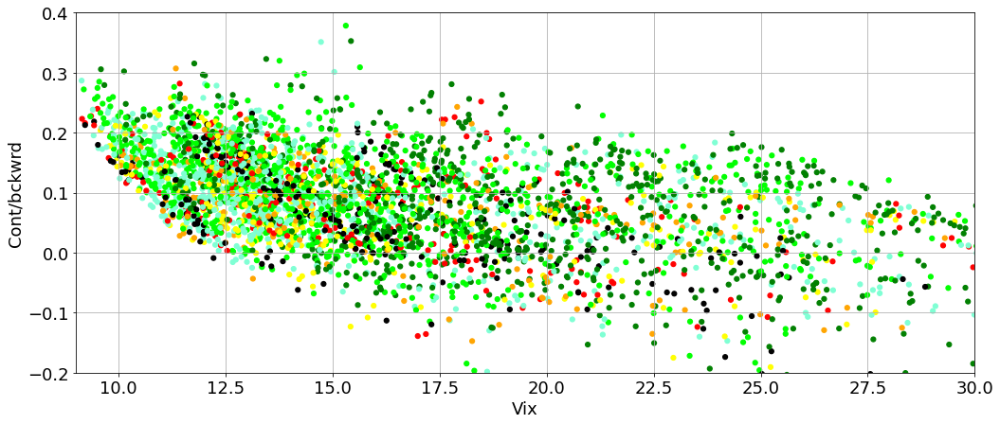

In [ ]:
plt.figure(figsize=(17,7))
plt.axis([9, 30, -0.2, 0.4])
#pyplot.xscale('log')
plt.xlabel('Vix')
plt.ylabel('Cont/bckwrd')
plt.rcParams.update({'font.size': 18})
plt.scatter(vxx.vix, vxx.cont, marker = 'o',edgecolor=labels, linewidth=1.2, color = labels, s = 25, alpha=0.99)
plt.grid();

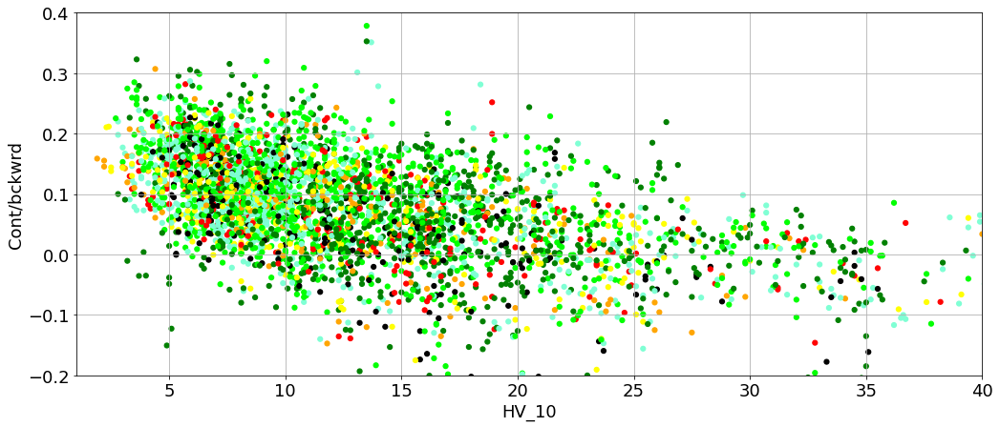

In [ ]:
plt.figure(figsize=(17,7))
plt.axis([1, 40, -0.2, 0.4])
#pyplot.xscale('log')
plt.xlabel('HV_10')
plt.ylabel('Cont/bckwrd')
plt.rcParams.update({'font.size': 18})
plt.scatter(vxx.hv_10, vxx.cont, marker = 'o',edgecolor=labels, linewidth=1.2, color = labels, s = 25, alpha=0.99)
plt.grid();

Although it shows a negative correlation between contango and vix, it shows that for a fixed vix (let say 15) contango could range from -10% to +30%. vix is 30 days options priced now, which reflects the expectations from distribution of return of market in next 30 days. Different futures for a fixed vix means although we agree on boundaries of where market lands in next 30 days, we diverge in how volatile will be market in 30 days. 


Aug 24th 2020:I cannot buy it, and I think this is a divergance between vix futures market and spx option market. If it is not a divergance, then VIX60 should be aligned with contango as it points to the same time as vix futures (option price of next 30 day in 30 days from now).

Aug 25th 2020: I think I can buy it. There is no VIX based on 60 days to validate this, but **theoritically** it says spx options of 60 days from now could have higher or lower IV compared to 30 days options.


*Practicaly*, VIX could be 15 and you expect this to go higher or lower in a month, and that is reflected in futures market not the 30 days options.

## Volatility Risk Premium (VRP)

In [ ]:
def VRP(vxx, period, overlap): #period: the lenght of backtest, overlap: how segments cover previous one. 
  lenght = int(len(vxx)*0.8)
  df_cut = vxx[:lenght].copy(deep = True)
  xiv_r, strat_r, consv_r, reverse_r, n_trades, vixs, dates = [], [], [], [], [], [], []
  i = 0
  while i + period < len(df_cut):
    df = df_cut[i:i+period].copy(deep = True)
    df.reset_index(inplace = True, drop = True)
    xiv, strat, consv, reverse = 10, 10, 10, 10
    trade, vix = [], []
    for j in range(1,len(df)):
      xiv += xiv*-df.pct[j-1]
      if df.vix[j-1] > df.hv_21[j-1]:
        strat += strat*(-df.pct[j])
        consv += consv*(-df.pct[j])
        vix.append(df.vix[j])
        status = 'Short vix'
      else:
        strat += strat*(df.pct[j])
        reverse += reverse*(df.pct[j])
        vix.append(df.vix[j])
        status = 'Long vix'       
      trade.append(status)
    dates.append(df.date[j-len(df)+1])
    xiv += xiv*df.pct[j]
    xiv_r.append(xiv)
    strat_r.append(strat)
    consv_r.append(consv)
    reverse_r.append(reverse)
    n_trades.append(trade)
    vixs.append(vix)
    i += period - overlap

  return xiv_r, strat_r, consv_r, reverse_r, n_trades, vixs, dates

def Contango(vxx, period, overlap, thresh): 
  lenght = int(len(vxx)*0.8)
  df_cut = vxx[:lenght].copy(deep = True)
  xiv_r, strat_r, consv_r, reverse_r, n_trades, vixs, dates = [], [], [], [], [], [], []
  i = 0
  while i + period < len(df_cut):
    df = df_cut[i:i+period].copy(deep = True)
    df.reset_index(inplace = True, drop = True)
    xiv, strat, consv, reverse = 10, 10, 10, 10
    trade, vix = [], []
    for j in range(1,len(df)):
      xiv += xiv*-df.pct[j-1]
      if df.vix[j-1] < df.weighted[j-1]*thresh:
        strat += strat*(-df.pct[j])
        consv += consv*(-df.pct[j])
        vix.append(df.vix[j])
        status = 'Short vix'
      else:
        strat += strat*(df.pct[j])
        reverse += reverse*(df.pct[j])
        vix.append(df.vix[j])
        status = 'Long vix'       
      trade.append(status)
    dates.append(df.date[j-len(df)+1])
    xiv += xiv*df.pct[j]
    xiv_r.append(xiv)
    strat_r.append(strat)
    consv_r.append(consv)
    reverse_r.append(reverse)
    n_trades.append(trade)
    vixs.append(vix)
    i += period - overlap
  return xiv_r, strat_r, consv_r, reverse_r, n_trades, vixs, dates

  
def VIX(vxx, period, overlap, vix_thresh): #period: the lenght of backtest, overlap: how segments cover previous one. 
  lenght = int(len(vxx)*0.8)
  df_cut = vxx[:lenght].copy(deep = True)
  xiv_r, strat_r, consv_r, reverse_r, n_trades, vixs, dates = [], [], [], [], [], [], []
  i = 0
  while i + period < len(df_cut):
    df = df_cut[i:i+period].copy(deep = True)
    df.reset_index(inplace = True, drop = True)
    xiv, strat, consv, reverse = 10, 10, 10, 10
    trade, vix = [], []
    for j in range(1,len(df)):
      xiv += xiv*-df.pct[j-1]
      if df.vix[j-1] < vix_thresh:
        strat += strat*(-df.pct[j])
        consv += consv*(-df.pct[j])
        status = 'Short vix'
      else:
        strat += strat*(df.pct[j])
        reverse += reverse*(df.pct[j])
        vix.append(df.vix[j])
        status = 'Long vix'       
      trade.append(status)
    xiv += xiv*df.pct[j]
    xiv_r.append(xiv)
    strat_r.append(strat)
    consv_r.append(consv)
    reverse_r.append(reverse)
    n_trades.append(trade)
    vixs.append(vix)
    i += period - overlap

  return xiv_r, strat_r, consv_r, reverse_r, n_trades, vixs, dates



I pay attention to short term drawdowns over long term gains because:

- you will be working with options, everything is leveraged and volatility tax is huge and wipe outs likely.
- these products may not be around 3 years from now.
- you are not a computer, emotions enter the game when you lose big money.
- you are curve fitting, out of sample a return of 10 times could be 5 and a drawdown of 50% could be 70%.

### Contango Strategy

- Contango means sellers of futures ask extra compared to spot price because of the risk*intensity of vix moving up. Hedgers/speculators pay that price. 
- Contango does not mean market expects a higher vix, it is VRP. If you short vix it does not mean you are contrarian, it means you agreed to issue insurance for hedgers and take the other side of bet of speculators.
- When vix is high, the risk is both upside and downside, there are no hedgers buying vix already it is high. Backwaration mean speculators betting vix will be mean reverting are more/aggressive compared to those expect more spikes, meaning more monry in market expects vix drops in future.
- If you long vix in backwardation you are a contrarian, you are betting that vix stays high or even go higher.
- Contango strategy works to some extent because:

>>VXX loses money in contango and gains in backwardation. And that is that simple.

>> It has a momentum factor built in it, which avoids large losses.

>> Momonetum trading loses money in whipsaw market, and that is true for contango strategy too. Optimizing threshold for cash or long vxx, or putting a buffer zone in middle, are to minimize the effect of whipsaw while taking adavantage of vxx direction.




- Q0: Plot vix vs. contango, that shows the extent option market and vix futures market view of market could diverge. 
- Q1: how much market was right when it expected that vix will be lower in a month?
- Q1.1: Contango of 10% when vix is 12 is different than the same contango when vix is 25. Your backtesting averages them all. 
- Q2: Is there meaning in elasticity of vix/futures? you might use slope or EMA/SMA to get a sense of direction of VIX.
- How to model return instead of predicting return in next 20 days or similar targets?
- Q3: What is the role of ETNs, i.e. net sellers of futures?


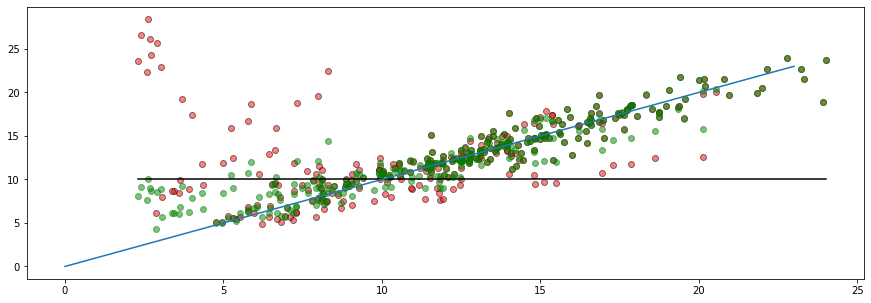

In [ ]:
xiv_r, strat_r, consv_r, reverse_r, n_trades, vixs, dates = Contango(vxx,100, 90,1.1)
plt.figure(figsize=(15,5))
plt.scatter(xiv_r, strat_r, color = 'red', alpha=0.5, edgecolors='black')
plt.scatter(xiv_r, consv_r, color = 'green', alpha=0.5)
plt.plot([min(xiv_r),max(xiv_r)], [10,10], color = 'black')
plt.plot(list(range(int(max(xiv_r)))));

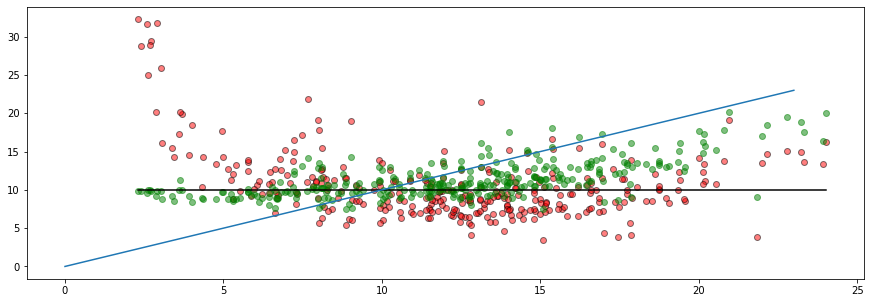

In [ ]:
xiv_r, strat_r, consv_r, reverse_r, n_trades, vixs, dates = Contango(vxx,100, 90,0.9)
plt.figure(figsize=(15,5))
plt.scatter(xiv_r, strat_r, color = 'red', alpha=0.5, edgecolors='black')
plt.scatter(xiv_r, consv_r, color = 'green', alpha=0.5)
plt.plot([min(xiv_r),max(xiv_r)], [10,10], color = 'black')
plt.plot(list(range(int(max(xiv_r)))));

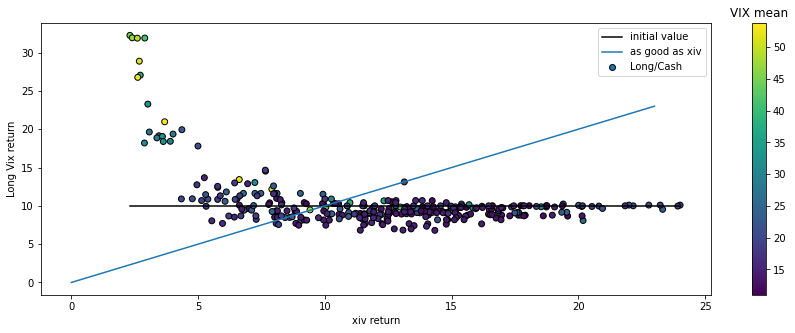

In [ ]:
vix = [np.mean(x) if len(x)>0 else 0 for x in vixs]
plt.figure(figsize=(15,5))
plt.scatter(xiv_r, reverse_r, c=vix, s=35, edgecolor='black')
clb = plt.colorbar()
clb.ax.set_title('VIX mean')
plt.plot([min(xiv_r),max(xiv_r)], [10,10], color = 'black')
plt.plot(list(range(int(max(xiv_r)))))
plt.xlabel('xiv return')
plt.ylabel('Long Vix return')
plt.legend([ 'initial value', 'as good as xiv', 'Long/Cash']);

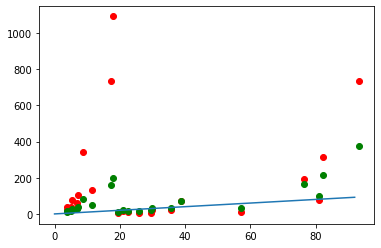

In [ ]:
xiv_r, strat_r, consv_r, reverse_r, n_trades, vixs, dates = Contango(vxx,1000, 900,1)
plt.scatter(xiv_r, strat_r, color = 'red')
plt.scatter(xiv_r, consv_r, color = 'green')
plt.plot(list(range(int(max(xiv_r)))));

In [ ]:
returns = pd.DataFrame(zip(xiv_r, strat_r, consv_r, reverse_r, vix, dates),
                       columns=['xiv_r', 'strat_r', 'consv_r', 'reverse_r',  'vixs', 'start_dates'])
returns.head(2)

,xiv_r,strat_r,consv_r,reverse_r,vixs,start_dates
0,17.364653,8.388075,12.131754,6.914148,16.051616,2004-04-26
1,19.060426,8.239817,13.055056,6.311591,15.767778,2004-05-10


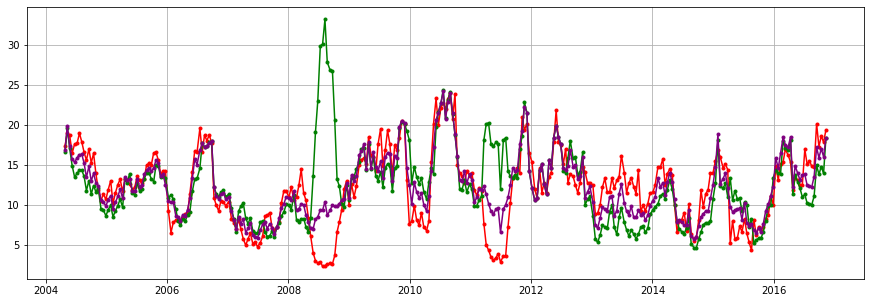

In [ ]:
plt.figure(figsize=(15,5))
plt.plot(returns.start_dates, returns.xiv_r, marker  = 'o', color = 'red', markersize = 3)
plt.plot(returns.start_dates, returns.strat_r, marker  = 'o', color = 'green', markersize = 3)
plt.plot(returns.start_dates, returns.consv_r, marker  = 'o', color = 'purple', markersize = 3)
plt.grid();

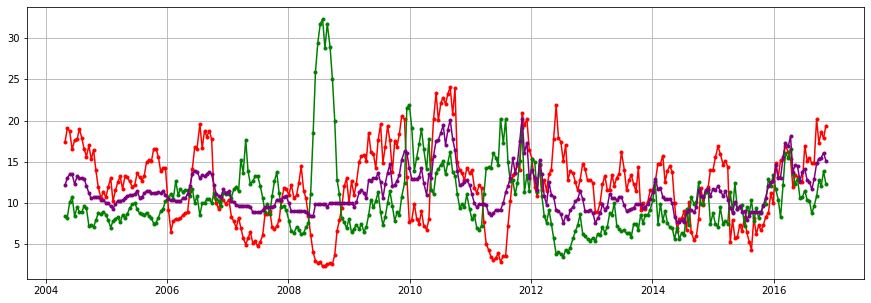

In [ ]:
plt.figure(figsize=(15,5))
plt.plot(returns.start_dates, returns.xiv_r, marker  = 'o', color = 'red', markersize = 3)
plt.plot(returns.start_dates, returns.strat_r, marker  = 'o', color = 'green', markersize = 3)
plt.plot(returns.start_dates, returns.consv_r, marker  = 'o', color = 'purple', markersize = 3)
plt.grid();

Remove 2008-2009 and see what is left from success of strategy.

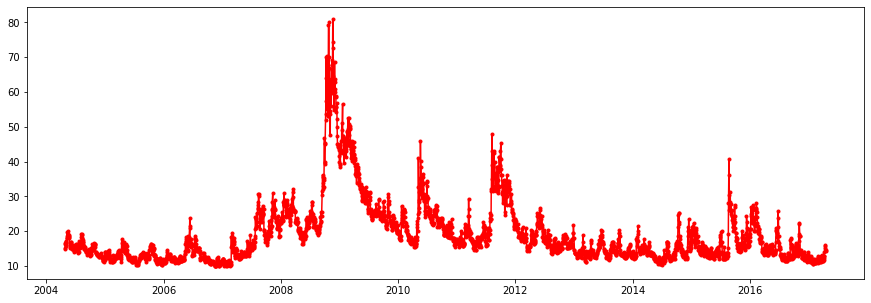

In [ ]:
lenght = int(len(vxx)*0.8)
plt.figure(figsize=(15,5))
lenght = int(len(vxx)*0.8)
plt.plot(vxx.date[:lenght], vxx.vix[:lenght], marker  = 'o', color = 'red', markersize = 3);

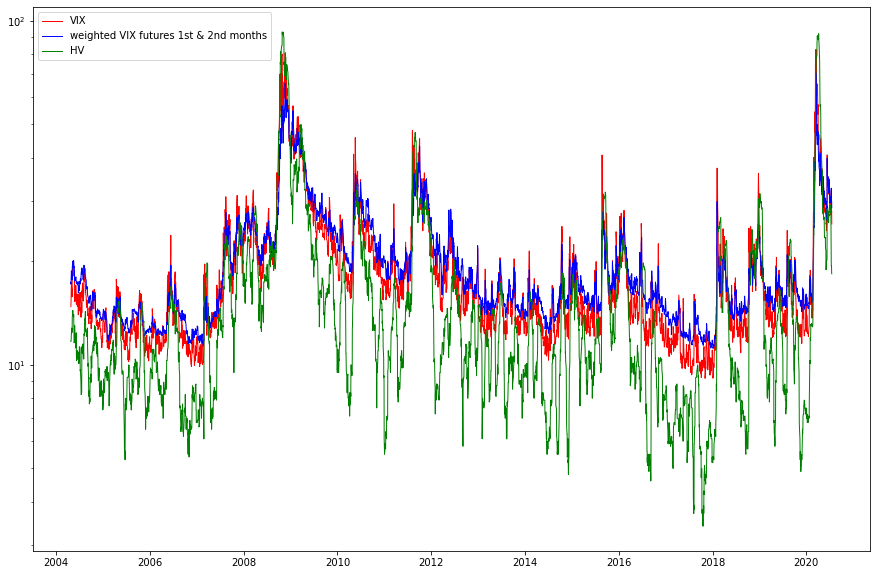

In [ ]:
plt.figure(figsize=(15,10))
plt.plot(vxx.date, vxx.vix, linewidth=0.99, color = 'red')
plt.plot(vxx.date, vxx.weighted, linewidth=0.99, color = 'blue')
plt.plot(vxx.date,vxx.hv_21, linewidth=0.99, color = 'green')
plt.legend(['VIX', 'weighted VIX futures 1st & 2nd months', 'HV'])
plt.yscale('log');

In [ ]:
len(xiv_r)

317

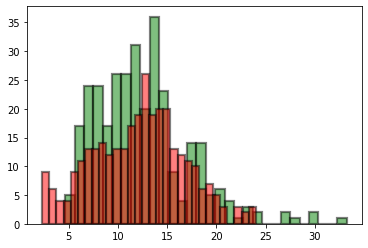

In [ ]:
plt.hist(strat_r, 30,edgecolor='black', linewidth=2.2, color= 'green', alpha = 0.5)
plt.hist(xiv_r, 30,edgecolor='black', linewidth=2.2, color= 'red', alpha = 0.5);

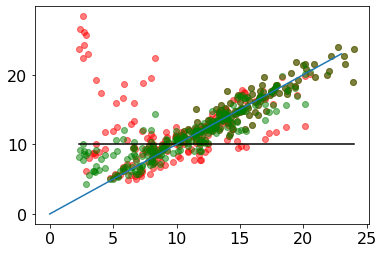

In [ ]:
#xiv_r, strat_r, consv_r, n_trades = Contango(vxx,100, 90, 1.1)
plt.scatter(xiv_r, strat_r, color = 'red', alpha=0.5)
plt.scatter(xiv_r, consv_r, color = 'green', alpha=0.5)
plt.plot([min(xiv_r),max(xiv_r)], [10,10], color = 'black')
plt.plot(list(range(int(max(xiv_r)))));

### VIX

Although VRP success comes from high vix era, if you long vix when it is high, it does not give any edge. 

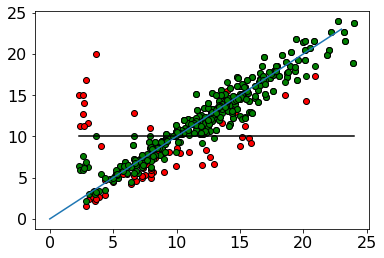

In [ ]:
xiv_r, strat_r, consv_r, reverse_r, n_trades, vixs = VIX(vxx,100, 90, 35)
plt.scatter(xiv_r, strat_r, color = 'red',edgecolor='black')
plt.scatter(xiv_r, consv_r, color = 'green',edgecolor='black')
plt.plot([min(xiv_r),max(xiv_r)], [10,10], color = 'black')
plt.plot(list(range(int(max(xiv_r)))));

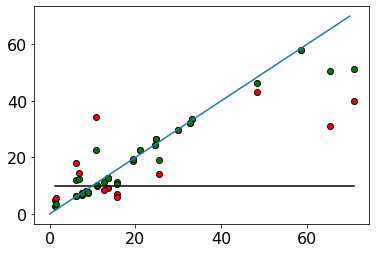

In [ ]:
xiv_r, strat_r, consv_r, reverse_r, n_trades, vixs = VIX(vxx,500, 400, 35)

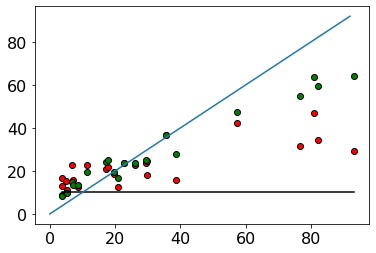

In [ ]:
xiv_r, strat_r, consv_r, reverse_r, n_trades, vixs = VIX(vxx,1000, 900, 35)
plt.scatter(xiv_r, strat_r, color = 'red',edgecolor='black')
plt.scatter(xiv_r, consv_r, color = 'green',edgecolor='black')
plt.plot([min(xiv_r),max(xiv_r)], [10,10], color = 'black')
plt.plot(list(range(int(max(xiv_r)))));

### VRP

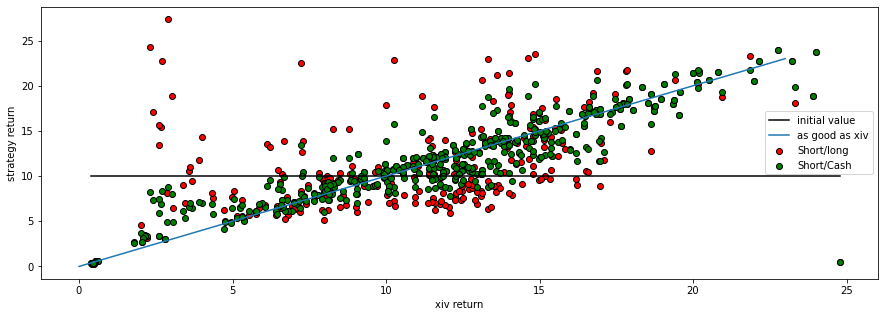

In [ ]:
xiv_r, strat_r, consv_r, reverse_r, n_trades, vixs, dates = VRP(vxx,100, 90)
plt.figure(figsize=(15,5))
plt.scatter(xiv_r, strat_r, color = 'red',edgecolor='black')
plt.scatter(xiv_r, consv_r, color = 'green',edgecolor='black')
plt.plot([min(xiv_r),max(xiv_r)], [10,10], color = 'black')
plt.plot(list(range(int(max(xiv_r)))))
plt.xlabel('xiv return')
plt.ylabel('strategy return')
plt.legend([ 'initial value', 'as good as xiv', 'Short/long', 'Short/Cash']);

There are many 50% drawdowns and many cases that holding XIV beats the strategy. Where it outperforms? 2008, and that is the reason in short periods of time (100 days of holding) the strategy does not beat much, while in long periods like 5 years the accumulative effect of missing 2008 shows up. 

***Final note***:

I decided this is useless for 2004-2017 where it had good performance, but too was statisticaly accidental/curve fitted. Then I wanted to know if out of sample changes my mind. I ran it on out of sample (2017-2020) and it got fucked up in both 18 and 20 vol rise.

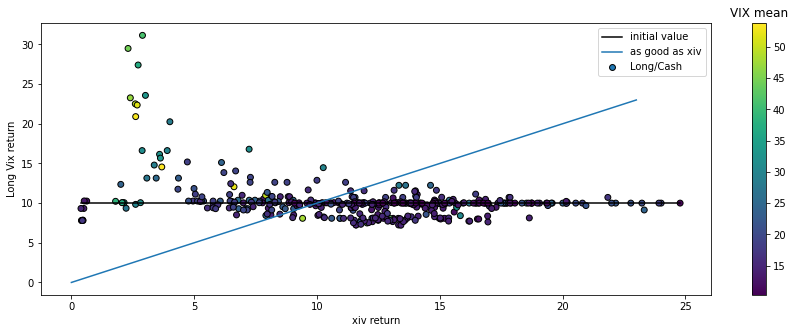

In [ ]:
vix = [np.mean(x) if len(x)>0 else 0 for x in vixs]
plt.figure(figsize=(15,5))
plt.scatter(xiv_r, reverse_r, c=vix, s=35, edgecolor='black')
clb = plt.colorbar()
clb.ax.set_title('VIX mean')
plt.plot([min(xiv_r),max(xiv_r)], [10,10], color = 'black')
plt.plot(list(range(int(max(xiv_r)))))
plt.xlabel('xiv return')
plt.ylabel('Long Vix return')
plt.legend([ 'initial value', 'as good as xiv', 'Long/Cash']);

Apart from no trade (straight black line), all the success of long vix comes from area of high VIX, although many high VIX do not contribute. 

In [ ]:
returns = pd.DataFrame(zip(xiv_r, strat_r, consv_r, reverse_r, vix, dates),
                       columns=['xiv_r', 'strat_r', 'consv_r', 'reverse_r',  'vixs', 'start_dates'])
returns.head(2)

,xiv_r,strat_r,consv_r,reverse_r,vixs,start_dates
0,17.364653,17.102922,17.102922,10.0,16.051616,2004-04-26
1,19.060426,20.236316,20.236316,10.0,15.767778,2004-05-10


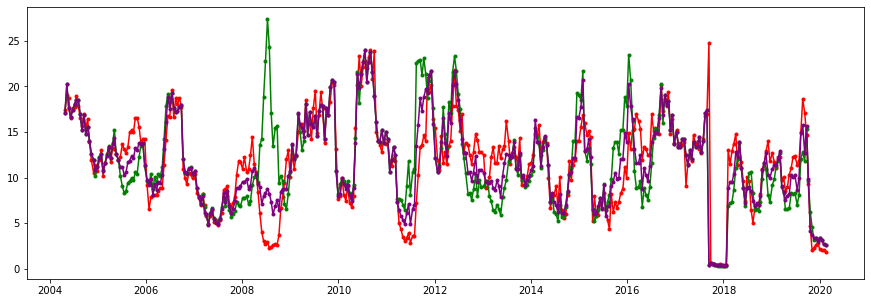

In [ ]:
plt.figure(figsize=(15,5))
plt.plot(returns.start_dates, returns.xiv_r, marker  = 'o', color = 'red', markersize = 3)
plt.plot(returns.start_dates, returns.strat_r, marker  = 'o', color = 'green', markersize = 3)
plt.plot(returns.start_dates, returns.consv_r, marker  = 'o', color = 'purple', markersize = 3);

Remove 2008-2009 and see what is left from success of strategy.

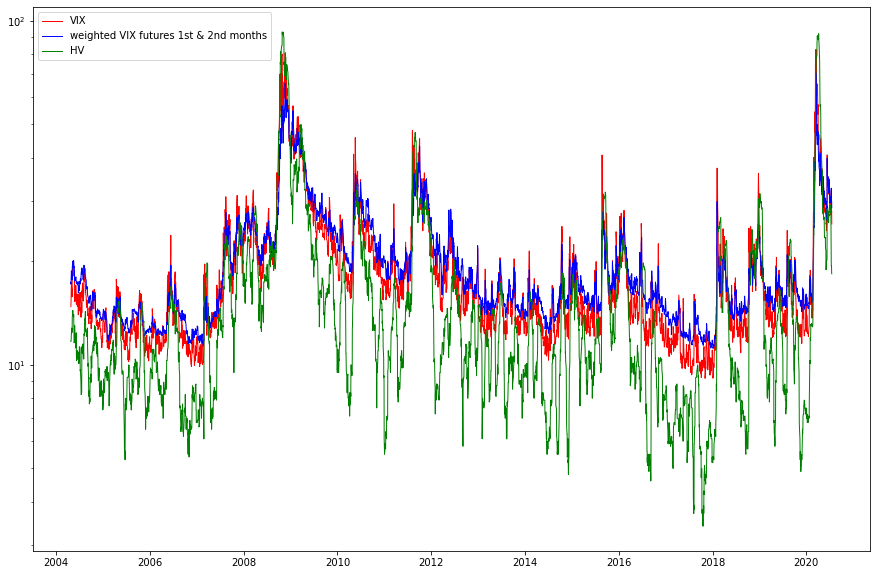

In [ ]:
plt.figure(figsize=(15,10))
plt.plot(vxx.date, vxx.vix, linewidth=0.99, color = 'red')
plt.plot(vxx.date, vxx.weighted, linewidth=0.99, color = 'blue')
plt.plot(vxx.date,vxx.hv_21, linewidth=0.99, color = 'green')
plt.legend(['VIX', 'weighted VIX futures 1st & 2nd months', 'HV'])
plt.yscale('log');

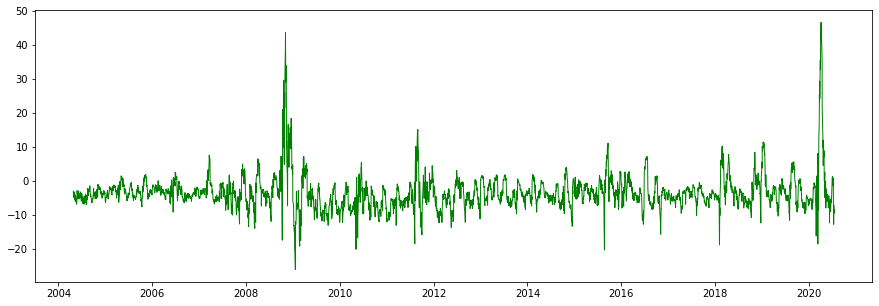

In [ ]:
plt.figure(figsize=(15,5))
plt.plot(vxx.date,vxx.hv_21-vxx.vix, linewidth=0.99, color = 'green');

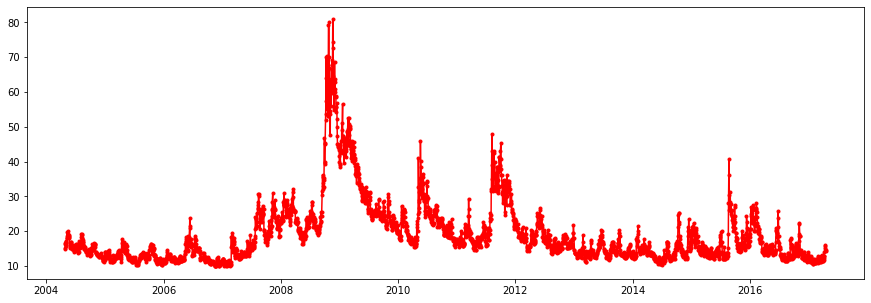

In [ ]:
plt.figure(figsize=(15,5))
lenght = int(len(vxx)*0.8)
plt.plot(vxx.date[:lenght], vxx.vix[:lenght], marker  = 'o', color = 'red', markersize = 3);

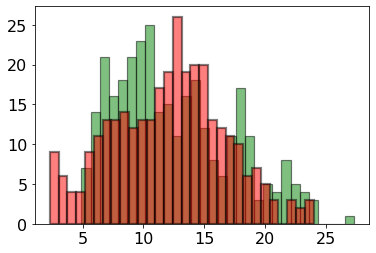

In [ ]:
plt.hist(strat_r, 30,edgecolor='black', linewidth=1.2, color= 'green', alpha = 0.5);
plt.hist(xiv_r, 30,edgecolor='black', linewidth=2.2, color= 'red', alpha = 0.5);

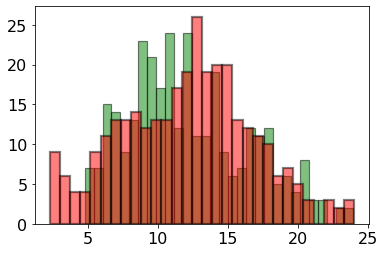

In [ ]:
plt.hist(consv_r, 30,edgecolor='black', linewidth=1.2, color= 'green', alpha = 0.5);
plt.hist(xiv_r, 30,edgecolor='black', linewidth=2.2, color= 'red', alpha = 0.5);

these distributions sound too similar to me! I am giving up on VRP because of these;

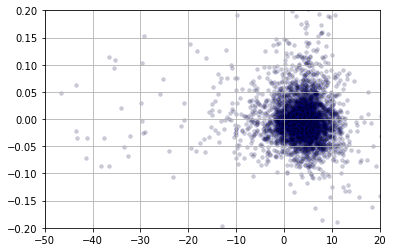

In [ ]:
plt.scatter(vxx.vix[:-1]-vxx.hv_21[:-1], vxx.pct[1:], marker = 'o', linewidth=0.4,edgecolor='blue', color = 'black', s = 15, alpha=0.2)
plt.grid()
plt.axis([-50,20,-0.2,0.2]);

HV-IV in negative area does not show any significant effect on return of the next day, which was used in backtesting. 

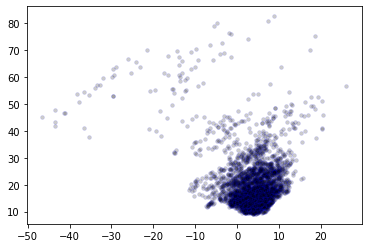

In [ ]:
plt.scatter(vxx.vix-vxx.hv_21, vxx.vix, marker = 'o', linewidth=0.4,edgecolor='blue', color = 'black', s = 15, alpha=0.2)

#### VRP long periods

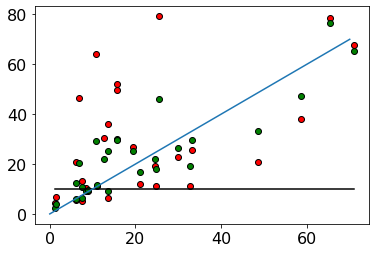

In [ ]:
xiv_r, strat_r, consv_r, reverse_r, n_trades, vixs = VRP(vxx,500, 400)

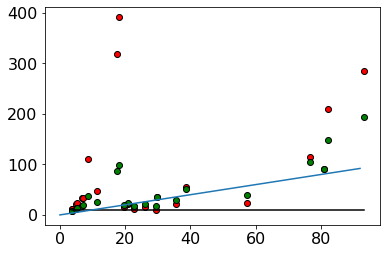

In [ ]:
xiv_r, strat_r, consv_r, reverse_r, n_trades, vixs = VRP(vxx,1000, 900)
plt.scatter(xiv_r, strat_r, color = 'red',edgecolor='black')
plt.scatter(xiv_r, consv_r, color = 'green',edgecolor='black')
plt.plot([min(xiv_r),max(xiv_r)], [10,10], color = 'black')
plt.plot(list(range(int(max(xiv_r)))));

# Twitter feed

In [ ]:
vix = pd.read_csv('http://www.cboe.com/publish/scheduledtask/mktdata/datahouse/vixcurrent.csv')
vix.columns = ['Date' ,	'VIX Open' ,	'VIX High' ,	'VIX Low' ,	'VIX Close']
vix = vix.drop([0])

spy = pdr.get_data_yahoo('SPY', start= '2004-01-02', end = '2020-09-02')
print(len(vix),len(spy))

spy['vix'] = [float(x) for x in vix['VIX Close']]
spy['vix_O'] = [float(x) for x in vix['VIX Open']]
spy['vix_H'] = [float(x) for x in vix['VIX High']]
spy['vix_L'] = [float(x) for x in vix['VIX Low']]
spy['pct'] = pct(list(spy['Close']))
spy['pct_vix'] = pct(list(spy['vix']))
spy.drop('Adj Close', axis = 1, inplace = True)
spy.head()

4197 4197


,High,Low,Open,Close,Volume,vix,vix_O,vix_H,vix_L,pct,pct_vix
Date,,,,,,,,,,,
2004-01-02,112.190002,110.730003,111.739998,111.230003,38072300.0,18.22,17.96,18.68,17.54,0.000000,0.000000
2004-01-05,112.519997,111.589996,111.690002,112.440002,27959800.0,17.49,18.45,18.49,17.44,0.010878,-0.040066
2004-01-06,112.730003,112.000000,112.160004,112.550003,20472800.0,16.73,17.66,17.67,16.19,0.000978,-0.043453
2004-01-07,113.059998,111.889999,112.389999,112.930000,30170400.0,15.50,16.72,16.75,15.50,0.003376,-0.073521
2004-01-08,113.410004,112.769997,113.250000,113.379997,36438400.0,15.61,15.42,15.68,15.32,0.003985,0.007097


In [ ]:
spy['sum_5'] =  accum_pct(spy.pct, 5)
spy['vix_sum_5'] =  accum_pct(spy.pct_vix, 5)
spy.head()

,High,Low,Open,Close,Volume,vix,vix_O,vix_H,vix_L,pct,pct_vix,sum_5,vix_sum_5
Date,,,,,,,,,,,,,
2004-01-02,112.190002,110.730003,111.739998,111.230003,38072300.0,18.22,17.96,18.68,17.54,0.000000,0.000000,NaN,NaN
2004-01-05,112.519997,111.589996,111.690002,112.440002,27959800.0,17.49,18.45,18.49,17.44,0.010878,-0.040066,NaN,NaN
2004-01-06,112.730003,112.000000,112.160004,112.550003,20472800.0,16.73,17.66,17.67,16.19,0.000978,-0.043453,NaN,NaN
2004-01-07,113.059998,111.889999,112.389999,112.930000,30170400.0,15.50,16.72,16.75,15.50,0.003376,-0.073521,NaN,NaN
2004-01-08,113.410004,112.769997,113.250000,113.379997,36438400.0,15.61,15.42,15.68,15.32,0.003985,0.007097,0.019218,-0.149943


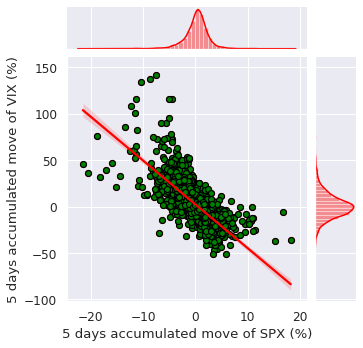

In [ ]:
grid = sns.jointplot(spy.sum_5*100, spy.vix_sum_5*100, kind="reg", color = 'red')
grid.fig.set_figwidth(5)
grid.fig.set_figheight(5)
plt.xlabel('5 days accumulated move of SPX (%)')
plt.ylabel('5 days accumulated move of VIX (%)')
plt.rcParams.update({'font.size': 18})
plt.scatter(spy.sum_5*100, spy.vix_sum_5*100, marker = 'o',edgecolor='black', linewidth=1.2, color = 'green');

In [ ]:
spx_plus = spy[(spy.vix_sum_5 > 0.10) & (spy.sum_5 > 0.02)]
spx_plus

,High,Low,Open,Close,Volume,vix,vix_O,vix_H,vix_L,pct,pct_vix,sum_5,vix_sum_5
Date,,,,,,,,,,,,,
2008-10-16,94.769997,86.540001,91.290001,93.769997,708811200.0,67.61,69.21,81.17,66.51,0.041657,-0.023682,0.049351,0.115455
2017-11-30,266.049988,263.670013,263.760010,265.010010,127894400.0,11.28,10.49,12.05,10.25,0.008755,0.054206,0.020102,0.136643
2019-01-22,265.059998,261.059998,264.820007,262.859985,115531200.0,20.80,18.53,21.15,18.20,-0.013510,0.168539,0.021267,0.101682
2020-09-01,352.709991,349.239990,350.209991,352.600006,54999300.0,26.12,25.86,26.59,25.02,0.009419,-0.010981,0.024468,0.185428
2020-09-02,358.750000,353.429993,354.670013,357.700012,69344600.0,26.57,26.01,27.07,25.53,0.014464,0.017228,0.028906,0.146369


In [ ]:
from datetime import datetime
import time
for i,j in enumerate(list(spy.index)):
  if j == dateutil.parser.parse('2019-01-22'):
    print(i)


3788


In [ ]:
spy[3788:3795]

,High,Low,Open,Close,Volume,vix,vix_O,vix_H,vix_L,pct,pct_vix,sum_5,vix_sum_5
Date,,,,,,,,,,,,,
2019-01-22,265.059998,261.059998,264.820007,262.859985,115531200.0,20.80,18.53,21.15,18.20,-0.013510,0.168539,0.021267,0.101682
2019-01-23,264.790009,260.660004,264.010010,263.410004,86030300.0,19.52,20.85,22.02,19.47,0.002092,-0.061538,0.011899,0.064790
2019-01-24,264.200012,262.079987,263.209991,263.549988,59204100.0,18.89,19.69,20.25,18.63,0.000531,-0.032275,0.010010,0.008859
2019-01-25,266.700012,263.660004,265.609985,265.779999,96883400.0,17.42,18.43,18.46,17.31,0.008461,-0.077819,0.010885,-0.017489
2019-01-28,263.829987,261.790009,263.390015,263.760010,85613700.0,18.87,18.56,20.42,18.42,-0.007600,0.083238,-0.010025,0.080145
2019-01-29,264.549988,262.480011,263.920013,263.410004,66136300.0,19.13,19.45,19.93,18.42,-0.001327,0.013778,0.002158,-0.074616
2019-01-30,268.519989,264.250000,265.100006,267.579987,92473700.0,17.66,19.15,19.31,17.54,0.015831,-0.076843,0.015896,-0.089920


In [ ]:
spy[1206:1211]

,High,Low,Open,Close,Volume,vix,vix_O,vix_H,vix_L,pct,pct_vix,sum_5,vix_sum_5
Date,,,,,,,,,,,,,
2008-10-16,94.769997,86.540001,91.290001,93.769997,708811200.0,67.61,69.21,81.17,66.51,0.041657,-0.023682,0.049351,0.115455
2008-10-17,98.589996,91.650002,91.989998,93.209999,476649000.0,70.33,67.65,74.48,59.82,-0.005972,0.040231,0.067635,0.061349
2008-10-20,99.099998,94.089996,95.349998,98.809998,321294200.0,52.97,70.40,70.40,52.70,0.060079,-0.246836,-0.017483,0.028380
2008-10-21,98.639999,95.220001,96.970001,95.860001,356502000.0,53.11,52.95,56.37,50.91,-0.029855,0.002643,-0.032538,0.028477
2008-10-22,95.860001,87.529999,93.199997,90.639999,516168000.0,69.65,63.12,72.56,60.05,-0.054454,0.311429,0.011455,0.083784


In [ ]:
spy[3503:3509]

,High,Low,Open,Close,Volume,vix,vix_O,vix_H,vix_L,pct,pct_vix,sum_5,vix_sum_5
Date,,,,,,,,,,,,,
2017-11-30,266.049988,263.670013,263.760010,265.010010,127894400.0,11.28,10.49,12.05,10.25,0.008755,0.054206,0.020102,0.136643
2017-12-01,265.309998,260.760010,264.760010,264.459991,164390900.0,11.43,11.19,14.58,10.54,-0.002075,0.013298,0.015716,0.171196
2017-12-04,266.799988,264.079987,266.309998,264.140015,94040600.0,11.68,11.05,11.86,10.26,-0.001210,0.021872,0.015006,0.172386
2017-12-05,265.149994,263.040009,263.190002,263.190002,77994500.0,11.33,11.38,11.67,10.65,-0.003597,-0.029966,0.001264,0.126210
2017-12-06,263.730011,262.709991,263.299988,263.239990,75898600.0,11.02,11.63,11.68,10.86,0.000190,-0.027361,0.002063,0.032049
2017-12-07,264.429993,262.940002,264.070007,264.070007,77218600.0,10.16,10.90,11.32,10.12,0.003153,-0.078040,-0.003539,-0.100197


# Deploy vix

### Load and feature eng

In [ ]:
vix = pd.read_csv('http://www.cboe.com/publish/scheduledtask/mktdata/datahouse/vixcurrent.csv')
vix.columns = ['Date' ,	'VIX Open' ,	'VIX High' ,	'VIX Low' ,	'VIX Close']
vix = vix.drop([0])

spy = pdr.get_data_yahoo('SPY', start= '2004-01-02', end = '2020-08-07')
print(len(vix),len(spy))

spy['vix'] = [float(x) for x in vix['VIX Close']]
spy['vix_O'] = [float(x) for x in vix['VIX Open']]
spy['vix_H'] = [float(x) for x in vix['VIX High']]
spy['vix_L'] = [float(x) for x in vix['VIX Low']]
spy['pct'] = pct(list(spy['Close']))

spy.drop('Adj Close', axis = 1, inplace = True)
spy['std_5'] = stdev(pct(list(spy['Close'])),5)
spy  = spy.round(3)
print(len(spy))
print(spy.head(2))

# spy close/high/low EMA, SMA
spy['o_c'] = spy['Close']/spy['Open']-1
spy['h_l'] = spy['High']/spy['Low']-1
spy['vol_sma_10'] = sma(spy.Volume, 10)
spy['vol_ema_10'] = ema(spy.Volume, 10)
spy['vol_sma_20'] = sma(spy.Volume, 20)
spy['vol_sma_ema'] = spy['vol_ema_10']/spy['vol_sma_10']-1
spy['vol_sma_ema_20'] = spy['vol_ema_10']/spy['vol_sma_20']-1
spy['vol_spot_ema'] = spy['Volume']/spy['vol_ema_10']-1
spy['sma_10'] = sma(spy.Close, 10)
spy['sma_20'] = sma(spy.Close, 20)
spy['sma_50'] = sma(spy.Close, 50)
spy['sma_100'] = sma(spy.Close, 100)
spy['sma_200'] = sma(spy.Close, 200)
spy['ema_10'] = ema(spy.Close, 10)
spy['spot_sma_10'] = spy['Close']/spy['sma_10'] - 1
spy['sma_10_20'] = spy['sma_10']/spy['sma_20'] - 1
spy['sma_10_50'] = spy['sma_10']/spy['sma_50'] - 1
spy['spot_ema_10'] = spy['Close']/spy['ema_10'] - 1
spy['ema_sma_10'] = spy['ema_10']/spy['sma_10'] - 1
spy['ema_sma_20'] = spy['ema_10']/spy['sma_20'] - 1
spy['ema_sma_50'] = spy['ema_10']/spy['sma_50'] - 1
spy['ema_sma_100'] = spy['ema_10']/spy['sma_100'] - 1
spy['ema_sma_200'] = spy['ema_10']/spy['sma_200'] - 1
spy['res_10'], spy['sup_10'] = sup_res(spy['Close'], 10)
spy['res_20'], spy['sup_20'] = sup_res(spy['Close'], 20)
spy['res_50'], spy['sup_50'] = sup_res(spy['Close'], 50)
spy['res_100'], spy['sup_100'] = sup_res(spy['Close'], 100)
spy['res_200'], spy['sup_200'] = sup_res(spy['Close'], 200)
spy['res10'] = spy.Close/spy['res_10']-1
spy['res20'] = spy.Close/spy['res_20']-1
spy['res50'] = spy.Close/spy['res_50']-1
spy['res100'] = spy.Close/spy['res_100']-1
spy['res200'] = spy.Close/spy['res_200']-1
spy['sup10'] = spy.Close/spy['sup_10']-1
spy['sup20'] = spy.Close/spy['sup_20']-1
spy['sup50'] = spy.Close/spy['sup_50']-1
spy['sup100'] = spy.Close/spy['sup_100']-1
spy['sup200'] = spy.Close/spy['sup_200']-1
spy['slope_5'] = slopes(spy.Close,5)
spy['slope_10'] = slopes(spy.Close,10)
spy['slope_20'] = slopes(spy.Close,20)
spy['slope_100'] = slopes(spy.Close,100)

# vix
spy['vix_ema_10'] = ema(spy.vix, 10)
spy['vix_sma_10'] = sma(spy.vix, 10)
spy['vix_sma_20'] = sma(spy.vix, 20)
spy['vix_res_10'], spy['vix_sup_10'] = sup_res(spy['vix'], 10)
spy['vix_res_20'], spy['vix_sup_20'] = sup_res(spy['vix'], 20)
spy['vix_res_50'], spy['vix_sup_50'] = sup_res(spy['vix'], 50)
spy['vix_res_100'], spy['vix_sup_100'] = sup_res(spy['vix'], 100)
spy['vix_res_200'], spy['vix_sup_200'] = sup_res(spy['vix'], 200)
spy['vix_ema'] =  spy['vix']/spy['vix_ema_10'] - 1
spy['vix_ema_sma_10'] = spy['vix_ema_10']/ spy['vix_sma_10'] - 1
spy['vix_ema_sma_20'] = spy['vix_ema_10']/ spy['vix_sma_20'] - 1
spy['vix_res10'] = spy.vix/spy['vix_res_10']-1
spy['vix_res20'] = spy.vix/spy['vix_res_20']-1
spy['vix_res50'] = spy.vix/spy['vix_res_50']-1
spy['vix_sup10'] = spy.vix/spy['vix_sup_10']-1
spy['vix_sup20'] = spy.vix/spy['vix_sup_20']-1
spy['vix_sup50'] = spy.vix/spy['vix_sup_50']-1
spy['vix_slope_5'] = slopes(spy.vix,5)
spy['vix_slope_10'] = slopes(spy.vix,10)
spy['vix_slope_20'] = slopes(spy.vix,20)
spy['vix_o_c'] = spy['vix']/spy['vix_O']-1
spy['vix_h_l'] = spy['vix_H']/spy['vix_L']-1

spy = spy.replace([np.inf, -np.inf], np.nan)
spy = spy.dropna()
print(len(spy))
spy.head(3)

4179 4179
4179
              High     Low    Open   Close  ...  vix_H  vix_L    pct  std_5
Date                                        ...                            
2004-01-02  112.19  110.73  111.74  111.23  ...  18.68  17.54  0.000    0.0
2004-01-05  112.52  111.59  111.69  112.44  ...  18.49  17.44  0.011    0.0

[2 rows x 11 columns]
3980


,High,Low,Open,Close,Volume,vix,vix_O,vix_H,vix_L,pct,std_5,o_c,h_l,vol_sma_10,vol_ema_10,vol_sma_20,vol_sma_ema,vol_sma_ema_20,vol_spot_ema,sma_10,sma_20,sma_50,sma_100,sma_200,ema_10,spot_sma_10,sma_10_20,sma_10_50,spot_ema_10,ema_sma_10,ema_sma_20,ema_sma_50,ema_sma_100,ema_sma_200,res_10,sup_10,res_20,sup_20,res_50,sup_50,...,res20,res50,res100,res200,sup10,sup20,sup50,sup100,sup200,slope_5,slope_10,slope_20,slope_100,vix_ema_10,vix_sma_10,vix_sma_20,vix_res_10,vix_sup_10,vix_res_20,vix_sup_20,vix_res_50,vix_sup_50,vix_res_100,vix_sup_100,vix_res_200,vix_sup_200,vix_ema,vix_ema_sma_10,vix_ema_sma_20,vix_res10,vix_res20,vix_res50,vix_sup10,vix_sup20,vix_sup50,vix_slope_5,vix_slope_10,vix_slope_20,vix_o_c,vix_h_l
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2004-10-18,111.90,110.70,110.89,111.68,43535100.0,14.71,16.16,16.16,14.64,0.004,0.006,0.007124,0.010840,45776570.0,4.811852e+07,44028275.0,0.051161,0.092901,-0.095253,112.516,112.2600,111.4366,111.7579,112.43425,112.032649,-0.007430,0.002280,0.009686,-0.003148,-0.004296,-0.002025,0.005349,0.002458,-0.003572,114.68,110.64,114.68,110.64,114.68,106.98,...,-0.026160,-0.026160,-0.027686,-0.040385,0.009400,0.009400,0.043933,0.045204,0.045204,-0.198,-0.371636,0.013699,-0.011544,14.861898,14.814,14.3390,16.43,13.28,16.43,12.75,19.08,12.75,19.34,12.75,21.58,12.75,-0.010221,0.003233,0.036467,-0.104687,-0.104687,-0.229036,0.107681,0.153725,0.153725,-0.106,0.183394,0.073519,-0.089728,0.103825
2004-10-19,112.23,110.59,112.02,110.74,55851900.0,15.13,16.32,16.32,14.32,-0.008,0.006,-0.011427,0.014830,47670700.0,4.952459e+07,44774830.0,0.038890,0.106081,0.127761,112.200,112.1490,111.5114,111.7429,112.43180,111.797622,-0.013012,0.000455,0.006175,-0.009460,-0.003586,-0.003133,0.002567,0.000490,-0.005641,114.68,110.64,114.68,110.64,114.68,106.98,...,-0.034356,-0.034356,-0.035870,-0.048462,0.000904,0.000904,0.035147,0.036406,0.036406,-0.056,-0.376242,0.003038,-0.011857,14.910644,14.932,14.4125,16.43,13.28,16.43,12.75,19.08,12.75,19.34,12.75,21.58,12.75,0.014711,-0.001430,0.034563,-0.079124,-0.079124,-0.207023,0.139307,0.186667,0.186667,-0.230,0.143030,0.074098,-0.072917,0.139665
2004-10-20,110.82,109.75,110.38,110.52,57118500.0,14.85,15.46,15.53,14.80,-0.002,0.006,0.001268,0.009749,49152770.0,5.090530e+07,45178650.0,0.035655,0.126756,0.122054,111.784,112.0975,111.5542,111.7194,112.42220,111.565327,-0.011308,-0.002797,0.002060,-0.009370,-0.001956,-0.004747,0.000100,-0.001379,-0.007622,113.45,110.52,114.68,110.52,114.68,106.98,...,-0.036275,-0.036275,-0.037785,-0.050352,0.000000,0.000000,0.033090,0.034347,0.034347,-0.076,-0.302545,-0.029692,-0.011900,14.899618,15.089,14.4180,16.43,14.50,16.43,12.75,19.08,12.75,19.34,12.75,21.58,12.75,-0.003330,-0.012551,0.033404,-0.096166,-0.096166,-0.221698,0.024138,0.164706,0.164706,-0.307,0.028424,0.085519,-0.039457,0.049324


In [ ]:
col_spy = [ 'vol_sma_ema', 'vol_sma_ema_20', 'ema_sma_100', 'ema_sma_200',
        'spot_sma_10', 'sma_10_20', 'sma_10_50', 'spot_ema_10', 'ema_sma_10', 'ema_sma_20', 'ema_sma_50',
        'res10' ,	'res20' ,	'res50' ,	'sup10' ,	'sup20' ,	'sup50' ,	'slope_20',
        'slope_100', 'sup100', 'sup200', 'res100', 'res200', 'o_c', 'h_l','vol_spot_ema' ,	'slope_5' ,	'slope_10']
         
col_vix = ['vix', 'vix_ema_sma_10', 'vix_ema_sma_20', 'vix_res10', 'vix_res20',
           'vix_res50', 'vix_sup10','vix_slope_20', 'vix_sup20','vix_sup50', 'vix_slope_5',	'vix_slope_10',	
           'vix_o_c', 'vix_h_l', 'vix_ema']

col_vix_spy = col_spy+col_vix
inputs = spy[col_vix_spy]

### Predict

In [ ]:
x = np.asarray(inputs) 
scaler = MinMaxScaler(feature_range=(0.00001, 1)) 
x = scaler.fit_transform(x)
x = np.concatenate((model_nn.predict(x), model_rf.predict_proba(x), model_xgb.predict_proba(x)), axis=1)
preds = [np.argmax(x) for x in model.predict(x)]
df = spy[['Close', 'vix']].copy(deep = True)
df['actual'] = pct_fwd(df.vix, 20, value = 'nan')
df['prediction'] = preds
df['prediction'] = df['prediction'].replace({0: 'long', 1: 'cash', 2: 'short'})
df[-60:]

,Close,vix,actual,prediction
Date,,,,
2020-05-14,284.97,32.61,0.250843,cash
2020-05-15,286.28,31.89,0.131703,cash
2020-05-18,295.00,29.30,0.174061,cash
2020-05-19,291.97,30.53,0.10285,cash
2020-05-20,296.93,27.99,0.195784,long
2020-05-21,294.88,29.53,0.115476,cash
2020-05-22,295.44,28.16,0.247159,cash
2020-05-26,299.08,28.01,0.134238,long
2020-05-27,303.53,27.62,0.135771,long


# Model vix

## Import Data

In [ ]:
spy = pdr.get_data_yahoo('SPY', start= '2004-01-02', end = '2020-07-17')
#gld = pdr.get_data_yahoo('gld', start= '2004-11-18', end = '2020-07-17')
#tlt = pdr.get_data_yahoo('TLT', start= '2004-11-18', end = '2020-07-17')
vix = pd.read_csv(io.BytesIO(uploaded['vixcurrent.csv']))
#vix = vix[222:]
print(len(vix),len(spy))

spy['vix'] = list(vix['VIX Close'])
#spy['gld'] = list(gld['Close'])
# spy['tlt'] = list(tlt['Close'])
# spy['gldV'] = list(gld['Volume'])
# spy['tltV'] = list(tlt['Volume'])
spy['vix_O'] = list(vix['VIX Open'])
spy['vix_H'] = list(vix['VIX High'])
spy['vix_L'] = list(vix['VIX Low'])

spy['pct'] = pct(list(spy['Close']))
# spy['hv'] = HV(spy.pct, 10)
# spy['hv_m'] = HV_modified(spy.pct, 10)

spy = spy[:3400]
# # gld = gld[:3400]
# # tlt = tlt[:3400]
vix = vix[:3400] # 3380 left

spy.drop('Adj Close', axis = 1, inplace = True)
spy['std_5'] = stdev(pct(list(spy['Close'])),5)
fwd = 20
spy['fwd_20_vix'] = pct_fwd(list(spy['vix']), fwd)
spy['fwd_20_spy'] = pct_fwd(list(spy['Close']), fwd)
# spy['fwd_20_gld'] = pct_fwd(list(spy['gld']), fwd)
# spy['fwd_20_tlt'] = pct_fwd(list(spy['tlt']), fwd)

spy = spy[:-fwd]
spy  = spy.round(3)
print(len(spy))
spy.head(2)

4164 4164
3380


,High,Low,Open,Close,Volume,vix,vix_O,vix_H,vix_L,pct,std_5,fwd_20_vix,fwd_20_spy
Date,,,,,,,,,,,,,
2004-01-02,112.19,110.73,111.74,111.23,38072300.0,18.22,17.96,18.68,17.54,0.000,0.0,-0.087,0.020
2004-01-05,112.52,111.59,111.69,112.44,27959800.0,17.49,18.45,18.49,17.44,0.011,0.0,-0.022,0.014


### Historical vol

correlation = 0.88


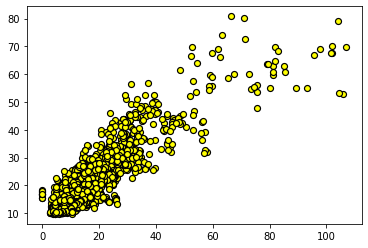

In [ ]:
plt.scatter(spy['hv'], spy['vix'], color = 'yellow',edgecolor='black', linewidth=1.2)
cor, _  = pearsonr(spy['hv'], spy['vix'])
print('correlation = %.2f'% (cor))

correlation = 0.87


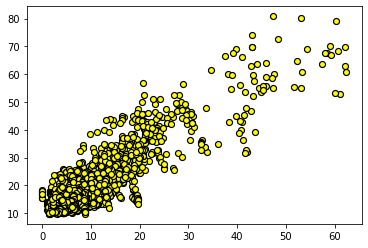

In [ ]:
plt.scatter(spy['hv_m'], spy['vix'], color = 'yellow',edgecolor='black', linewidth=1.2)
cor, _  = pearsonr(spy['hv_m'], spy['vix'])
print('correlation = %.2f'% (cor))

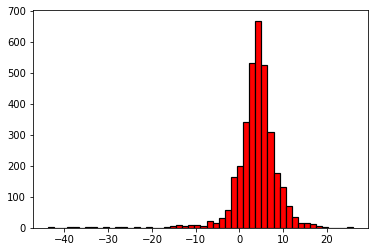

In [ ]:
plt.hist(spy.vix-spy.hv, 50,edgecolor='black', linewidth=1.2, color= 'red');

correlation = 0.18


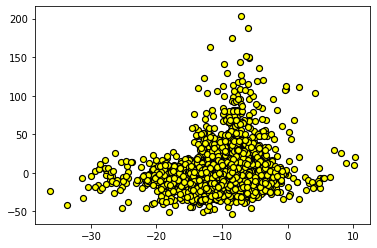

In [ ]:
plt.scatter(spy.hv_m-spy.vix, spy['fwd_20_vix']*100, color = 'yellow',edgecolor='black', linewidth=1.2)
cor, _  = pearsonr(spy.hv_m-spy.vix, spy['fwd_20_vix'])
print('correlation = %.2f'% (cor))

### Stdev in spx with coming change in vix

correlation = -0.02


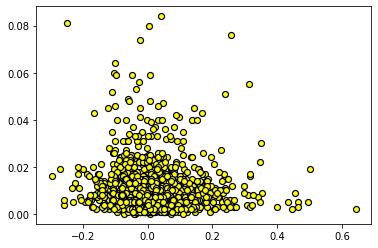

In [ ]:
plt.scatter(spy['fwd_2_vix'], spy['std_5'], color = 'yellow',edgecolor='black', linewidth=1.2)
cor, _  = pearsonr(spy['fwd_2_vix'], spy['std_5'])
print('correlation = %.2f'% (cor))

### Stdev in spx with coming change in spx

correlation = -0.01


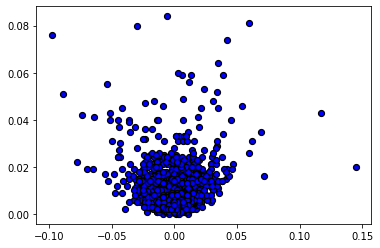

In [ ]:
plt.scatter(spy['fwd_2_spy'], spy['std_5'], color = 'blue',edgecolor='black', linewidth=1.2)
cor, _  = pearsonr(spy['fwd_2_spy'], spy['std_5'])
print('correlation = %.2f'% (cor))

### Stdev in spx with vix

correlation = 0.81


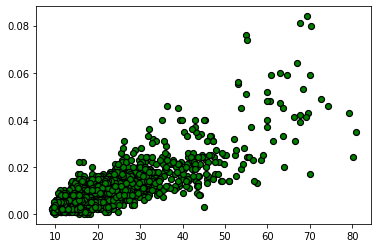

In [ ]:
plt.scatter(spy['vix'], spy['std_5'], color = 'green',edgecolor='black', linewidth=1.2)
cor, _  = pearsonr(spy['vix'], spy['std_5'])
print('correlation = %.2f'% (cor))

## re-test previous work

In [ ]:
spy = pdr.get_data_yahoo('SPY', start= '2000-01-01', end = '2017-10-01')
spy['pct'] = pct(list(spy['Close']))
spy.drop('Adj Close', axis = 1, inplace = True)
spy['fwd_20_spy'] = pct_fwd(list(spy['Close']), 20)
spy  = spy.round(3)
spy.head(2)

,High,Low,Open,Close,Volume,pct,fwd_20_spy
Date,,,,,,,
2000-01-03,148.250,143.875,148.250,145.438,8164300.0,0.000,-0.040
2000-01-04,144.062,139.641,143.531,139.750,8089800.0,-0.039,0.008


In [ ]:
spy['o_c'] = spy['Close']/spy['Open']-1
spy['h_l'] = spy['High']/spy['Low']-1
spy['vol_sma_10'] = spy.Volume/sma(spy.Volume, 10)-1
spy['vol_sma_20'] = spy.Volume/sma(spy.Volume, 20)-1
spy['sma_10'] = sma(spy.Close, 10)
spy['sma_20'] = sma(spy.Close, 20)
spy['sma_50'] = sma(spy.Close, 50)
spy['sma_100'] = sma(spy.Close, 50)
spy['ema_8'] = ema(spy.Close, 8)
spy['spot_sma_20'] = spy['Close']/spy['sma_20'] - 1
spy['spot_sma_50'] = spy['Close']/spy['sma_50'] - 1
spy['spot_sma_100'] = spy['Close']/spy['sma_100'] - 1
spy['sma_20_50'] = spy['sma_20']/spy['sma_50'] - 1
spy['sma_10_100'] = spy['sma_10']/spy['sma_100'] - 1
spy['spot_ema_8'] = spy['Close']/spy['ema_8'] - 1

spy = spy.replace([np.inf, -np.inf], np.nan)
spy = spy.dropna()
spy.head(3)

,High,Low,Open,Close,Volume,pct,fwd_20_spy,o_c,h_l,vol_sma_10,vol_sma_20,sma_10,sma_20,sma_50,sma_100,ema_8,spot_sma_20,spot_sma_50,spot_sma_100,sma_20_50,sma_10_100,spot_ema_8
Date,,,,,,,,,,,,,,,,,,,,,,
2000-03-14,140.094,136.156,139.281,136.625,8263900.0,-0.014,0.104,-0.019069,0.028923,-0.200056,-0.242999,138.7985,137.6945,140.49280,140.49280,138.332565,-0.007767,-0.027530,-0.027530,-0.019918,-0.012060,-0.012344
2000-03-15,140.438,136.062,136.875,139.812,10300800.0,0.023,0.076,0.021458,0.032162,-0.034953,-0.053040,138.9359,137.6312,140.38028,140.38028,138.661329,0.015845,-0.004048,-0.004048,-0.019583,-0.010289,0.008298
2000-03-16,146.844,140.875,141.625,146.344,25601400.0,0.047,-0.000,0.033320,0.042371,1.052381,1.185248,139.7172,137.9984,140.51216,140.51216,140.368589,0.060476,0.041504,0.041504,-0.017890,-0.005658,0.042569


In [ ]:
col = ['Volume', 'pct', 'o_c', 'h_l', 'vol_sma_10', 'vol_sma_20',
        'spot_sma_20', 'spot_sma_50','spot_sma_100','sma_10_100', 'sma_20_50',
       'spot_ema_8']

## Creating features

In [ ]:
# spy close/high/low EMA, SMA
spy['o_c'] = spy['Close']/spy['Open']-1
spy['h_l'] = spy['High']/spy['Low']-1
spy['vol_sma_10'] = sma(spy.Volume, 10)
spy['vol_ema_10'] = ema(spy.Volume, 10)
spy['vol_sma_20'] = sma(spy.Volume, 20)
spy['vol_sma_ema'] = spy['vol_ema_10']/spy['vol_sma_10']-1
spy['vol_sma_ema_20'] = spy['vol_ema_10']/spy['vol_sma_20']-1
spy['vol_spot_ema'] = spy['Volume']/spy['vol_ema_10']-1
spy['sma_10'] = sma(spy.Close, 10)
spy['sma_20'] = sma(spy.Close, 20)
spy['sma_50'] = sma(spy.Close, 50)
spy['sma_100'] = sma(spy.Close, 100)
spy['sma_200'] = sma(spy.Close, 200)
spy['ema_10'] = ema(spy.Close, 10)
spy['spot_sma_10'] = spy['Close']/spy['sma_10'] - 1
spy['sma_10_20'] = spy['sma_10']/spy['sma_20'] - 1
spy['sma_10_50'] = spy['sma_10']/spy['sma_50'] - 1
spy['spot_ema_10'] = spy['Close']/spy['ema_10'] - 1
spy['ema_sma_10'] = spy['ema_10']/spy['sma_10'] - 1
spy['ema_sma_20'] = spy['ema_10']/spy['sma_20'] - 1
spy['ema_sma_50'] = spy['ema_10']/spy['sma_50'] - 1
spy['ema_sma_100'] = spy['ema_10']/spy['sma_100'] - 1
spy['ema_sma_200'] = spy['ema_10']/spy['sma_200'] - 1


spy['res_10'], spy['sup_10'] = sup_res(spy['Close'], 10)
spy['res_20'], spy['sup_20'] = sup_res(spy['Close'], 20)
spy['res_50'], spy['sup_50'] = sup_res(spy['Close'], 50)
spy['res_100'], spy['sup_100'] = sup_res(spy['Close'], 100)
spy['res_200'], spy['sup_200'] = sup_res(spy['Close'], 200)
spy['res10'] = spy.Close/spy['res_10']-1
spy['res20'] = spy.Close/spy['res_20']-1
spy['res50'] = spy.Close/spy['res_50']-1
spy['res100'] = spy.Close/spy['res_100']-1
spy['res200'] = spy.Close/spy['res_200']-1
spy['sup10'] = spy.Close/spy['sup_10']-1
spy['sup20'] = spy.Close/spy['sup_20']-1
spy['sup50'] = spy.Close/spy['sup_50']-1
spy['sup100'] = spy.Close/spy['sup_100']-1
spy['sup200'] = spy.Close/spy['sup_200']-1
spy['slope_5'] = slopes(spy.Close,5)
spy['slope_10'] = slopes(spy.Close,10)
spy['slope_20'] = slopes(spy.Close,20)
spy['slope_100'] = slopes(spy.Close,100)

# vix
spy['vix_ema_10'] = ema(spy.vix, 10)
spy['vix_sma_10'] = sma(spy.vix, 10)
spy['vix_sma_20'] = sma(spy.vix, 20)
spy['vix_res_10'], spy['vix_sup_10'] = sup_res(spy['vix'], 10)
spy['vix_res_20'], spy['vix_sup_20'] = sup_res(spy['vix'], 20)
spy['vix_res_50'], spy['vix_sup_50'] = sup_res(spy['vix'], 50)
spy['vix_res_100'], spy['vix_sup_100'] = sup_res(spy['vix'], 100)
spy['vix_res_200'], spy['vix_sup_200'] = sup_res(spy['vix'], 200)
spy['vix_ema'] =  spy['vix']/spy['vix_ema_10'] - 1
spy['vix_ema_sma_10'] = spy['vix_ema_10']/ spy['vix_sma_10'] - 1
spy['vix_ema_sma_20'] = spy['vix_ema_10']/ spy['vix_sma_20'] - 1
spy['vix_res10'] = spy.vix/spy['vix_res_10']-1
spy['vix_res20'] = spy.vix/spy['vix_res_20']-1
spy['vix_res50'] = spy.vix/spy['vix_res_50']-1
spy['vix_sup10'] = spy.vix/spy['vix_sup_10']-1
spy['vix_sup20'] = spy.vix/spy['vix_sup_20']-1
spy['vix_sup50'] = spy.vix/spy['vix_sup_50']-1
spy['vix_slope_5'] = slopes(spy.vix,5)
spy['vix_slope_10'] = slopes(spy.vix,10)
spy['vix_slope_20'] = slopes(spy.vix,20)
spy['vix_o_c'] = spy['vix']/spy['vix_O']-1
spy['vix_h_l'] = spy['vix_H']/spy['vix_L']-1

# gld
# spy['gld_sma_50'] = sma(spy.gld, 50)
# spy['gld_ema_10'] = ema(spy.gld, 10)
# spy['gld_ema_10_50'] = spy['gld_ema_10']/spy['gld_sma_50'] - 1
# spy['gld_spot_ema_10'] = spy['gld']/spy['gld_ema_10'] - 1
# spy['gld_vol_ema_10'] = ema(spy.gldV, 10)
# spy['gld_vol_sma_50'] = sma(spy.gldV, 50)
# spy['gld_vol_sma_ema'] = spy['gld_vol_ema_10']/spy['gld_vol_sma_50']-1
# spy['gld_vol_spot_ema'] = spy['gldV']/spy['gld_vol_ema_10']-1

# # tlt
# spy['tlt_sma_50'] = sma(spy.tlt, 50)
# spy['tlt_ema_10'] = ema(spy.tlt, 10)
# spy['tlt_ema_10_50'] = spy['tlt_ema_10']/spy['tlt_sma_50'] - 1
# spy['tlt_spot_ema_10'] = spy['tlt']/spy['tlt_ema_10'] - 1
# spy['tlt_vol_ema_10'] = ema(spy.tltV, 10)
# spy['tlt_vol_sma_50'] = sma(spy.tltV, 50)
# spy['tlt_vol_sma_ema'] = spy['tlt_vol_ema_10']/spy['tlt_vol_sma_50']-1
# spy['tlt_vol_spot_ema'] = spy['tltV']/spy['tlt_vol_ema_10']-1
# print(len(spy))

spy = spy.replace([np.inf, -np.inf], np.nan)
spy = spy.dropna()
print(len(spy))

spy.head(3) # 3181 for train

3945


,High,Low,Open,Close,Volume,vix,vix_O,vix_H,vix_L,pct,std_5,fwd_20_vix,fwd_20_spy,o_c,h_l,vol_sma_10,vol_ema_10,vol_sma_20,vol_sma_ema,vol_sma_ema_20,vol_spot_ema,sma_10,sma_20,sma_50,sma_100,sma_200,ema_10,spot_sma_10,sma_10_20,sma_10_50,spot_ema_10,ema_sma_10,ema_sma_20,ema_sma_50,ema_sma_100,ema_sma_200,res_10,sup_10,res_20,sup_20,...,res20,res50,res100,res200,sup10,sup20,sup50,sup100,sup200,slope_5,slope_10,slope_20,slope_100,vix_ema_10,vix_sma_10,vix_sma_20,vix_res_10,vix_sup_10,vix_res_20,vix_sup_20,vix_res_50,vix_sup_50,vix_res_100,vix_sup_100,vix_res_200,vix_sup_200,vix_ema,vix_ema_sma_10,vix_ema_sma_20,vix_res10,vix_res20,vix_res50,vix_sup10,vix_sup20,vix_sup50,vix_slope_5,vix_slope_10,vix_slope_20,vix_o_c,vix_h_l
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2004-10-18,111.90,110.70,110.89,111.68,43535100.0,14.71,16.16,16.16,14.64,0.004,0.006,-0.094,0.064,0.007124,0.010840,45776570.0,4.811852e+07,44028275.0,0.051161,0.092901,-0.095253,112.516,112.2600,111.4366,111.7579,112.43425,112.032649,-0.007430,0.002280,0.009686,-0.003148,-0.004296,-0.002025,0.005349,0.002458,-0.003572,114.68,110.64,114.68,110.64,...,-0.026160,-0.026160,-0.027686,-0.040385,0.009400,0.009400,0.043933,0.045204,0.045204,-0.198,-0.371636,0.013699,-0.011544,14.861898,14.814,14.3390,16.43,13.28,16.43,12.75,19.08,12.75,19.34,12.75,21.58,12.75,-0.010221,0.003233,0.036467,-0.104687,-0.104687,-0.229036,0.107681,0.153725,0.153725,-0.106,0.183394,0.073519,-0.089728,0.103825
2004-10-19,112.23,110.59,112.02,110.74,55851900.0,15.13,16.32,16.32,14.32,-0.008,0.006,-0.116,0.072,-0.011427,0.014830,47670700.0,4.952459e+07,44774830.0,0.038890,0.106081,0.127761,112.200,112.1490,111.5114,111.7429,112.43180,111.797622,-0.013012,0.000455,0.006175,-0.009460,-0.003586,-0.003133,0.002567,0.000490,-0.005641,114.68,110.64,114.68,110.64,...,-0.034356,-0.034356,-0.035870,-0.048462,0.000904,0.000904,0.035147,0.036406,0.036406,-0.056,-0.376242,0.003038,-0.011857,14.910644,14.932,14.4125,16.43,13.28,16.43,12.75,19.08,12.75,19.34,12.75,21.58,12.75,0.014711,-0.001430,0.034563,-0.079124,-0.079124,-0.207023,0.139307,0.186667,0.186667,-0.230,0.143030,0.074098,-0.072917,0.139665
2004-10-20,110.82,109.75,110.38,110.52,57118500.0,14.85,15.46,15.53,14.80,-0.002,0.006,-0.110,0.067,0.001268,0.009749,49152770.0,5.090530e+07,45178650.0,0.035655,0.126756,0.122054,111.784,112.0975,111.5542,111.7194,112.42220,111.565327,-0.011308,-0.002797,0.002060,-0.009370,-0.001956,-0.004747,0.000100,-0.001379,-0.007622,113.45,110.52,114.68,110.52,...,-0.036275,-0.036275,-0.037785,-0.050352,0.000000,0.000000,0.033090,0.034347,0.034347,-0.076,-0.302545,-0.029692,-0.011900,14.899618,15.089,14.4180,16.43,14.50,16.43,12.75,19.08,12.75,19.34,12.75,21.58,12.75,-0.003330,-0.012551,0.033404,-0.096166,-0.096166,-0.221698,0.024138,0.164706,0.164706,-0.307,0.028424,0.085519,-0.039457,0.049324


In [ ]:
col_spy = [ 'vol_sma_ema', 'vol_sma_ema_20', 'ema_sma_100', 'ema_sma_200',
        'spot_sma_10', 'sma_10_20', 'sma_10_50', 'spot_ema_10', 'ema_sma_10', 'ema_sma_20', 'ema_sma_50',
        'res10' ,	'res20' ,	'res50' ,	'sup10' ,	'sup20' ,	'sup50' ,	'slope_20',
        'slope_100', 'sup100', 'sup200', 'res100', 'res200', 'o_c', 'h_l','vol_spot_ema' ,	'slope_5' ,	'slope_10']
         
col_vix = ['vix', 'vix_ema_sma_10', 'vix_ema_sma_20', 'vix_res10', 'vix_res20',
           'vix_res50', 'vix_sup10','vix_slope_20', 'vix_sup20','vix_sup50', 'vix_slope_5',	'vix_slope_10',	
           'vix_o_c', 'vix_h_l', 'vix_ema']

col_gld = ['gld_ema_10_50', 'gld_spot_ema_10', 'gld_vol_sma_ema', 'gld_vol_spot_ema']
col_tlt = ['tlt_ema_10_50', 'tlt_spot_ema_10', 'tlt_vol_sma_ema', 'tlt_vol_spot_ema']

col_tlt_gld = col_gld + col_tlt
               
col_vix_spy = col_spy+col_vix
cols = col_gld + col_vix_spy

To output multiple subplots, the figure containing the passed axes is being cleared


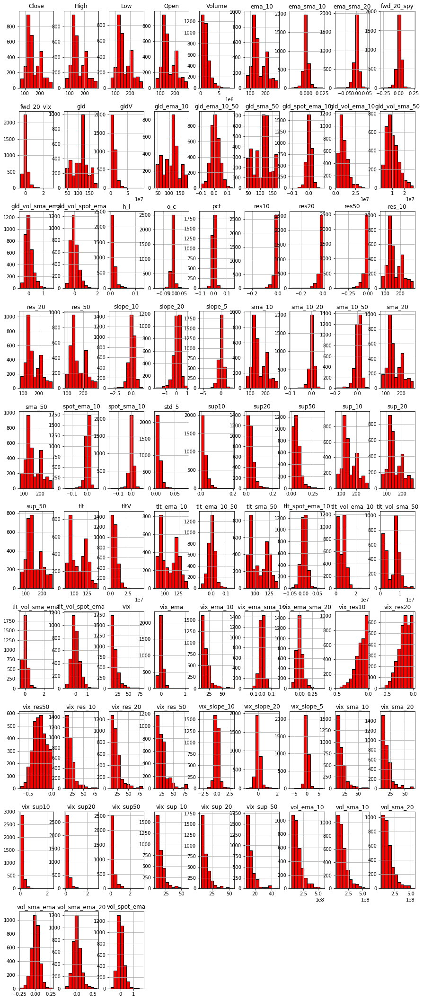

In [ ]:
fig = plt.figure(figsize = (15,38))
ax = fig.gca()
spy.hist(edgecolor='black', linewidth=1.2, color= 'red', ax = ax);

### Labels for ML

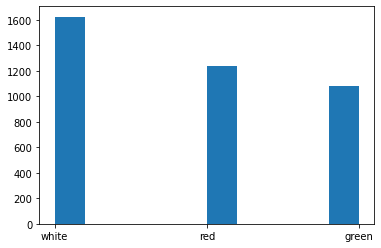

In [ ]:
df = spy[col_vix_spy]
target = spy['fwd_20_vix']
labels = []
label = []
thresh = 0.1
for i in range(len(target)):
  if target[i] > thresh:
    labels.append('green')
    label.append(0)
  elif target[i] > -thresh and target[i]< thresh:
    labels.append('white')
    label.append(1)
  else:
    labels.append('red')
    label.append(2)
plt.hist(labels);

## RF CV

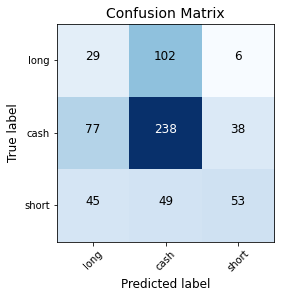

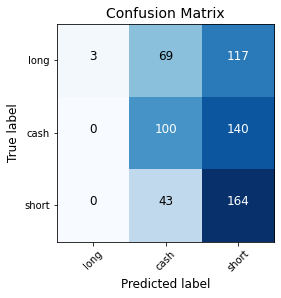

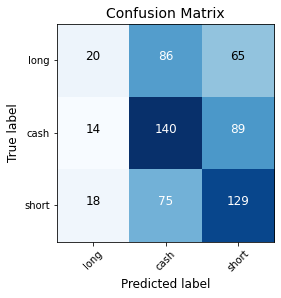

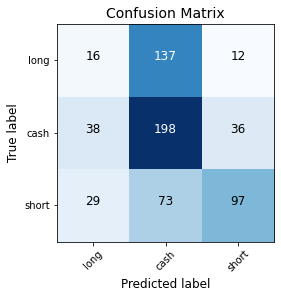

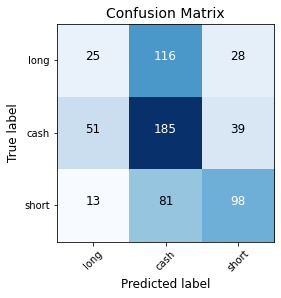

80 20 20 5
long_f1: 0.15 std:  0.06 
 long_p: 0.41 std:  0.3 
 short_p: 0.53 std:  0.1 
 short_f1: 0.52 std:  0.04 



In [ ]:
kf = KFold(n_splits=5)
scaler = MinMaxScaler(feature_range=(0.00001, 1))
x = np.asarray(df) 
x = scaler.fit_transform(x)
y = np.asarray(label)
n_estimators, max_depths, min_samples_split, min_samples_leaf = [80], [20], [20], [5]

for estimators in n_estimators:   
      for max_depth in max_depths:
          for min_sample_split in min_samples_split:
              for min_sample_leaf in min_samples_leaf:
                long_f1,short_p,short_f1,long_p= [],[],[],[]
                for train_index, test_index in kf.split(x):
                  x_train, x_test = x[train_index], x[test_index]
                  y_train, y_test = y[train_index], y[test_index]
                  model_rf = RandomForestClassifier(n_estimators = estimators, max_depth = max_depth,
                    min_samples_split = min_sample_split, min_samples_leaf = min_sample_leaf, 
                    random_state = 13)#, class_weight = {0:1.0,1:0.6, 2:0.89})
                  model_rf.fit(x_train, y_train)  
                  prediction_train = model_rf.predict(x_train)
                  prediction_test = model_rf.predict(x_test)
                  rpt = classification_report(y_test, prediction_test, target_names = ['long', 'cash', 'short'],
                                              output_dict=True)

                  pretty_print_conf_matrix(y_test,prediction_test, classes= ['long', 'cash', 'short'],
                                        normalize=False, title='Confusion Matrix')

                  long_f1.append(rpt['long']['f1-score'])
                  short_p.append(rpt['short']['precision'])   
                  short_f1.append(rpt['short']['f1-score']) 
                  long_p.append(rpt['long']['precision'])
                print(estimators, max_depth, min_sample_split,min_sample_leaf)
                print('long_f1:', round(np.mean(long_f1),2), 'std: ', round(np.std(long_f1),2), '\n', 
                    'long_p:', round(np.mean(long_p),2), 'std: ', round(np.std(long_p),2), '\n',
                      'short_p:', round(np.mean(short_p),2), 'std: ', round(np.std(short_p), 2), '\n', 
                    'short_f1:', round(np.mean(short_f1),2), 'std: ', round(np.std(short_f1),2), '\n')
                

In [ ]:
rpt

{'accuracy': 0.48427672955974843,
 'cash': {'f1-score': 0.563165905631659,
  'precision': 0.48429319371727747,
  'recall': 0.6727272727272727,
  'support': 275},
 'long': {'f1-score': 0.19379844961240314,
  'precision': 0.2808988764044944,
  'recall': 0.14792899408284024,
  'support': 169},
 'macro avg': {'f1-score': 0.43532798769573305,
  'precision': 0.45304382135372195,
  'recall': 0.44369097782559325,
  'support': 636},
 'short': {'f1-score': 0.5490196078431372,
  'precision': 0.593939393939394,
  'recall': 0.5104166666666666,
  'support': 192},
 'weighted avg': {'f1-score': 0.4607457967595671,
  'precision': 0.4633473302216581,
  'recall': 0.48427672955974843,
  'support': 636}}

### Importance

In [ ]:
feature_importances = pd.DataFrame({'importance':model.feature_importances_, 'feature' :col_vix_spy})
feature_importances = feature_importances.round(3)
feature_importances.columns =['feature', 'importance']
feature_importances = feature_importances.sort_values('feature', ascending = False).reset_index(drop=True)
feature_importances

,feature,importance
0,0.059,vix
1,0.055,res200
2,0.050,ema_sma_200
3,0.047,res50
4,0.042,sup200
5,0.040,res100
6,0.037,slope_100
7,0.035,ema_sma_100
8,0.034,sup50
9,0.033,vix_sup20


### SHAP

In [ ]:
explainerRF = shap.TreeExplainer(model_rf,shap.sample(x_train, 100))

In [ ]:
shap_values = explainerRF.shap_values(x_train)#, check_additivity=False)

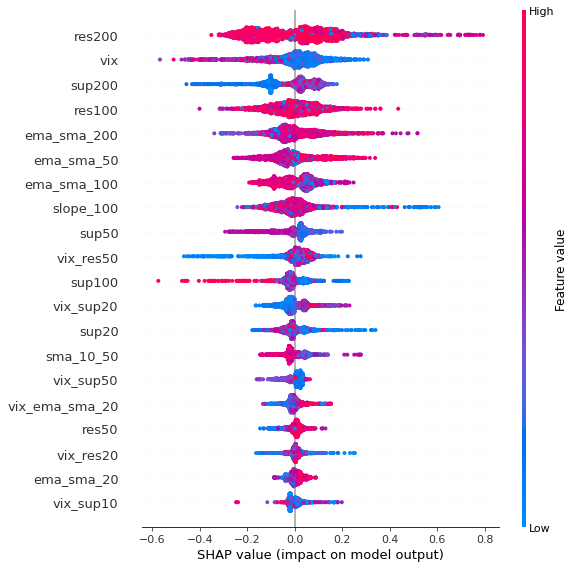

In [ ]:
shap.summary_plot(shap_values[0], x_train, feature_names=col_vix_spy) # volitility increases

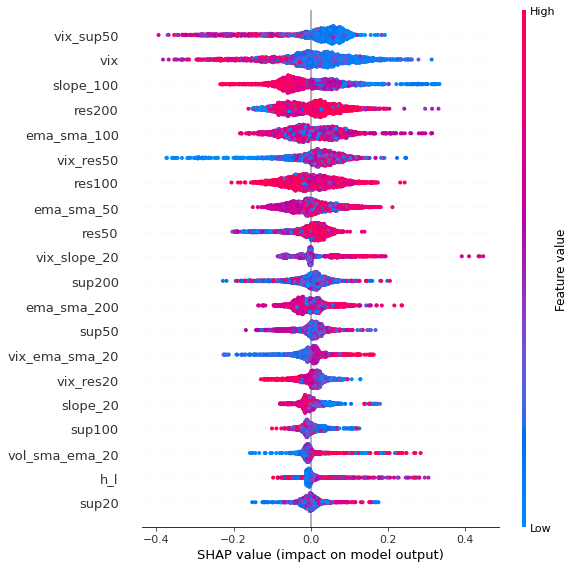

In [ ]:
shap.summary_plot(shap_values[1], x_train, feature_names=col_vix_spy)

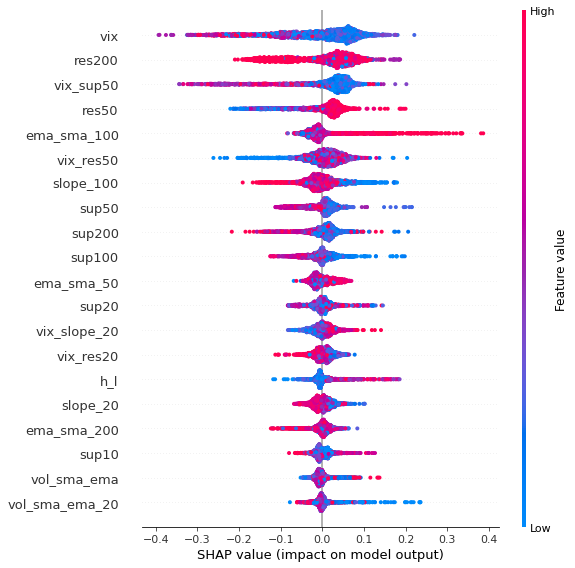

In [ ]:
shap.summary_plot(shap_values[2], x_train, feature_names=col_vix_spy) # class for vol decreases. 

## XGB CV

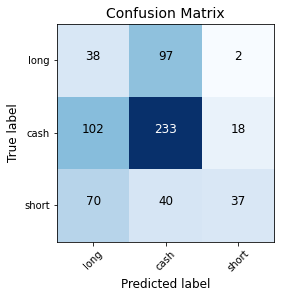

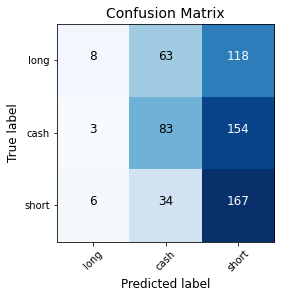

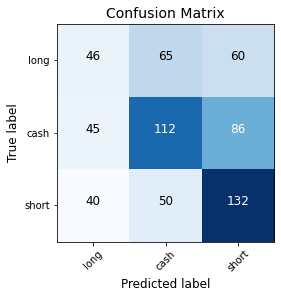

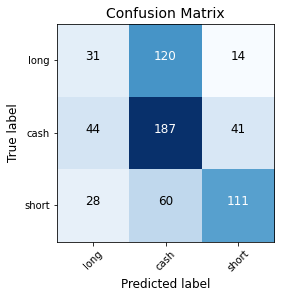

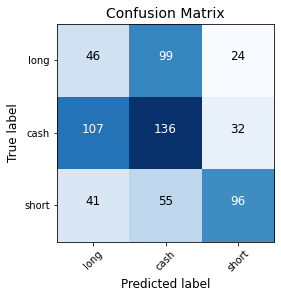

6 0.03 100
long_f1: 0.22 std:  0.08 
 long_p: 0.31 std:  0.1 
 short_p: 0.56 std:  0.11 
 short_f1: 0.51 std:  0.08 



In [ ]:
kf = KFold(n_splits=5)
scaler = MinMaxScaler(feature_range=(0.00001, 1))
x = np.asarray(df) 
x = scaler.fit_transform(x)
y = np.asarray(label)
max_depths, learning_rates, n_estimators, scale_pos_weights  = [6], [0.03], [100], [1]

for n_estimator in n_estimators:   
      for max_depth in max_depths:
          for learning_rate in learning_rates:
            for scale_pos_weight in scale_pos_weights: 
                long_f1,short_p,short_f1,long_p= [],[],[],[]
                for train_index, test_index in kf.split(x):
                  x_train, x_test = x[train_index], x[test_index]
                  y_train, y_test = y[train_index], y[test_index]
                  model_xgb =  XGBClassifier(max_depth=max_depth, learning_rate= learning_rate,
                                        n_estimators=n_estimator, scale_pos_weight = scale_pos_weight )
                  model_xgb.fit(x_train, y_train)#, sample_weight=np.asarray([1,1,1]))  
                  prediction_train = model_xgb.predict(x_train)
                  prediction_test = model_xgb.predict(x_test)
                  rpt = classification_report(y_test, prediction_test, target_names = ['long', 'cash', 'short'],
                                              output_dict=True)

                  pretty_print_conf_matrix(y_test,prediction_test, classes= ['long', 'cash', 'short'],
                                        normalize=False, title='Confusion Matrix')

                  long_f1.append(rpt['long']['f1-score'])
                  short_p.append(rpt['short']['precision'])   
                  short_f1.append(rpt['short']['f1-score']) 
                  long_p.append(rpt['long']['precision'])
                print(max_depth, learning_rate, n_estimator)
                print('long_f1:', round(np.mean(long_f1),2), 'std: ', round(np.std(long_f1),2), '\n', 
                    'long_p:', round(np.mean(long_p),2), 'std: ', round(np.std(long_p),2), '\n',
                      'short_p:', round(np.mean(short_p),2), 'std: ', round(np.std(short_p), 2), '\n', 
                    'short_f1:', round(np.mean(short_f1),2), 'std: ', round(np.std(short_f1),2), '\n')

### Importance

In [ ]:
feature_importances = pd.DataFrame({'importance':model.feature_importances_, 'feature' :col_vix_spy})
feature_importances = feature_importances.round(3)
feature_importances.columns =['feature', 'importance']
feature_importances = feature_importances.sort_values('feature', ascending = False).reset_index(drop=True)
feature_importances

,feature,importance
0,0.153,res100
1,0.061,res200
2,0.033,sup100
3,0.031,vix_res50
4,0.031,ema_sma_200
5,0.031,vix
6,0.030,vix_sup20
7,0.028,sup50
8,0.026,slope_100
9,0.025,sup20


### SHAP

In [ ]:
explainerRF = shap.TreeExplainer(model_xgb,shap.sample(x_train, 100))

In [ ]:
shap_values = explainerRF.shap_values(x_train)#, check_additivity=False)

100%|===================| 7620/7635 [01:52<00:00]       

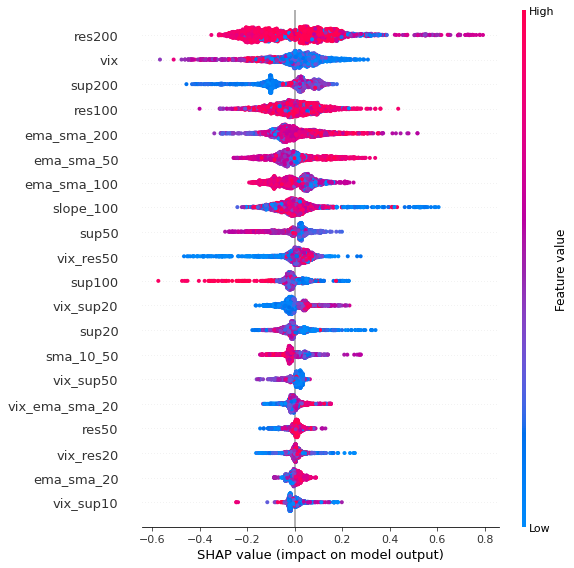

In [ ]:
shap.summary_plot(shap_values[0], x_train, feature_names=col_vix_spy) # volitility increases

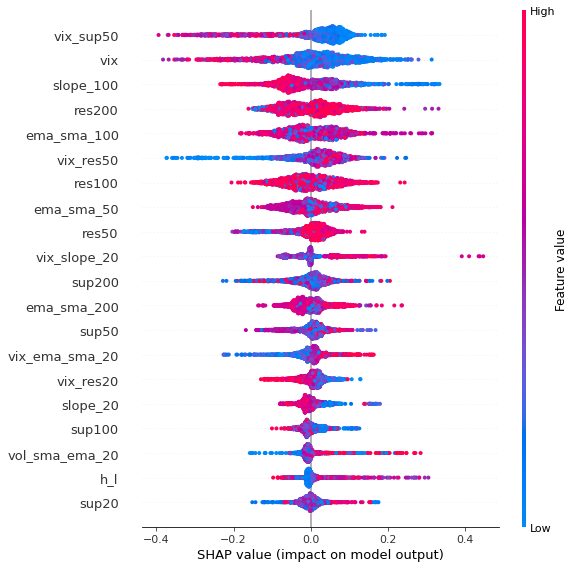

In [ ]:
shap.summary_plot(shap_values[1], x_train, feature_names=col_vix_spy) # volitility increases

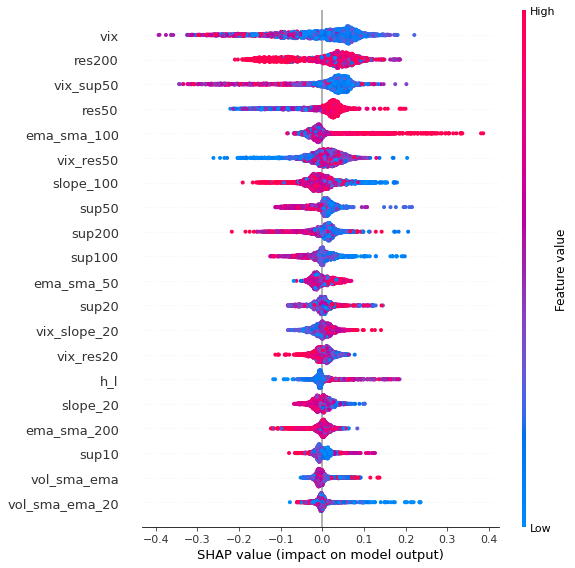

In [ ]:
shap.summary_plot(shap_values[2], x_train, feature_names=col_vix_spy)

## NN CV

In [ ]:
kf = KFold(n_splits=5)
t = time.time()
x = np.asarray(df)
scaler = MinMaxScaler(feature_range=(0.00001, 1)) 
x = scaler.fit_transform(x)
y = np.asarray(label)


softmax_units = len(np.unique(labels))
#for loops were used to get to these optimal values for units, lr, epochs, etc:
units = [50]
epochs = 50
batch_sizes = [16]
lrs = [0.001]
fix_rnd_Keras() # fixing rnd of calculations

for lr in lrs:
    for unit in units:
        for batch_size in batch_sizes:
          long_f1,short_p,short_f1,long_p= [],[],[],[]
          for train_index, test_index in kf.split(x):
            x_train, x_test = x[train_index], x[test_index]
            y_train, y_test = y[train_index], y[test_index]
            model_nn = Sequential()
            model_nn.add(Dense(units = unit,input_dim = x_train.shape[1], activation='relu'))
            model_nn.add(Dropout(0.5))
            
            model_nn.add(Dense(units = softmax_units,  activation='softmax'))
            opt = SGD(lr=lr, momentum=0.9, decay=0.001)
            opt = Adam(lr = lr)
            model_nn.compile(optimizer = opt, loss='sparse_categorical_crossentropy' ,  metrics=['accuracy'])
            history = model_nn.fit(x_train, y_train, epochs = epochs, batch_size = batch_size,
          validation_data=(x_test, y_test),verbose = 0, shuffle=False, class_weight = {0:1.0,1:0.64, 2:0.89})

            
            pred = model_nn.predict(x_test) 
            preds = []
            for i in range(len(pred)):
                preds.append(np.argmax(pred[i]))
            pretty_print_conf_matrix(y_test,preds, 
                classes= ['long', 'cash', 'short'],normalize=False, title='Confusion Matrix')
            rpt = classification_report(y_test, preds, target_names = ['long', 'cash', 'short'],output_dict=True)
            long_f1.append(rpt['long']['f1-score'])
            short_p.append(rpt['short']['precision'])   
            short_f1.append(rpt['short']['f1-score']) 
            long_p.append(rpt['long']['precision'])
          print('it took: ', round(time.time()-t), lr,unit, batch_size)
          print('long_f1:', round(np.mean(long_f1),2), 'std: ', round(np.std(long_f1),2), '\n', 
                'long_p:', round(np.mean(long_p),2), 'std: ', round(np.std(long_p),2), '\n',
                  'short_p:', round(np.mean(short_p),2), 'std: ', round(np.std(short_p), 2), '\n', 
                'short_f1:', round(np.mean(short_f1),2), 'std: ', round(np.std(short_f1),2), '\n')
          
          pyplot.plot(history.history['loss'], label='train')
          pyplot.plot(history.history['val_loss'], label='test')
          pyplot.legend()
          pyplot.show()

### Probabilities and predictions

In [ ]:
pred = model_nn.predict(x) 
preds = []
for i in range(len(pred)):
    preds.append(np.argmax(pred[i]))
predictions = pd.DataFrame(pred, columns=['long', 'cash', 'short'])
predictions['predicted'] = preds
predictions['y'] = label
predictions[1900:1960]

,long,cash,short,predicted,y
1900,0.292235,0.326139,0.381627,2,0
1901,0.196837,0.255243,0.547920,2,0
1902,0.198165,0.275007,0.526829,2,0
1903,0.182587,0.252189,0.565225,2,0
1904,0.157699,0.234173,0.608128,2,0
1905,0.186683,0.260987,0.552330,2,0
1906,0.157432,0.233104,0.609464,2,1
1907,0.134963,0.209193,0.655844,2,1
1908,0.137070,0.209610,0.653320,2,1
1909,0.136269,0.207012,0.656719,2,1


## Ensemble

Tuning hyperparameters for the ensemble trained on each section of data individually.

Among 5 models, 4 are trained on training data that includes the test for the ensemble, thus it gives too good fit as it already seen the data. 

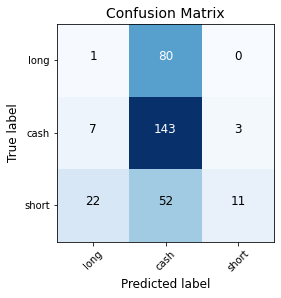

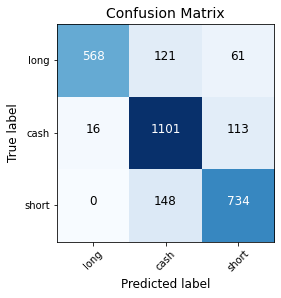

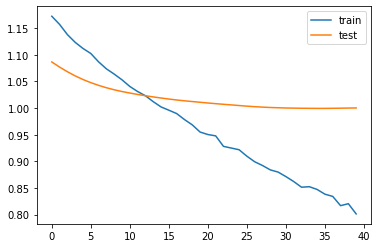

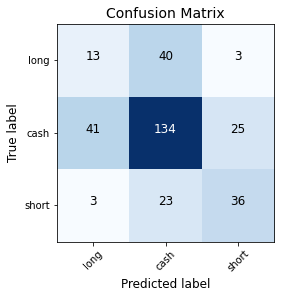

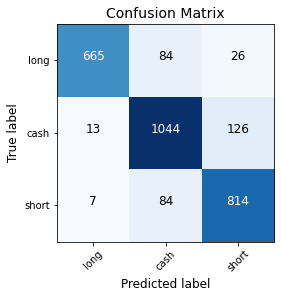

...

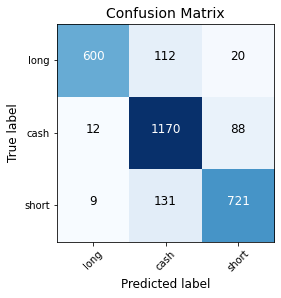

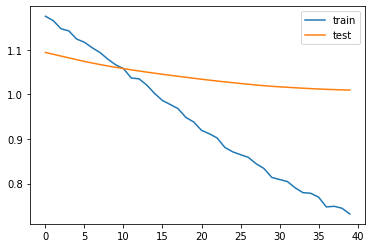

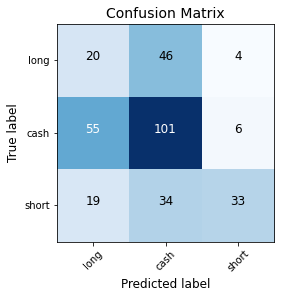

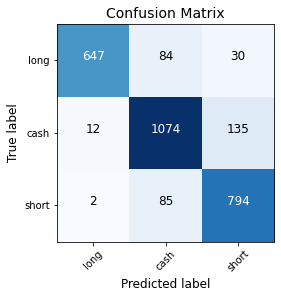

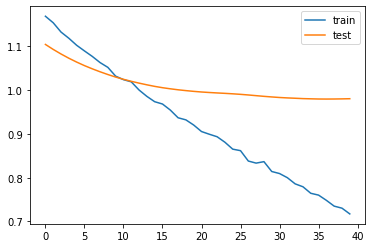

it took:  17 0.001 40 1024
long_f1: 0.16 std:  0.1 
 long_p: 0.24 std:  0.13 
 short_p: 0.58 std:  0.16 
 short_f1: 0.53 std:  0.13 

              precision    recall  f1-score   support

        long       0.98      0.85      0.91       761
        cash       0.86      0.88      0.87      1221
       short       0.83      0.90      0.86       881

    accuracy                           0.88      2863
   macro avg       0.89      0.88      0.88      2863
weighted avg       0.88      0.88      0.88      2863

Model: "sequential_19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_38 (Dense)             (None, 40)                400       
_________________________________________________________________
dropout_19 (Dropout)         (None, 40)                0         
_________________________________________________________________
dense_39 (Dense)             (None, 3)                 123       


In [ ]:
kf = KFold(n_splits=10)
scaler = MinMaxScaler(feature_range=(0.00001, 1))
x = np.asarray(df) 
x = scaler.fit_transform(x)
y = np.asarray(label)
estimators, max_depth, min_sample_split, min_sample_leaf = 80, 20, 20, 5
max_depth, learning_rate, n_estimator, scale_pos_weight  = 6, 0.03, 100, 1

softmax_units = len(np.unique(labels))

units = [40]
epochs = [40]
batch_sizes = [1024]
lrs = [0.001]
fix_rnd_Keras() # fixing rnd of calculations

for lr in lrs:
    for unit in units:
        for batch_size in batch_sizes:
          for epoch in epochs:
            long_f1,short_p,short_f1,long_p= [],[],[],[]
            for train_index, test_index in kf.split(x):
              t = time.time()
              x_train, x_test = x[train_index], x[test_index]
              y_train, y_test = y[train_index], y[test_index]
              model_rf = RandomForestClassifier(n_estimators = estimators, max_depth = max_depth,
                min_samples_split = min_sample_split, min_samples_leaf = min_sample_leaf, 
                random_state = 13)
              model_rf.fit(x_train, y_train)  

              model_xgb =  XGBClassifier(max_depth=max_depth, learning_rate= learning_rate,
                                    n_estimators=n_estimator, scale_pos_weight = scale_pos_weight )
              model_xgb.fit(x_train, y_train)
             
              model_nn = Sequential()
              model_nn.add(Dense(units = 50,input_dim = x_train.shape[1], activation='relu'))
              model_nn.add(Dropout(0.5))
              
              model_nn.add(Dense(units = softmax_units,  activation='softmax'))
              opt = Adam(lr = 0.001)
              model_nn.compile(optimizer = opt, loss='sparse_categorical_crossentropy' ,  metrics=['accuracy'])
              history = model_nn.fit(x_train, y_train, epochs = 50, batch_size = 16,
            validation_data=(x_test, y_test),verbose = 0, shuffle=False, class_weight = {0:1.0,1:0.64, 2:0.89})

              
              pred = model_nn.predict(x_test) 
              preds_nn = []
              for i in range(len(pred)):
                  preds_nn.append(np.argmax(pred[i]))
              
              x_train= np.concatenate((model_nn.predict(x_train), model_rf.predict_proba(x_train),
                                       model_xgb.predict_proba(x_train)), axis=1)
              x_test= np.concatenate((model_nn.predict(x_test), model_rf.predict_proba(x_test),
                                      model_xgb.predict_proba(x_test)), axis=1)
              model = Sequential()
              model.add(Dense(units = unit,input_dim = x_train.shape[1], activation='relu'))
              model.add(Dropout(0.5))
              
              model.add(Dense(units = softmax_units,  activation='softmax'))
              opt = SGD(lr=lr, momentum=0.9, decay=0.001)
              opt = Adam(lr = lr)
              model.compile(optimizer = opt, loss='sparse_categorical_crossentropy' ,  metrics=['accuracy'])
              history = model.fit(x_train, y_train, epochs = epoch, batch_size = batch_size,
            validation_data=(x_test, y_test),verbose = 0, shuffle=False, class_weight = {0:1.3,1:1, 2:0.99})              
              pred = model.predict(x_test) 
              preds = []
              for i in range(len(pred)):
                  preds.append(np.argmax(pred[i]))
              pretty_print_conf_matrix(y_test,preds, 
                  classes= ['long', 'cash', 'short'],normalize=False, title='Confusion Matrix')
              pred_train = model.predict(x_train) 
              preds_train = []
              for i in range(len(pred_train)):
                  preds_train.append(np.argmax(pred_train[i]))
              pretty_print_conf_matrix(y_train,preds_train, 
                  classes= ['long', 'cash', 'short'],normalize=False, title='Confusion Matrix')
              rpt = classification_report(y_test, preds, target_names = ['long', 'cash', 'short'],output_dict=True)
              long_f1.append(rpt['long']['f1-score'])
              short_p.append(rpt['short']['precision'])   
              short_f1.append(rpt['short']['f1-score']) 
              long_p.append(rpt['long']['precision'])
              pyplot.plot(history.history['loss'], label='train')
              pyplot.plot(history.history['val_loss'], label='test')
              pyplot.legend()
              pyplot.show()
            print('it took: ', round(time.time()-t), lr,unit, batch_size)
            print('long_f1:', round(np.mean(long_f1),2), 'std: ', round(np.std(long_f1),2), '\n', 
                  'long_p:', round(np.mean(long_p),2), 'std: ', round(np.std(long_p),2), '\n',
                    'short_p:', round(np.mean(short_p),2), 'std: ', round(np.std(short_p), 2), '\n', 
                  'short_f1:', round(np.mean(short_f1),2), 'std: ', round(np.std(short_f1),2), '\n')
print(classification_report(y_train, preds_train, target_names = ['long', 'cash', 'short']))
model.summary()

## Save to drive

In [ ]:
pickle.dump(model_rf, open('model_rf.pkl','wb'))
pickle.dump(model_xgb, open('model_xgb.pkl','wb'))

In [ ]:
model_json = model.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)
model.save_weights("model.h5")

In [ ]:
model_json = model_nn.to_json()
with open("model_nn.json", "w") as json_file:
    json_file.write(model_json)
model_nn.save_weights("model_nn.h5")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp model.json "drive/My Drive/Data/money_again"
!cp model_nn.json "drive/My Drive/Data/money_again"
!cp model.h5 "drive/My Drive/Data/money_again"
!cp model_nn.h5 "drive/My Drive/Data/money_again"
!cp model_rf.pkl "drive/My Drive/Data/money_again"
!cp model_xgb.pkl "drive/My Drive/Data/money_again"

## Load

In [ ]:
json_file = open('drive/My Drive/Data/money_again/model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model = model_from_json(loaded_model_json)
# load weights into new model
model.load_weights("drive/My Drive/Data/money_again/model.h5")

json_file = open('drive/My Drive/Data/money_again/model_nn.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model_nn = model_from_json(loaded_model_json)
# load weights into new model
model_nn.load_weights("drive/My Drive/Data/money_again/model_nn.h5")

model_rf = pickle.load(open('drive/My Drive/Data/money_again/model_rf.pkl','rb'))
model_xgb = pickle.load(open('drive/My Drive/Data/money_again/model_xgb.pkl','rb'))

## Out of Sample test

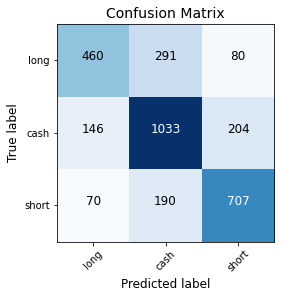

              precision    recall  f1-score   support

        long       0.68      0.55      0.61       831
        cash       0.68      0.75      0.71      1383
       short       0.71      0.73      0.72       967

    accuracy                           0.69      3181
   macro avg       0.69      0.68      0.68      3181
weighted avg       0.69      0.69      0.69      3181



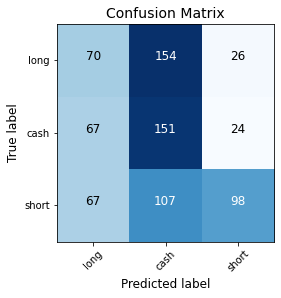

              precision    recall  f1-score   support

        long       0.34      0.28      0.31       250
        cash       0.37      0.62      0.46       242
       short       0.66      0.36      0.47       272

    accuracy                           0.42       764
   macro avg       0.46      0.42      0.41       764
weighted avg       0.46      0.42      0.41       764



In [ ]:
x = np.asarray(df) 
scaler = MinMaxScaler(feature_range=(0.00001, 1)) 
x = scaler.fit_transform(x)
y = np.asarray(label)
x_train, y_train, x_test, y_test = x[:3181], y[:3181], x[3181:], y[3181:]
x_train= np.concatenate((model_nn.predict(x_train), model_rf.predict_proba(x_train),
                                       model_xgb.predict_proba(x_train)), axis=1)
x_test= np.concatenate((model_nn.predict(x_test), model_rf.predict_proba(x_test),
                        model_xgb.predict_proba(x_test)), axis=1)

pred_train = model.predict(x_train) 
preds_train = []
for i in range(len(pred_train)):
    preds_train.append(np.argmax(pred_train[i]))
pretty_print_conf_matrix(y_train,preds_train, 
    classes= ['long', 'cash', 'short'],normalize=False, title='Confusion Matrix')
rpt = classification_report(y_train, preds_train, target_names = ['long', 'cash', 'short'])
print(rpt)

pred_test = model.predict(x_test) 
preds_test = []
for i in range(len(pred_test)):
    preds_test.append(np.argmax(pred_test[i]))
pretty_print_conf_matrix(y_test,preds_test, 
    classes= ['long', 'cash', 'short'],normalize=False, title='Confusion Matrix')
rpt = classification_report(y_test, preds_test, target_names = ['long', 'cash', 'short'])
print(rpt)

# Others

## PCA

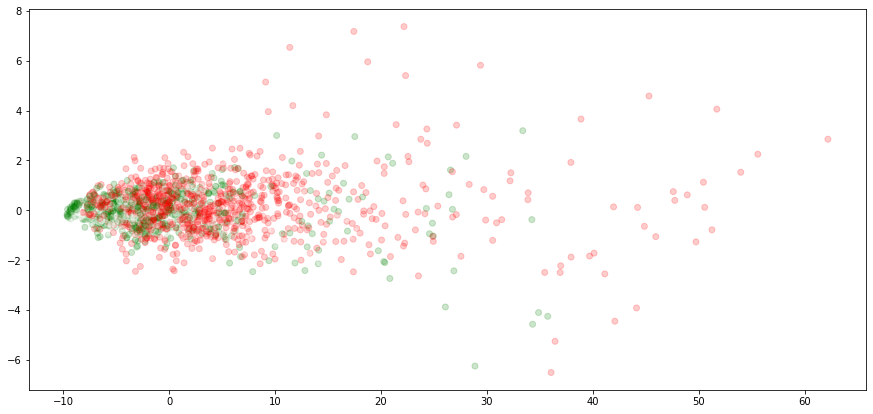

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(np.asarray(df))
pdf = pd.DataFrame(data = principalComponents
             , columns = ['one', 'two'])
a = pdf['one'].tolist()
b = pdf['two'].tolist()
plt.figure(figsize=(15,7))
plt.scatter(a,b, c = labels, alpha = 0.2);
#plt.axis([-10,20, -0.5,0.5]);

## TSNE

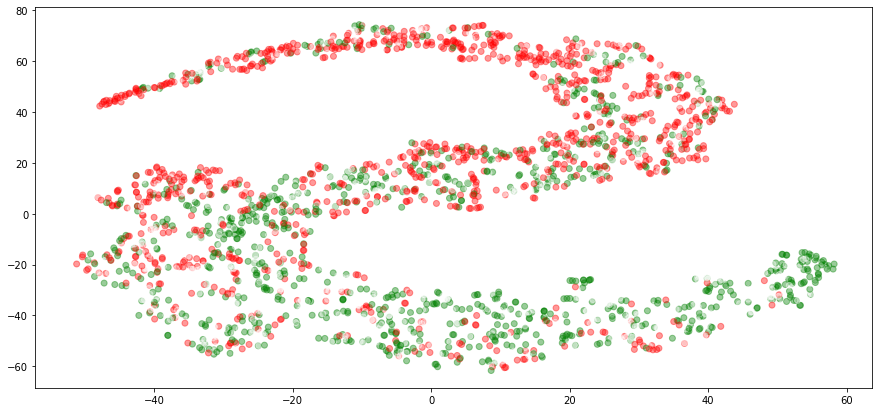

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=0)
tsne_results = tsne.fit_transform(np.asarray(df))
pdf = pd.DataFrame(data = tsne_results, columns = ['one', 'two'])
a = pdf['one'].tolist()
b = pdf['two'].tolist()
plt.figure(figsize=(15,7))
plt.scatter(a,b, c = labels, alpha = 0.4);

with features as 

cols = ['pct', 'vix', 'std_5', 'o_c', 'h_l', 'vol_sma_ema', 'vol_sma_ema_20', 'vol_spot_ema',
        'spot_sma_10', 'sma_10_20', 'sma_10_50',
       'spot_ema_10', 'ema_sma_10', 'ema_sma_20', 'vix_ema', 'vix_ema_sma_10', 'vix_ema_sma_20']

vix shows segregation in pca and tsne while spx does not much improve even for longer periods of time. Red is where it reduced and green increased significantly. White is buffer zone. 

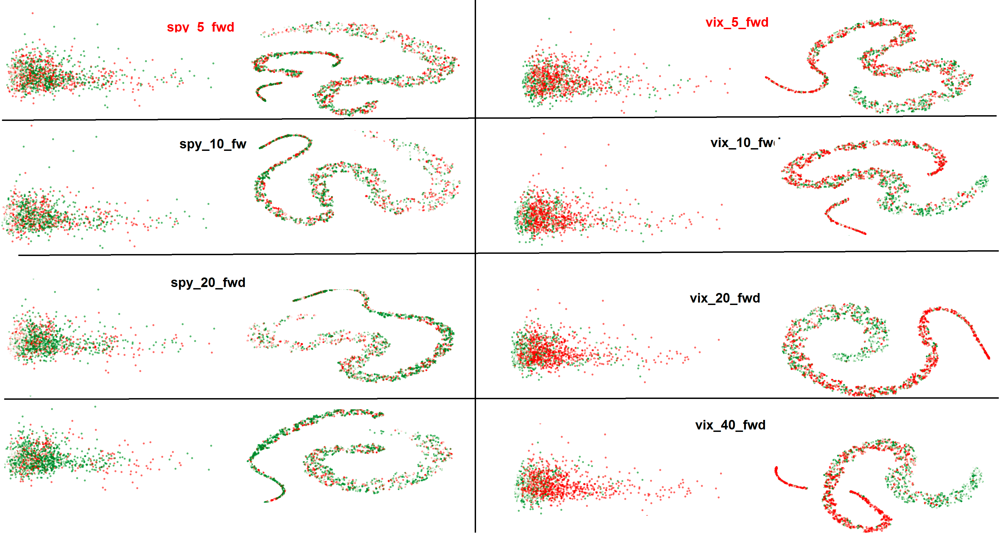

### More labels

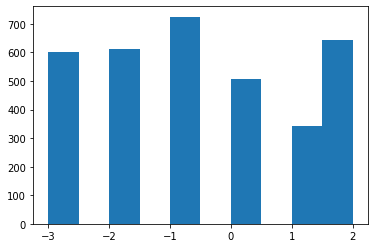

In [ ]:
df = spy[cols]
target = spy['fwd_20_vix']
labels = []
thresh = 0.08
for i in range(len(target)):
  if target[i] > 2*thresh:
    labels.append(2)
  elif target[i] > thresh and target[i]< 2*thresh:
    labels.append(1)
  elif target[i] > 0 and target[i]< thresh:
    labels.append(0)
  elif target[i] > -thresh and target[i]< 0:
    labels.append(-1)
  elif target[i] > -2*thresh and target[i]< -thresh:
    labels.append(-2)
  else:
    labels.append(-3)
plt.hist(labels);

### Use GPU

In [ ]:
import tensorflow as tf

# Get the GPU device name.
device_name = tf.test.gpu_device_name()

# The device name should look like the following:
if device_name == '/device:GPU:0':
    print('Found GPU at: {}'.format(device_name))
else:
    raise SystemError('GPU device not found')

Found GPU at: /device:GPU:0


## Model

### LSTM

In [ ]:
x = np.asarray(df)
scaler = MinMaxScaler(feature_range=(0.00001, 1)) 
x = scaler.fit_transform(x)
y = np.asarray(label)
x, y = windower(x,y,20,1)
y = OHE(y)
print(np.shape(x), np.shape(y))

(3311, 20, 13) (3311, 3)


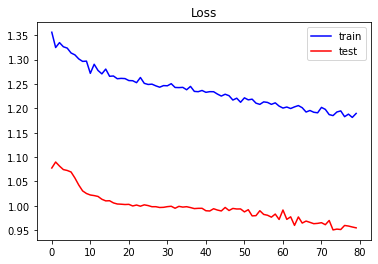

it took  37
              precision    recall  f1-score   support

           0       0.37      0.43      0.40       131
           1       0.63      0.54      0.58       242
           2       0.51      0.56      0.53       139

    accuracy                           0.52       512
   macro avg       0.50      0.51      0.50       512
weighted avg       0.53      0.52      0.52       512



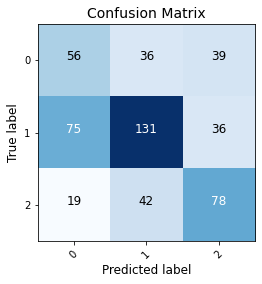

In [ ]:
t = time.time()
epochs = 80
train_ratio = 0.8
lr = 0.0009
batch_size = 128
x_train, y_train, x_test, y_test = test_train_split(x, y, batch_size, train_ratio)
fix_rnd_Keras() # fixing rnd of calculations
model = Sequential()
model.add(LSTM(units = 20, batch_input_shape=(batch_size, x_train.shape[1], x_train.shape[2]),
               stateful=True))#, return_sequences = True))

model.add(Dropout(0.5))
model.add(Dense(units = 3, activation='softmax'))
opt = Adam(lr = lr)
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
history = model.fit(x_train, y_train, validation_data=(x_test, y_test), 
              epochs = epochs, batch_size = batch_size, verbose = 0, shuffle=False, class_weight = {0:1.2, 1:0.99, 2:1.6})
pyplot.title('Loss')
pyplot.plot(history.history['loss'], label='train', color = 'blue')
pyplot.plot(history.history['val_loss'], label='test', color = 'red')
pyplot.legend()
pyplot.show()

prediction_test = model.predict(x_test, batch_size = batch_size)
prediction_train = model.predict(x_train, batch_size = batch_size)

print('it took ', round(time.time()-t))
# model.summary()
preds = []
Ys = []
for i in range(len(prediction_test)):
    preds.append(np.argmax(prediction_test[i]))
    Ys.append(np.argmax(y_test[i]))
pretty_print_conf_matrix(Ys,preds, classes= list(range(len(np.unique(labels)))),normalize=False, title='Confusion Matrix')
rpt = classification_report(Ys, preds, target_names = ['0', '1', '2'] )
print(rpt)

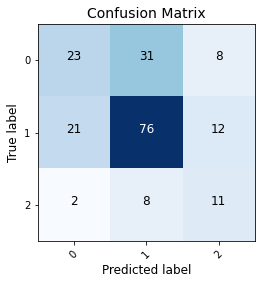

In [ ]:
preds = []
Ys = []
for i in range(len(prediction_test)):
    preds.append(np.argmax(prediction_test[i]))
    Ys.append(np.argmax(y_test[i]))
pretty_print_conf_matrix(Ys,preds, classes= list(range(len(np.unique(labels)))),normalize=False, title='Confusion Matrix')

## RF

(3331, 15) (3331,)
0.890015015015015 0.4332833583208396 30 45 10 5
random sampling gives accuracy of:  0.351
always selecting the max class:  0.405
              precision    recall  f1-score   support

           0       0.30      0.45      0.36       184
           1       0.43      0.34      0.38       270
           2       0.66      0.54      0.59       213

    accuracy                           0.43       667
   macro avg       0.46      0.44      0.44       667
weighted avg       0.47      0.43      0.44       667



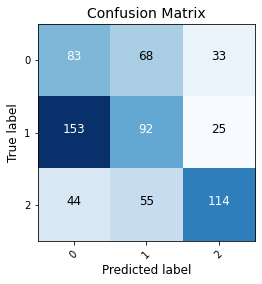

In [ ]:
x = np.asarray(df)
train_ratio = 0.8
len_train = int(len(x)*train_ratio)
scaler = MinMaxScaler(feature_range=(0.00001, 1)) 
x = scaler.fit_transform(x)
y = np.asarray(label)
print(np.shape(x), np.shape(y))
x_train, y_train, x_test, y_test = x[:len_train], y[:len_train],x[len_train:], y[len_train:]
n_estimators, max_depths, min_samples_split, min_samples_leaf = [30], [45], [10], [5]

for estimators in n_estimators:   
    for max_depth in max_depths:
        for min_sample_split in min_samples_split:
            for min_sample_leaf in min_samples_leaf:
                model = RandomForestClassifier(n_estimators = estimators, max_depth = max_depth,
                   min_samples_split = min_sample_split, min_samples_leaf = min_sample_leaf, 
                   random_state = 13, class_weight = {0:1.4,1:0.6, 2:0.99})
                model.fit(x_train, y_train)  
                prediction_train = model.predict(x_train)
                prediction_test = model.predict(x_test)
                print(accuracy_score(y_train, prediction_train),
        accuracy_score(y_test, prediction_test),estimators, max_depth, min_sample_split,min_sample_leaf)
                
print('random sampling gives accuracy of: ',round(accuracy_score(sample(list(y_test),(len(y_test))),y_test),3))
print('always selecting the max class: ',round(accuracy_score(len(y_test)*[1],y_test),3))
pretty_print_conf_matrix(y_test,prediction_test, classes= list(range(len(np.unique(labels)))),normalize=False, title='Confusion Matrix')
rpt = classification_report(y_test, prediction_test, target_names = ['0', '1', '2'] )
print(rpt)

[30], [45], [10], [5]
0.7 and o.52 for precision and f1 of class 2

class_weight = {0:1,1:0.8, 2:0.5}

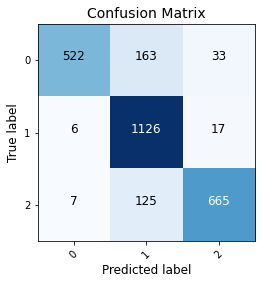

In [ ]:
pretty_print_conf_matrix(y_train,prediction_train, classes= list(range(len(np.unique(labels)))),normalize=False, title='Confusion Matrix')

In [ ]:
col_vix

['vix',
 'vix_ema',
 'vix_ema_sma_10',
 'vix_ema_sma_20',
 'vix_res10',
 'vix_res20',
 'vix_res50',
 'vix_sup10',
 'vix_sup20',
 'vix_sup50']

In [ ]:
feature_importances = pd.DataFrame({'importance':model.feature_importances_, 'feature' :cols})
feature_importances = feature_importances.round(3)
feature_importances.columns =['feature', 'importance']
feature_importances = feature_importances.sort_values('feature', ascending = False).reset_index(drop=True)
feature_importances

,feature,importance
0,0.114,vix
1,0.055,vix_sup50
2,0.052,sma_10_50
3,0.050,gld_ema_10_50
4,0.042,std_5
5,0.042,vix_sup20
6,0.041,tlt_ema_10_50
7,0.040,vix_res50
8,0.031,ema_sma_20
9,0.030,h_l


### SHAP

In [ ]:
explainerRF = shap.TreeExplainer(model, x_train)

Passing 2664 background samples may lead to slow runtimes. Consider using shap.sample(data, 100) to create a smaller background data set.


In [ ]:
shap_values = explainerRF.shap_values(x_train[:5])


 93%|=================== | 14/15 [00:18<00:01]       

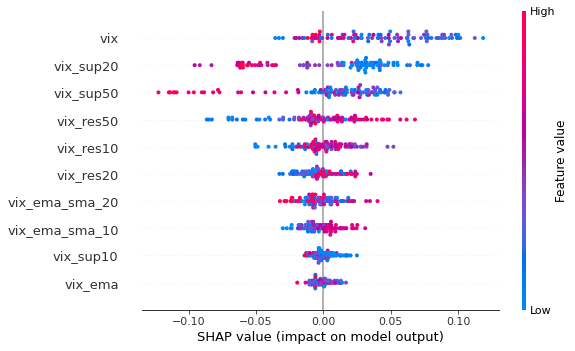

In [ ]:
shap.summary_plot(shap_values[0], x_train[:100], feature_names=col_vix) # volitility increases

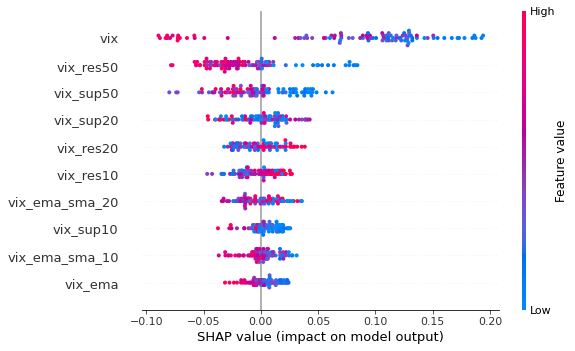

In [ ]:
shap.summary_plot(shap_values[1], x_train[:100], feature_names=col_vix)

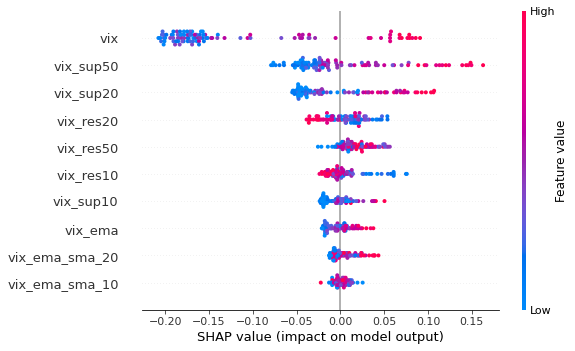

In [ ]:
shap.summary_plot(shap_values[2], x_train[:100], feature_names=col_vix) # class for vol decreases. 

In [ ]:
shap.summary_plot(shap_values, x_train, feature_names=col_vix)

## Linear reg

(3331, 10) (3331,)
0.07069405518536842
train:  -12.15
test:  -15.75


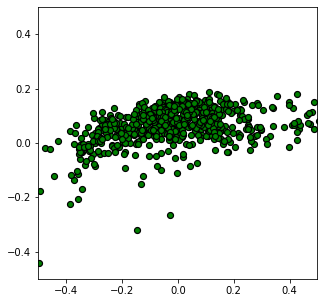

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score

x = np.asarray(df)
train_ratio = 0.8
len_train = int(len(x)*train_ratio)
scaler = MinMaxScaler(feature_range=(0.00001, 1)) 
x = scaler.fit_transform(x)
y = np.asarray(target)
print(np.shape(x), np.shape(y))
x_train, y_train, x_test, y_test = x[:len_train], y[:len_train],x[len_train:], y[len_train:]
model = LinearRegression()
model.fit(x_train, y_train)
print(model.score(x_train, y_train))
model.score(x_test, y_test)
prediction_test = model.predict(x_test)
prediction_train = model.predict(x_train)
print('train: ', round(r2_score(prediction_train, y_train), 2))
print('test: ', round(r2_score(prediction_test, y_test), 2))
plt.figure(figsize=(5,5))
plt.scatter(y_test, prediction_test, marker = 'o',edgecolor='black', linewidth=1.2, color = 'green');
plt.axis([-0.5,0.5, -0.5,0.5]);

## NN

(3331, 15) (3331,)


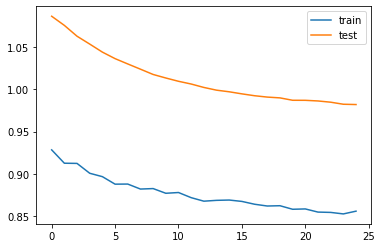

it took:  3
0.001 200 128 Accuracy: 40.18%
              precision    recall  f1-score   support

           0       0.31      0.65      0.42       184
           1       0.24      0.06      0.10       270
           2       0.63      0.62      0.63       213

    accuracy                           0.40       667
   macro avg       0.39      0.44      0.38       667
weighted avg       0.38      0.40      0.35       667

random sampling gives accuracy of:  0.337
always selecting the max class:  0.405


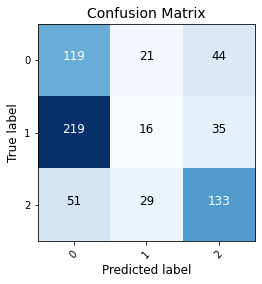

In [ ]:
t = time.time()
x = np.asarray(df)
train_ratio = 0.8
len_train = int(len(x)*train_ratio)
scaler = MinMaxScaler(feature_range=(0.00001, 1)) 
x = scaler.fit_transform(x)
y = np.asarray(label)
print(np.shape(x), np.shape(y))
x_train, y_train, x_test, y_test = x[:len_train], y[:len_train],x[len_train:], y[len_train:]

softmax_units = len(np.unique(labels))
#for loops were used to get to these optimal values for units, lr, epochs, etc:
units = [ 200]
epochs = 25
batch_sizes = [ 128]
lrs = [0.001]
fix_rnd_Keras() # fixing rnd of calculations

for lr in lrs:
    for unit in units:
        for batch_size in batch_sizes:
            model_nn = Sequential()
            model_nn.add(Dense(units = unit,input_dim = x_train.shape[1], activation='relu'))
            model_nn.add(Dropout(0.5))
            
            model_nn.add(Dense(units = softmax_units,  activation='softmax'))
            opt = SGD(lr=lr, momentum=0.9, decay=0.001)
            opt = Adam(lr = lr)
            model_nn.compile(optimizer = opt, loss='sparse_categorical_crossentropy' ,  metrics=['accuracy'])
            history = model_nn.fit(x_train, y_train, epochs = epochs, batch_size = batch_size,validation_data=(x_test, y_test),
                  verbose = 0, shuffle=False, class_weight = {0:1.0,1:0.64, 2:0.99})
            pyplot.plot(history.history['loss'], label='train')
            pyplot.plot(history.history['val_loss'], label='test')
            pyplot.legend()
            pyplot.show()
            scores = model_nn.evaluate(x_test, y_test, verbose=0)
            print('it took: ', round(time.time()-t))
            print(lr,unit, batch_size, "Accuracy: %.2f%%" % (scores[1]*100))
            pred = model_nn.predict(x_test) 
            preds = []
            for i in range(len(pred)):
                preds.append(np.argmax(pred[i]))
            pretty_print_conf_matrix(y_test,preds, classes= list(range(len(np.unique(labels)))),normalize=False, title='Confusion Matrix')

            rpt = classification_report(y_test, preds, target_names = ['0', '1', '2'] )
            print(rpt)
print('random sampling gives accuracy of: ',round(accuracy_score(sample(list(y_test),(len(y_test))),y_test),3))
print('always selecting the max class: ',round(accuracy_score(len(y_test)*[1],y_test),3))



vix features:
0.01 200 256
precision of 0.7 and f1 of 0.6 for class 2.

{0:1.4,1:0.99, 2:0.9}

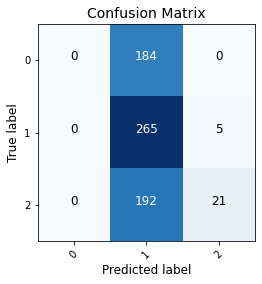

In [ ]:
pred = model_nn.predict(x_test) 
preds = []
for i in range(len(pred)):
    preds.append(np.argmax(pred[i]))
pretty_print_conf_matrix(y_test,preds, classes= list(range(len(np.unique(labels)))),normalize=False, title='Confusion Matrix')

In [ ]:
rpt = classification_report(y_test, preds, target_names = ['0', '1', '2'] )
print(rpt)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       184
           1       0.41      0.98      0.58       270
           2       0.81      0.10      0.18       213

    accuracy                           0.43       667
   macro avg       0.41      0.36      0.25       667
weighted avg       0.43      0.43      0.29       667



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
explainerRF = shap.TreeExplainer(model, x_train)
shap_values = explainerRF.shap_values(x_train)
shap.summary_plot(shap_values[0], x_train[:100], plot_type='bar', color='brown')

Passing 2664 background samples may lead to slow runtimes. Consider using shap.sample(data, 100) to create a smaller background data set.
  2%|                   | 161/7992 [03:24<165:22]       

## reTest Past work

In [ ]:
def difference_pct_back(datafile, lag = 1):
    diff = [0] * lag
    for i in range(lag,len(datafile)):
        diff.append(datafile[i]/datafile[i-lag]-1)
    return diff

def EMA(df, EMA_days):
    sma = np.mean(df[0:EMA_days])
    EMA_list = [0] * (EMA_days - 1)
    EMA_list.append(sma)
    c = 2/(1+EMA_days)
    for i in range(EMA_days,len(df)):
        a = EMA_list[i-1]*(1-c)+ c*df[i]
        EMA_list.append(a)
    return(EMA_list)

def SMA(df, sma_days):
    sma_list = [0] * (sma_days - 1)
    for i in range(sma_days, len(df)+1):
        sma_list.append(np.mean(df[i-sma_days:i]))
    return(sma_list)

def y_classifier(array, threshold):
    classes = []
    for i in range(len(array)):
        if array[i,0] > threshold:
            classes.append(1)
        elif array[i,0] < -1*threshold:
            classes.append(-1)
        else:
            classes.append(0)
    return np.asarray(classes)

def create_dataset_percentage_gap(dataset, window_size, look_forward, gap): #MinMaxScaler(feature_range=(0, 1)) 
    i = 0
    data_X, data_Y = [], []
    while i in range(len(dataset) - window_size - look_forward):
        a = dataset[i:(i + window_size), :]
        data_X.append(a)
        b = dataset[i + window_size + look_forward-1, 0]/dataset[i+window_size-1,0]-1
        data_Y.append(b)
        i += gap
        
    x = np.array(data_X)
    y = np.array(data_Y)
    y = y.reshape(-1,1)
    return (x,y)

#split x and y to test and train that are devisible to batch_size
def test_train_split(x, y, batch_size, train_ratio):       
    train_length = int(len(x)*train_ratio)
    for i in range(train_length, train_length+batch_size):
        remainder = i%batch_size
        if remainder == 0:
            train_length = i
            break
    x_train = x[:train_length,:]
    y_train = y[:train_length]

    for i in range(len(x)-batch_size, len(x)):
        remainder = i%batch_size
        if remainder == 0:
            train_length_test = i
            break
    x_test = x[train_length:train_length_test,:]
    y_test = y[train_length:train_length_test]
    return x_train, y_train, x_test, y_test

In [ ]:
DF = pdr.get_data_yahoo('SPY', start = '2000-01-01', end = '2017-10-1')

df = DF.Close
df = df.dropna(axis=0, how='any')

#making moving averages
v_10 = SMA(DF.Volume, 10)
v_20 = SMA(DF.Volume, 20)
open_close = (DF.Close/DF.Open - 1).tolist()
high_low = (DF.High/DF.Low - 1).tolist()
EMA_8 = EMA(df,8)
SMA_10 = SMA(df,10)
SMA_20 = SMA(df,20)
SMA_50 = SMA(df,50)
SMA_100 = SMA(df,100)
pct_day = difference_pct_back(df, 1)
list_df = df.tolist()
vol_list = DF.Volume.tolist()
MAs = pd.DataFrame(list(zip(list_df, pct_day, vol_list, v_10, v_20,open_close,high_low, EMA_8, SMA_10, 
                            SMA_20, SMA_50, SMA_100)),columns=['spot', 'pct_day', 'vol', 'v_10', 'v_20',
                            'open_close', 'high_low', 'EMA_8', 'SMA_10', 'SMA_20', 'SMA_50','SMA_100'])

#removing all rows with 0 in them
MAs = MAs[100:]
MAs = MAs.reset_index(drop=True)

#making differences as features
MAs['v10'] = MAs.vol/MAs.v_10 - 1
MAs['v20'] = MAs.vol/MAs.v_20 - 1
MAs['spot_EMA'] = MAs.spot/MAs.EMA_8 - 1
MAs['spot_20SMA'] = MAs.spot/MAs.SMA_20 - 1
MAs['spot_50SMA'] = MAs.spot/MAs.SMA_50 - 1
MAs['spot_100SMA'] = MAs.spot/MAs.SMA_100 - 1
MAs['10_100_SMA'] = MAs.SMA_10/MAs.SMA_100 - 1
MAs['20_50_SMA'] = MAs.SMA_20/MAs.SMA_50 - 1
MAs = MAs.drop(['EMA_8', 'SMA_10', 'SMA_20', 'SMA_50', 'SMA_100', 'v_10', 'v_20'], 1)

In [ ]:
train_ratio = 0.8
batch_size = 8
look_forward = 20
n_estimators, max_depths, min_samples_split, min_samples_leaf = [12], [40], [10], [4]
n_estimatorsl, max_depthl, min_samples_splitl, min_samples_leafl, long_fscores = [], [], [], [], []
long_prec ,cash_prec, short_prec, long_recal, cash_recal, short_recal, long_prec_tr =  [],[],[],[],[],[],[]
cash_prec_tr, short_prec_tr, long_recal_tr, cash_recal_tr, short_recal_tr =  [], [], [], [], []

for estimators in n_estimators:   
    for max_depth in max_depths:
        for min_sample_split in min_samples_split:
            for min_sample_leaf in min_samples_leaf:
                scaler = MinMaxScaler(feature_range=(0.00001, 1)) 
                MAs_scaled = scaler.fit_transform(MAs)
                x, y_scaled = create_dataset_percentage_gap(MAs_scaled, 1, look_forward,1)
                MAs_array = MAs.values
                x_scaled, y = create_dataset_percentage_gap(MAs_array, 1, look_forward,1)
                y = y_classifier(y, 0.02)
                x = x.reshape(len(x), -1)
                
                x_train, y_train, x_test, y_test = test_train_split(x, y, batch_size, train_ratio)
                model = RandomForestClassifier(n_estimators = estimators, max_depth = max_depth,
                   min_samples_split = min_sample_split, min_samples_leaf = min_sample_leaf, random_state = 413)
                model.fit(x_train, y_train)  
                prediction_train = model.predict(x_train)
                prediction_test = model.predict(x_test)
                print(accuracy_score(y_train, prediction_train),
        accuracy_score(y_test, prediction_test),estimators, max_depth, min_sample_split,min_sample_leaf)

0.9135057471264367 0.5911214953271028 12 40 10 4


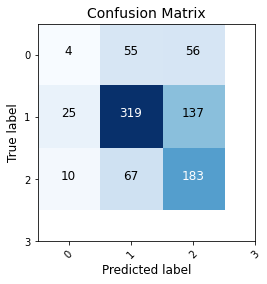

In [ ]:
pretty_print_conf_matrix(y_test,prediction_test, classes= list(range(4)),normalize=False, title='Confusion Matrix')

- random sampling as benchmark.

- Shap.



